
<img style="float: left; width: 370px; height:200px" src="images/pha.jpg">


## <font color="grey"> Cytokine responses to viruses and bacteria at the population level</font>

---

### Lijing Lin, Aug 2020

<p>
 <font color="grey">
<small>
<p> Analyses here are for the paper:  <i> A systems immunology approach to describe the architecture of cytokine responses to viruses and bacteria at the population level. </i>


</p></small>


***




Data used here is generated from MATLAB files: 
* ``../MATLABcodes/dataPreprocessing_new.m``
* ``../MATLABcodes/missImputePPCA.m``


# Notebook setup

In [1]:
from lib import *


%matplotlib inline
%config InlineBackend.figure_format = 'retina'#'svg'
matplotlib.rcParams['figure.figsize'] =  (8,5)
matplotlib.rcParams['text.usetex'] = False
matplotlib.rcParams['font.size'] = 10
matplotlib.rcParams['font.family'] = 'sans-serif'


# To supress FutureWarning: 
# Panel is deprecated and will be removed in a future version.
# The recommended way to represent these types of 3-dimensional data are with a MultiIndex on a DataFrame, via the Panel.to_frame() method
# Alternatively, you can use the xarray package http://xarray.pydata.org/en/stable/.
# Pandas provides a `.to_xarray()` method to help automate this conversion.

#   import sys

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)


System info:
3.8.8 (default, Apr 13 2021, 12:59:45) 
[Clang 10.0.0 ]
IPython version is (7, 29, 0, '')
Package Versions:
  scikit-learn: 0.24.1
  scipy: 1.6.2
  statsmodels: 0.12.2
  Numpy: 1.19.5
  Seaborn: 0.11.1
  Pandas: 1.2.4


In [2]:
import datetime
import os
now = datetime.datetime.now().strftime("%Y-%m-%d-%H")
cwd = os.getcwd()
OutputDir = cwd + '/paper1Output_' + now + '/'

print('Output Dir: %s' % OutputDir)

if not os.path.exists(OutputDir):
    os.makedirs(OutputDir)

Output Dir: /Users/mbbxgll2/FLS/Project/code/BioInf_Github/Systems-Immunology/Year11/AnalysisNotebooks/paper1Output_2022-06-03-04/


In [3]:
# # read from matlab file
# mycolor = scipy.io.loadmat('mycolor50.mat') 
# mycolor = mycolor['mycolor50']
# mycolor = mycolor.tolist()[0][-1].tolist() # make it a proper list


# or use the following list directly
mycolor = ['#0000FF', '#FF0000', '#00FF00', '#00002C', '#FF1AB9', '#FFD300',
           '#005800', '#8484FF', '#9E4F46', '#00FFC1', '#008495', '#00007B',
           '#95D34F', '#F69EDC', '#D312FF', '#7B1A6A', '#F61261', '#FFC184',
           '#232309', '#8DA77B', '#F68409', '#847200', '#72F6FF', '#9EC1FF',
           '#72617B', '#9E0000', '#004FFF', '#004695', '#D3FF00', '#B94FD3',
           '#3E001A', '#EDFFB0', '#FF7B61', '#46FF7B', '#12A761', '#D3A7A7',
           '#D34F84', '#6A00C1', '#2C6146', '#0095F6', '#093E4F', '#A75809',
           '#72613E', '#099500', '#9E6AB9', '#FFFF72', '#A7F6CA', '#95B0B9',
           '#B0B009', '#2C004F']

mycolor.remove(mycolor[3])  # remove black
mycolor.remove(mycolor[-5])  # remove light yellow


# Load Data
---
We have two main types of data: raw data (log2 transformed) and missing-imputed data. For each type of data, we generate two data sets: one leaving media as independent variable (varibles with suffix _log) and the other one with data normalised by media (varibles ended _nrm), i.e., subtracting log-media from log-response. Therefore we ended up with five data variables:

* ``datapanel_raw``: raw data with batch effect removed 28*307*16
* ``datapanel_raw_log``: log2 data with batch adjusted data
* ``datapanel_raw_nrm``: normalise data first and then do batch adjustment; 
* ``datapanel_log``: impute missing data in datapanel_raw_log
* ``datapanel_nrm``: impute missing data in datapanel_raw_nrm


In [4]:
Data = scipy.io.loadmat('data/cytoData.mat')   # 
    
number = Data['number'].flatten()

In [5]:
from importlib import reload
import lib.loadData as loadData
reload(loadData)
# data folder
dataDir = os.path.abspath('data')

cytolabel,stimlabel = loadData.load_labels(dataDir)
meanFold = loadData.load_meanFoldChange(dataDir)

datapanel_raw, datapanel_raw_nrm, datapanel_raw_log, datapanel_nrm, datapanel_log  =  \
                                            loadData.load_cytokine(dataDir,batch_adjust=True)
print('cytokine labels: \n' + ', '.join(cytolabel) + '\n')
print('stimulus labels: \n' + ', '.join(stimlabel) + '\n')


cytokine labels: 
IFN-alpha2, IFN-beta, IFN-gamma, IFN-lambda1(IL-29), TNF, IL-1beta, IL-2, IL-4, IL-5, IL-6, IL-8(CXCL8), IL-10, IL-12p70, IL-13, IL-15, IL-16, IL-17, IL-18, IL-25, IL-33, Eotaxin-1(CCL11), Eotaxin-3(CCL26), IP-10(CXCL10), MIP1beta(CCL4), MCP1(CCL2), MCP4(CCL13), MDC(CCL22), TARC(CCL17)

stimulus labels: 
media, RSV, RV1B, RV16, polyIC, R848, CpGA, Strpn, LTA, Hin, LPS, PHA, PAM, PGN, FSL, Fla



In [6]:
idYr11 = datapanel_raw_nrm.index.values

In [7]:
datapanel_raw_nrm.head()

cytokine IFN-alpha2                                                    \
stimulus        RSV      RV1B      RV16    polyIC      R848      CpGA   
number                                                                  
11003      7.494080  2.449607  6.032136  2.277075  7.659796  6.917111   
11005      5.813034  4.110596  5.341024  0.001200  4.142624  4.660614   
11011           NaN       NaN  2.035934       NaN       NaN       NaN   
11024      8.861873  4.055691  6.622632  1.703658  6.055235  8.771967   
11028      4.528860  1.989260  2.083269       NaN       NaN       NaN   

cytokine                                          ... TARC(CCL17)            \
stimulus     Strpn       LTA       Hin       LPS  ...        CpGA     Strpn   
number                                            ...                         
11003     1.404372       NaN  2.079398  1.313996  ...    0.086210  0.312083   
11005     0.233042  1.171063 -0.104168  0.189789  ...    0.021985  0.150039   
11011          NaN       NaN       NaN       NaN  ...         NaN       NaN   
11024     0.835831  0.926205  1.490439  0.926205  ...   -0.227371  0.055066   
11028    -0.105301       NaN  0.395876       NaN  ...         NaN  0.965232   

cytokine                                                              \
stimulus       LTA       Hin       LPS       PHA       PAM       PGN   
number                                                                 
11003          NaN  0.069083  0.312083  1.211645       NaN       NaN   
11005     0.189101  0.308641  0.226595  1.337105  0.394355  0.424574   
11011          NaN       NaN       NaN       NaN       NaN       NaN   
11024     0.092944  0.028955 -0.128908  0.966431  0.475890 -0.299112   
11028          NaN  0.787663       NaN  0.365212       NaN       NaN   

cytokine                      
stimulus       FSL       Fla  
number                        
11003          NaN       NaN  
11005     2.109163  0.051995  
11011          NaN       NaN  
11024     0.424680 -0.227371  
11028          NaN       NaN  

[5 rows x 420 columns]

An example of exporting part of the data for other use.

In [8]:
# Strpn_yr11 = datapanel_nrm.loc[:,:,'Strpn']
# Strpn_yr11.to_csv(OutputDir + 'Strpn_yr11.csv')


# Hin_yr11 = datapanel_nrm.loc[:,:,'Hin']
# Hin_yr11.to_csv(OutputDir + 'Hin_yr11.csv')

# PHA_yr11 = datapanel_nrm.loc[:,:,'PHA']
# PHA_yr11.to_csv(OutputDir + 'PHA_yr11.csv')


# RSV_yr11 = datapanel_nrm.loc[:,:,'RSV']
# RSV_yr11.to_csv(OutputDir + 'RSV_yr11.csv')

# RV1B_yr11 = datapanel_nrm.loc[:,:,'RV1B']
# RV1B_yr11.to_csv(OutputDir + 'RV1B_yr11.csv')


# RV16_yr11 = datapanel_nrm.loc[:,:,'RV16']
# RV16_yr11.to_csv(OutputDir + 'RV16_yr11.csv')

In [9]:
meanFold.head(2)

,RSV,RV1B,RV16,polyIC,R848,CpGA,Strpn,LTA,Hin,LPS,PHA,PAM,PGN,FSL,Fla
IFN-alpha2,345,21,145,2,54,511,1,1,1,2,1,1,1,1,1
IFN-beta,6,1,1,1,1,1,2,1,8,1,1,1,1,1,1


### Check missing rate for each cytokine

In [10]:

def missing_rate(datapanel):
    ms_rate = []
    for cyto in datapanel.iteritems():
        c = cyto[0]   # key (item name)
        _df = cyto[1] # item
        rs = []
        for stim in _df.iteritems(): 
            nm = stim[0] # key (column name)
            _s = stim[1]
            rs.append(sum(np.isnan(_s))*1.0/len(_s)*100)
        ms_rate.append(rs)
    ms_rate = np.vstack(ms_rate)        
    stimlabel = datapanel.minor_axis.values
    cytolabel = datapanel.items.values
    ms_rate = pd.DataFrame(ms_rate,columns=stimlabel,index=cytolabel)
    return ms_rate


In [11]:
# datapanel = datapanel_raw.copy()
# ms_rate = missing_rate(datapanel)

# ms_rate.head()


In [13]:
datapanel_raw_nrm.head()

cytokine IFN-alpha2                                                    \
stimulus        RSV      RV1B      RV16    polyIC      R848      CpGA   
number                                                                  
11003      7.494080  2.449607  6.032136  2.277075  7.659796  6.917111   
11005      5.813034  4.110596  5.341024  0.001200  4.142624  4.660614   
11011           NaN       NaN  2.035934       NaN       NaN       NaN   
11024      8.861873  4.055691  6.622632  1.703658  6.055235  8.771967   
11028      4.528860  1.989260  2.083269       NaN       NaN       NaN   

cytokine                                          ... TARC(CCL17)            \
stimulus     Strpn       LTA       Hin       LPS  ...        CpGA     Strpn   
number                                            ...                         
11003     1.404372       NaN  2.079398  1.313996  ...    0.086210  0.312083   
11005     0.233042  1.171063 -0.104168  0.189789  ...    0.021985  0.150039   
11011          NaN       NaN       NaN       NaN  ...         NaN       NaN   
11024     0.835831  0.926205  1.490439  0.926205  ...   -0.227371  0.055066   
11028    -0.105301       NaN  0.395876       NaN  ...         NaN  0.965232   

cytokine                                                              \
stimulus       LTA       Hin       LPS       PHA       PAM       PGN   
number                                                                 
11003          NaN  0.069083  0.312083  1.211645       NaN       NaN   
11005     0.189101  0.308641  0.226595  1.337105  0.394355  0.424574   
11011          NaN       NaN       NaN       NaN       NaN       NaN   
11024     0.092944  0.028955 -0.128908  0.966431  0.475890 -0.299112   
11028          NaN  0.787663       NaN  0.365212       NaN       NaN   

cytokine                      
stimulus       FSL       Fla  
number                        
11003          NaN       NaN  
11005     2.109163  0.051995  
11011          NaN       NaN  
11024     0.424680 -0.227371  
11028          NaN       NaN  

[5 rows x 420 columns]

## Descriptive statistics

### Normality test

In [261]:
snpID = pd.read_excel('data/SNP_ID.xlsx',header=0,index_col=False)

In [4]:
import scipy

In [266]:
# data = pd.read_excel('data/Year11_imputedData_mediaNormalised.xlsx',header=[0,1],index_col=0)
data = pd.read_excel('data/Year11_nonImputed_mediaNormalised.xlsx',header=[0,1],index_col=0)
ID = data.index.intersection(snpID.number)

IL6nrm = data.loc[ID,:].xs('IL-6',level='cytokine',axis=1)


bac =  ['Hin','Strpn','LPS','PAM','PGN','FSL','Fla','LTA']

In [267]:
IL6nrm_s = IL6nrm.apply(lambda x: (x-np.nanmean(x))/x.std())

In [268]:
# data = pd.read_excel('data/Year11_imputedData_mediaNormalised.xlsx',header=[0,1],index_col=0)
data = pd.read_csv('data/cyto_stim_pairs_year11_raw_LowResponseReplacedWithHalfDtm_Mauro.csv',header=[0,1],index_col=0)
ID = data.index.intersection(snpID.number)

IL6raw = data.loc[ID,:].xs('IL-6',level='cytokine',axis=1)
# IL6log = data.xs('IL-6',level='Cytokine',axis=1).apply

bac =  ['Hin','Strpn','LPS','PAM','PGN','FSL','Fla','LTA']

In [269]:
IL6raw

stimulus,media,RSV,RV1B,RV16,R848,CpGA,Strpn,LTA,Hin,LPS,PHA,PAM,PGN,FSL,Fla
number,,,,,,,,,,,,,,,
11003,223.09800,1040.550,510.2750,694.5130,1220.590,284.9360,763.5460,NaN,1560.7100,1442.92,738.098,NaN,NaN,NaN,NaN
11005,8.78416,461.876,28.5937,92.2028,354.191,17.9263,270.8020,1987.54,3805.3300,2564.35,337.437,1290.700,966.108,8273.150,1865.550
11011,64.86290,NaN,NaN,3000.6400,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
11024,57.05330,597.064,1859.5900,188.7530,1011.800,97.3203,1595.8200,5351.34,3248.8900,3685.22,413.147,2615.400,2404.570,5857.780,4607.990
11038,194.41700,639.674,319.4100,400.4260,530.563,235.9780,377.1500,1372.67,1276.7200,1242.73,553.962,808.066,11951.000,772.191,1037.510
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37048,21.03910,562.985,34.8306,196.5490,463.182,71.5170,138.7200,1623.97,1132.7300,1319.29,225.951,710.853,637.245,519.108,840.078
37051,104.99000,1420.310,229.3420,2589.5500,21545.400,NaN,9546.9100,NaN,13388.9000,21709.80,8359.390,NaN,NaN,NaN,NaN
37053,21.66310,529.624,48.1018,148.6780,598.203,24.7923,934.5190,2974.59,1712.5900,2674.92,488.884,1707.830,1901.310,758.481,2921.130


In [72]:
# IL6[IL6<0] = np.nan

/var/folders/ns/5ntk7y397m30bygg7z5hdwpm0000gp/T/ipykernel_42013/3972403358.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  IL6[IL6<0] = np.nan
/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:3215: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._where(-key, value, inplace=True)


In [73]:
# IL6 = pd.read_excel('Cytokine_Rawdata_MediaSubtracted_Zeroed.xlsx',sheet_name='IL-6',index_col=0)


# bac = ['IL-6_' + s for s in ['Hin','Strpn','LPS','PAM','PGN','FSL','Fla','LTA']]

In [ ]:
# BatchAdjusted_raw.csv
# BatchAdjusted_raw_nrm_log2.csv
# BatchAdjusted_raw_nrm_log10.csv

# IL6 = pd.read_csv('data/BatchAdjusted_raw_nrm_log2.csv',index_col=[0,1]).xs('IL-6',level=1)


# bac =  ['Hin','Strpn','LPS','PAM','PGN','FSL','Fla','LTA']

In [155]:
import re

In [169]:
# IL6raw = pd.read_csv('data/BatchAdjusted_raw.csv',index_col=[0,1]).xs('IL-6',level=1)#.apply(np.log2)
# IL6raw.rename(index = lambda x: re.findall(r'\d+',x)[0],inplace=True)

# bac =  ['Hin','Strpn','LPS','PAM','PGN','FSL','Fla','LTA']

In [211]:
(IL6raw==0).sum()

stimulus
media    0
RSV      0
RV1B     0
RV16     0
R848     0
CpGA     0
Strpn    0
LTA      0
Hin      0
LPS      0
PHA      0
PAM      0
PGN      0
FSL      0
Fla      0
dtype: int64

In [97]:
# IL6.rename(columns=lambda x: x.replace('IL-6_',''),inplace=True)

In [249]:
0.05/8

0.00625

In [270]:
 
normTest5 = IL6nrm_s.apply(lambda x: scipy.stats.kstest(x.dropna(),'norm').pvalue )
print(normTest5[bac]<0.05)
 
normTest5 = IL6nrm.apply(lambda x: scipy.stats.kstest(x.dropna(),'norm').pvalue )
print(normTest5[bac]<0.05)


stimulus
Hin       True
Strpn    False
LPS       True
PAM      False
PGN      False
FSL      False
Fla       True
LTA      False
dtype: bool
stimulus
Hin      True
Strpn    True
LPS      True
PAM      True
PGN      True
FSL      True
Fla      True
LTA      True
dtype: bool


In [290]:
d = IL6nrm


normTest6 = d.apply(lambda x: scipy.stats.kstest(x.dropna(),
                              scipy.stats.norm.rvs(loc=x.dropna().mean(), scale=x.dropna().std(), size=len(x.dropna()))).pvalue )

print(normTest6[bac]<0.05)



stimulus
Hin       True
Strpn    False
LPS      False
PAM      False
PGN      False
FSL      False
Fla      False
LTA      False
dtype: bool


In [293]:
d = IL6nrm_s
d.apply(lambda x: x.dropna().mean())

stimulus
RSV      1.168249e-16
RV1B     2.082681e-16
RV16    -1.644206e-16
R848     2.220446e-16
CpGA     5.051515e-17
Strpn    1.905489e-16
LTA      2.950856e-16
Hin      3.424491e-16
LPS     -9.266428e-17
PHA     -1.001219e-16
PAM     -3.465556e-16
PGN     -9.325873e-17
FSL      4.892106e-16
Fla     -3.290541e-16
dtype: float64

In [295]:
d = IL6nrm_s


normTest6 = d.apply(lambda x: scipy.stats.kstest(x.dropna(),
                              'norm').pvalue)

print(normTest6[bac]<0.05)



stimulus
Hin       True
Strpn    False
LPS       True
PAM      False
PGN      False
FSL      False
Fla       True
LTA      False
dtype: bool


In [289]:
normTest = d.apply(lambda x: scipy.stats.shapiro(x.dropna()).pvalue )
print(normTest[bac]<0.05/8)

normTest2 = d.apply(lambda x: scipy.stats.normaltest(x.dropna()).pvalue )
print(normTest2[bac]<0.05/8)

normTest3 = d.apply(lambda x: scipy.stats.skewtest(x.dropna()).pvalue )
print(normTest3[bac]<0.05/8)

normTest4 = d.apply(lambda x: scipy.stats.kurtosistest(x.dropna()).pvalue )
print(normTest4[bac]<0.05/8)


normTest5 = d.apply(lambda x: scipy.stats.kstest(x.dropna(),'norm').pvalue )
print(normTest5[bac]<0.05/8)




stimulus
Hin       True
Strpn    False
LPS       True
PAM       True
PGN      False
FSL       True
Fla       True
LTA       True
dtype: bool
stimulus
Hin      True
Strpn    True
LPS      True
PAM      True
PGN      True
FSL      True
Fla      True
LTA      True
dtype: bool
stimulus
Hin      True
Strpn    True
LPS      True
PAM      True
PGN      True
FSL      True
Fla      True
LTA      True
dtype: bool
stimulus
Hin       True
Strpn    False
LPS       True
PAM      False
PGN      False
FSL      False
Fla       True
LTA      False
dtype: bool
stimulus
Hin       True
Strpn    False
LPS      False
PAM      False
PGN      False
FSL      False
Fla      False
LTA      False
dtype: bool


In [311]:
t1 = pd.read_excel('data/test.xlsx',index_col=0, header=[0,1])

In [321]:
abs(t1.iloc[:,1]-t1.iloc[:,0])/abs(t1.iloc[:,0])

Age                                        0.046978
Maori                                      0.191463
Pacific                                    0.563740
Indian                                     0.189976
Asian                                      0.185919
NZDep quintile                             0.046849
Ex-smoker                                  0.461797
Current-smoker                             0.039182
Family history of CVD                      0.487362
Atrial fibrillation                        0.002053
Diabetes                                   0.080762
SBP per 1 mmHg                             0.349860
TC/HDL-C                                   0.104705
OBPLM                                      0.123263
OLLM                                       0.036661
OATM                                       0.404541
Age x Diabetes                             0.260570
Age x SBP                                  0.217912
OBPLM x SBP                                0.689760
Baseline sur

In [324]:
abs(t1.iloc[:,3]-t1.iloc[:,2])/abs(t1.iloc[:,2])

Age                                        0.001039
Maori                                      0.234242
Pacific                                    0.749706
Indian                                     0.370223
Asian                                      0.038249
NZDep quintile                             0.113782
Ex-smoker                                  0.157871
Current-smoker                             0.027616
Family history of CVD                      0.026468
Atrial fibrillation                        0.041186
Diabetes                                   0.116378
SBP per 1 mmHg                             0.158621
TC/HDL-C                                   0.069708
OBPLM                                      0.064247
OLLM                                       0.664085
OATM                                       0.275256
Age x Diabetes                             0.213709
Age x SBP                                  0.382409
OBPLM x SBP                                0.148859
Baseline sur

In [297]:
d = IL6raw
normTestRaw = d.apply(lambda x: scipy.stats.kstest(x.dropna(),
                              scipy.stats.norm.rvs(loc=x.dropna().mean(), scale=x.dropna().std(), 
                                                   size=len(x.dropna()))).pvalue )

d = IL6nrm
normTestNrm = d.apply(lambda x: scipy.stats.kstest(x.dropna(),
                              scipy.stats.norm.rvs(loc=x.dropna().mean(), scale=x.dropna().std(), 
                                                   size=len(x.dropna()))).pvalue )

In [299]:
normTestRaw

stimulus
media    1.076215e-16
RSV      7.299301e-07
RV1B     1.287625e-16
RV16     5.874624e-12
R848     4.376773e-08
CpGA     1.997994e-15
Strpn    5.300122e-06
LTA      1.099199e-01
Hin      9.372833e-03
LPS      1.507039e-04
PHA      6.745168e-10
PAM      4.619408e-03
PGN      6.734843e-06
FSL      1.161122e-02
Fla      1.083474e-01
dtype: float64

In [300]:
IL6b_nrm = pd.melt(IL6nrm.loc[:,bac],value_name='Expression',var_name='Stimulus',ignore_index=False)
IL6b_raw = pd.melt(IL6raw.loc[:,bac],value_name='Expression',var_name='Stimulus',ignore_index=False)

In [228]:
IL6b_nrm_s = pd.melt(IL6nrm_s.loc[:,bac],value_name='Expression',var_name='Stimulus',ignore_index=False)

In [296]:
# import statsmodels.api as sm 
# for nm,c in IL6nrm_s.loc[:,bac].iteritems():
#     print(nm)
#     sm.qqplot(c, line='45')

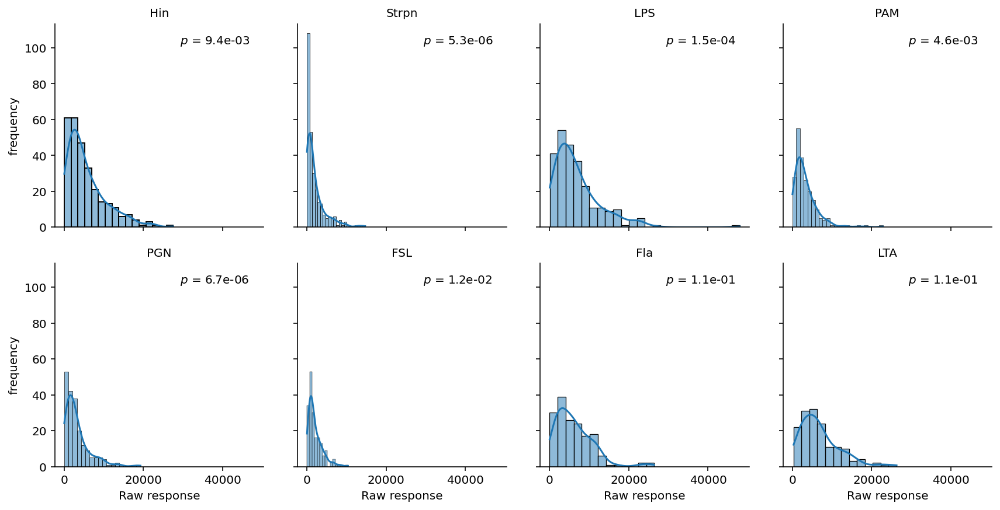

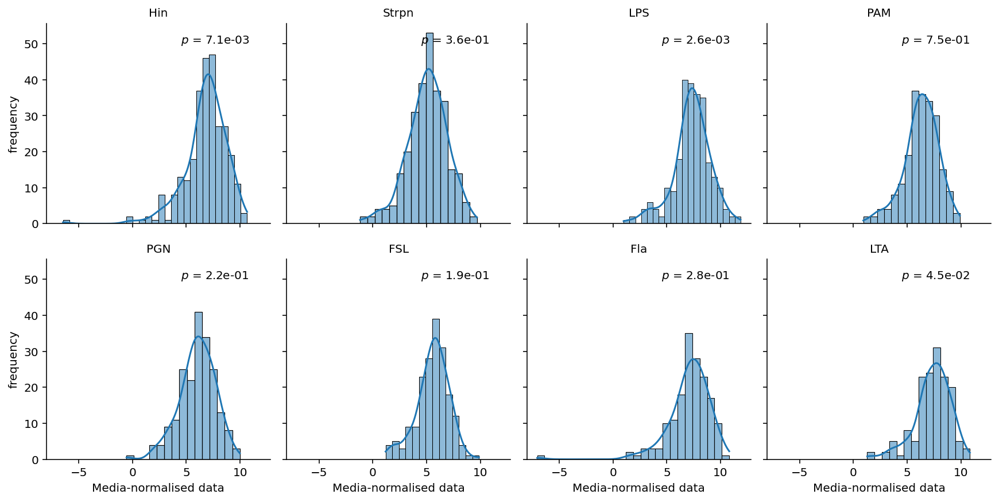

In [308]:
def annotate(data, **kwargs):
    s = data.Stimulus.values[0]

    p = kwargs['normTest'][s]
    ax = plt.gca()
    ax.get_xaxis().get_major_formatter().set_scientific(True)
    ax.text(.6, .9, r"$p$ = {0:0.1e}".format(p), transform=ax.transAxes)
    


g = sns.FacetGrid(data=IL6b_raw, col_wrap=4, col ='Stimulus' )
g.map_dataframe(sns.histplot,kde=True)
g.map_dataframe(annotate,normTest=normTestRaw)
g.set_titles(col_template="{col_name}")

g.set_ylabels("frequency")
g.set_xlabels("Raw response")

savefig(OutputDir+'IL6_distr_raw.pdf',bbox_inches='tight')

g = sns.FacetGrid(data=IL6b_nrm, col_wrap=4, col ='Stimulus' )
g.map_dataframe(sns.histplot,kde=True)
g.map_dataframe(annotate,normTest=normTestNrm)
g.set_titles(col_template="{col_name}")

g.set_ylabels("frequency")
g.set_xlabels("Media-normalised data")

savefig(OutputDir+'IL6_distr_nrm.pdf',bbox_inches='tight')

In [135]:
IL6b

,Stimulus,Expression
11003,Hin,2.806453
11005,Hin,8.758902
11011,Hin,NaN
11024,Hin,5.831493
11028,Hin,6.233811
...,...,...
37048,LTA,6.270308
37051,LTA,NaN
37053,LTA,7.101307
37060,LTA,NaN


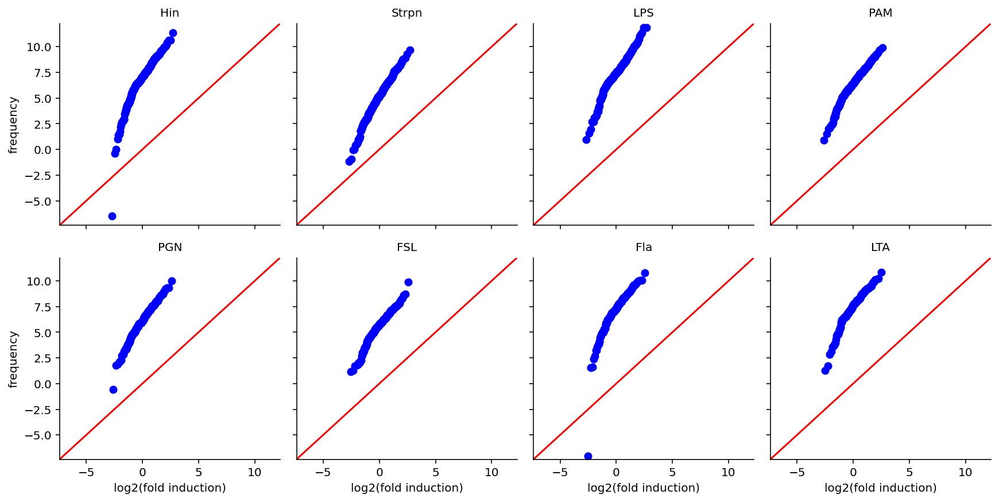

In [139]:
def annotate(data, **kwargs):
    s = data.Stimulus.values[0]

    p = normTest[s]
    ax = plt.gca()
    ax.get_xaxis().get_major_formatter().set_scientific(True)
    ax.text(.6, .9, r"$p$ = {0:0.1e}".format(p), transform=ax.transAxes)
    
def myplot(data, **kwargs):
    v = data.Expression.dropna().values
    ax = plt.gca()
    sm.qqplot(v,line='45',ax=ax)



g = sns.FacetGrid(data=IL6b, col_wrap=4, col ='Stimulus' )
g.map_dataframe(myplot)
# g.map_dataframe(annotate)
g.set_titles(col_template="{col_name}")

g.set_ylabels("frequency")
g.set_xlabels("log2(fold induction)")
# savefig(OutputDir+'IL6_distr_raw.pdf',bbox_inches='tight')

In [12]:
### Media normalised data
datapanel = datapanel_raw_nrm.copy()
df = datapanel.swapaxes(0,1).to_frame(filter_observations=False).T
# strong_pairs = (meanFold[meanFold>=3]).unstack().dropna().swaplevel(0,1).index.values
# df_totest = df.loc[strong_pairs].T


AttributeError: 'DataFrame' object has no attribute 'to_frame'

In [11]:
df.head()

cytokine IFN-alpha2                                                    \
stimulus        RSV      RV1B      RV16    polyIC      R848      CpGA   
number                                                                  
11003      7.494080  2.449607  6.032136  2.277075  7.659796  6.917111   
11005      5.813034  4.110596  5.341024  0.001200  4.142624  4.660614   
11011           NaN       NaN  2.035934       NaN       NaN       NaN   
11024      8.861873  4.055691  6.622632  1.703658  6.055235  8.771967   
11028      4.528860  1.989260  2.083269       NaN       NaN       NaN   

cytokine                                          ... TARC(CCL17)            \
stimulus     Strpn       LTA       Hin       LPS  ...        CpGA     Strpn   
number                                            ...                         
11003     1.404372       NaN  2.079398  1.313996  ...    0.086210  0.312083   
11005     0.233042  1.171063 -0.104168  0.189789  ...    0.021985  0.150039   
11011          NaN       NaN       NaN       NaN  ...         NaN       NaN   
11024     0.835831  0.926205  1.490439  0.926205  ...   -0.227371  0.055066   
11028    -0.105301       NaN  0.395876       NaN  ...         NaN  0.965232   

cytokine                                                              \
stimulus       LTA       Hin       LPS       PHA       PAM       PGN   
number                                                                 
11003          NaN  0.069083  0.312083  1.211645       NaN       NaN   
11005     0.189101  0.308641  0.226595  1.337105  0.394355  0.424574   
11011          NaN       NaN       NaN       NaN       NaN       NaN   
11024     0.092944  0.028955 -0.128908  0.966431  0.475890 -0.299112   
11028          NaN  0.787663       NaN  0.365212       NaN       NaN   

cytokine                      
stimulus       FSL       Fla  
number                        
11003          NaN       NaN  
11005     2.109163  0.051995  
11011          NaN       NaN  
11024     0.424680 -0.227371  
11028          NaN       NaN  

[5 rows x 420 columns]

### Compute the robust mean fold change for each cytokine stimulus pairs

In [12]:
from scipy.stats import iqr
def robustMeanFold(col,kind ='arith'):  # col is log Fold change: log(m/n) return mean m/n
    x = col.copy()    
    w = 1.5
    iqrng = iqr(x, rng=(25, 75), scale='raw', nan_policy='omit') 
    q75 = np.nanpercentile(x,75)  
    q25 = np.nanpercentile(x,25)
    lb = q25 - w*iqrng
    ub = q75 + w*iqrng
    x[x<lb] = np.nan
    x[x>ub] = np.nan
    if kind =='geom':
        return np.power(2,np.nanmean(x))     # geometric mean fold change
    else:
        return np.nanmean(np.power(2,x))   # arithmatic mean fold change
    

#### Variance, Mean, Std for each cytokine-stimulus pair

In [13]:

df_var = df.apply(np.nanvar)
df_mean = df.apply(np.nanmean)
df_std = df.apply(np.nanstd)


#### Robust mean

In [14]:
datapanel = datapanel_raw_nrm.copy()
df = datapanel.swapaxes(0,1).to_frame(filter_observations=False).T
RobMeanFold = df.apply(robustMeanFold,kind='arith')
RobMeanFold.name = 'RobustMeanFoldChange'

In [15]:

df_RobMeanFold = df.apply(robustMeanFold,kind='arith').unstack(1).applymap(np.round).astype(int)
df_RobMeanFold.to_csv(OutputDir+'arithMeanFold.csv')

In [16]:
# df_RobMeanFold = df.apply(robustMeanFold,kind='geom').unstack(1).applymap(np.round).astype(int)
# df_RobMeanFold.to_csv(OutputDir+'geomMeanFold.csv')

### Tests for equal variances/means between stimulus responses and media responses

In [17]:
from scipy.stats import levene
from scipy.stats import bartlett
from scipy.stats import ttest_rel
from scipy.stats import fligner

### media as it is
datapanel = datapanel_raw_log.copy()


levene_pv = OrderedDict()
bartlett_pv = OrderedDict()
ttest_pv = OrderedDict()
fligner_pv = OrderedDict()


for cy, df_cyto in datapanel.iteritems():
    stlist = list(df_cyto.columns.values)
    stlist.remove('media')
    for st in stlist:
        media_stim = df_cyto.loc[:,['media',st]].dropna(how='any',axis=0)
        media = media_stim.loc[:,'media']
        stim = media_stim.loc[:,st]
        t,p = ttest_rel(media,stim, axis=0)
        ttest_pv[(cy,st)] = p
        t,p = levene(media,stim)
        levene_pv[(cy,st)] = p
        t,p = bartlett(media,stim)
        bartlett_pv[(cy,st)] = p
        t,p = fligner(media,stim)
        fligner_pv[(cy,st)] = p

ttest_pv = pd.Series(ttest_pv)
ttest_pv.name = 'Ttest Pvalue'

bartlett_pv = pd.Series(bartlett_pv)
bartlett_pv.name = 'Bartlett Pvalue'

levene_pv = pd.Series(levene_pv)
levene_pv.name = 'Levene Pvalue'

fligner_pv = pd.Series(fligner_pv)
fligner_pv.name = 'Fligner Pvalue'

Cyto_Stim_smry = pd.concat([RobMeanFold,ttest_pv,levene_pv,fligner_pv],axis=1)

In [18]:
Cyto_Stim_smry.head()

RobustMeanFoldChange   Ttest Pvalue  Levene Pvalue  \
cytokine   stimulus                                                       
IFN-alpha2 RSV                 345.338367  1.421547e-185   1.071952e-05   
           RV1B                 21.021407   3.697796e-64   6.665081e-20   
           RV16                145.434505  4.010279e-131   1.089381e-13   
           polyIC                1.987912   5.936087e-12   7.405519e-01   
           R848                 54.427515  2.515220e-102   6.221881e-10   

                     Fligner Pvalue  
cytokine   stimulus                  
IFN-alpha2 RSV         1.565748e-05  
           RV1B        6.450721e-20  
           RV16        6.955283e-15  
           polyIC      8.873073e-01  
           R848        7.510066e-10

In [19]:
Cyto_Stim_smry.to_excel(OutputDir + 'Cytokine_Stimulus_Mean_Var_tests.xlsx')

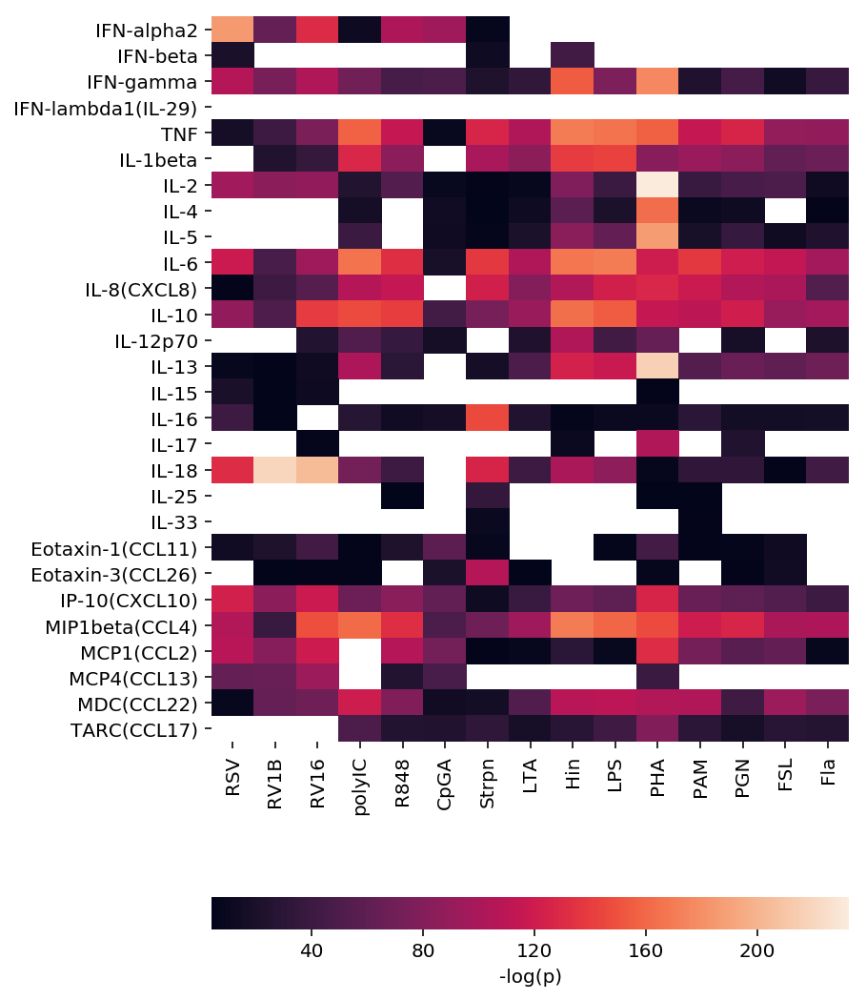

In [20]:
fig,ax = plt.subplots(1,1,figsize=(6,10))
temp = ttest_pv.unstack(1).loc[cytolabel,stimlabel[1:]]
temp[temp==0] = np.nanmin(temp[temp!=0] )
temp[temp>=0.05/420] = np.nan
temp = -np.log10(temp)

sns.heatmap(temp,ax=ax,cbar_kws = {'orientation':'horizontal','label':'-log(p)'})
savefig(OutputDir+'cyto_stim_ttest.pdf',bbox_inches='tight')

### Mean missing rate for each stimulus

In [21]:
# constructing a dataframe summarising missing situation
des_rate = ms_rate.describe()
des_rate.drop(labels=['count'],axis=0,inplace=True)
des_rate.loc[:,'Summary'] = ['Mean','STD','Min', '25% Quartile','50% Quartile', '75% Quartile','Max']
des_rate.reset_index(drop=True,inplace=True)
des_rate.set_index('Summary',inplace=True)
des_rate.T.mean()

des_rate = des_rate.round(2).astype(str)
des_rate += '%'

des_rate

des_rate.to_csv(OutputDir + 'missingRate.csv')

### median of overall missing rate

### median by stimulus
tt = pd.DataFrame((ms_rate.median()).sort_values(), columns=['median of missing rate'])
tt = tt.round(2).astype('str') 
tt += '%'
print('data missing rate')
print(tt.T)

data missing rate
                       media  RV16    RSV    Hin  Strpn    PHA   RV1B polyIC  \
median of missing rate  0.0%  0.0%  0.65%  1.63%  2.28%  4.56%  5.21%  9.12%   

                           LPS    R848     PAM    CpGA    PGN     FSL    Fla  \
median of missing rate  13.03%  17.59%  27.69%  32.57%  32.9%  37.13%  44.3%   

                           LTA  
median of missing rate  48.86%  


### Find the id for children with complete data, i.e., no missing measurements

In [22]:

df_raw = datapanel_raw.to_frame(filter_observations=False) # add the option to avoid dropping nans

df_sample = df_raw.unstack(fill_value=False)
# total number of children having no missing data
comp_index = np.isnan(df_sample).sum(axis = 1) == 0
print('Counts of children with complete data: %d' % sum(comp_index))

id_comp = comp_index[comp_index==True].index.values



Counts of children with complete data: 130


### Raw data in boxplots
---
We check opulation characteristics and response distributions here. Firstly, we plot cytokine by cytokine. As we are plotting raw data which has wide range across different stimuli, we may need to pick up responses of the stimuli that have much higher responses and plot those with second y-axis. This list is recorded in ``list_sec`` in the following codes. We now show an example for ``IFN-alpha2``.

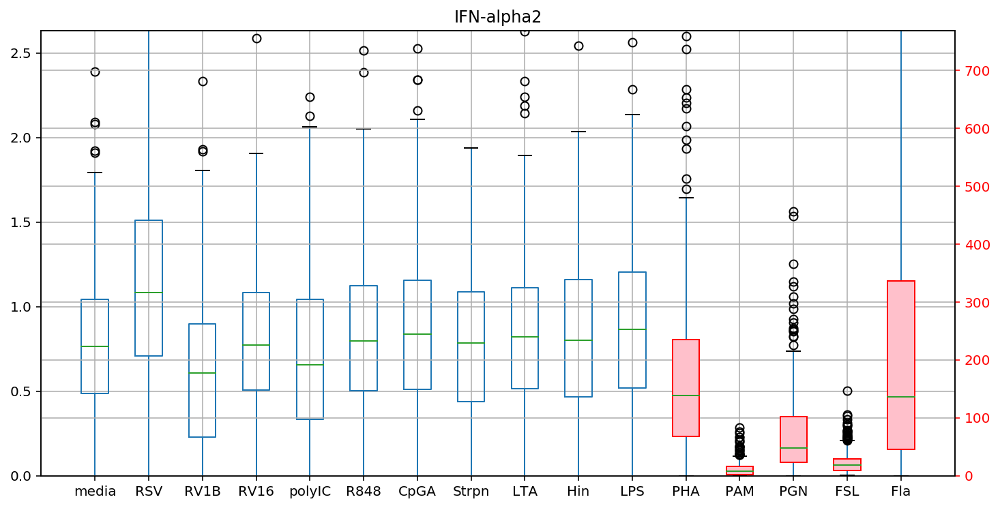

In [23]:


datapanel = datapanel_raw.copy()

cyto = 'IFN-alpha2'
df = datapanel.loc[cyto,:,:]



list_sec = ['RSV','RV1B','RV16','R848','CpGA']
df1 = df.copy()
df1.drop(list_sec,axis=1,inplace=True)

fig, ax = plt.subplots(1,1,figsize=(12,6))
boxes = df1.boxplot( ax=ax,return_type='dict')

ymax1 = max([item.get_ydata().max() for item in  boxes['whiskers']])




boxcol = 'red'
facol = 'pink'
ax2 = ax.twinx()
df2 = df[list_sec].copy()
boxes = df2.boxplot(ax=ax2,positions = range(df1.shape[1]+1,df.shape[1]+1),
                  patch_artist=True,return_type='dict')  # default pos start from 1
ymax2 = max([item.get_ydata().max() for item in  boxes['whiskers']])


for patch in boxes['boxes']:
    patch.set_facecolor(facol)
    patch.set_edgecolor(boxcol)
    
# ax2.spines['right'].set_color('red')
# ax.spines['top'].set_color('red')
ax2.xaxis.label.set_color(boxcol)
ax2.tick_params(axis='y', colors=boxcol)
ylim_2 = ax2.get_ylim()


_= ax.set_xlim([0,df.shape[1]+1])
_= ax.set_ylim([0, ymax1])

_= ax2.set_ylim([0, ymax2])



_= ax.set_xticks(range(1,df.shape[1]+1))
_= ax.set_xticklabels(df.columns.values)
_= ax.set_title(cyto)
savefig(OutputDir + cyto.replace('/','') + '_BoxPlot.pdf',)  # replace to avoid / appearing in file name


# Hierarchical Clustering including polyIC
---
We first check imputed data so we have 307 samples.

## Figure S3


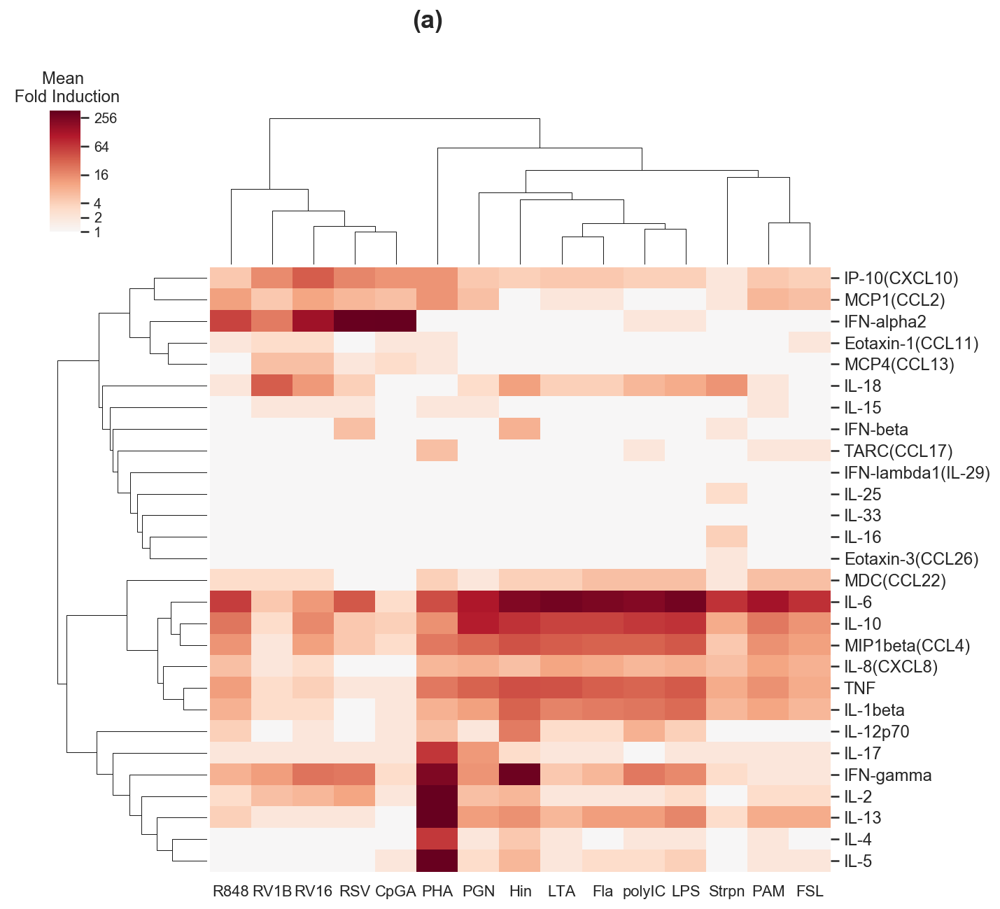

In [24]:
from lib.plot_clustermap_panel import plot_clustermap
mean_xlabel = np.log2(meanFold).copy()
cbar_ticks = [0,1,2,4,6,8]
cbar_ticklabels = np.power(2,cbar_ticks)


# mean_xlabel.columns.name = '(a)'  # add x label to indicate the figure number in the paper
plot_clustermap(datapanel_nrm,dist='c_correlation',
                mean = mean_xlabel,
                fname = OutputDir + 'FigureS3_withPolyIC307_Jun18.pdf',
                cbar_title = 'Mean \n Fold Induction',vmax = 8.5,vmin=0,gp=False,addlabel='(a)',
                cbar_ticks = cbar_ticks,cbar_ticklabels = cbar_ticklabels
               )


We then check samples with complete data.

## Figure S4

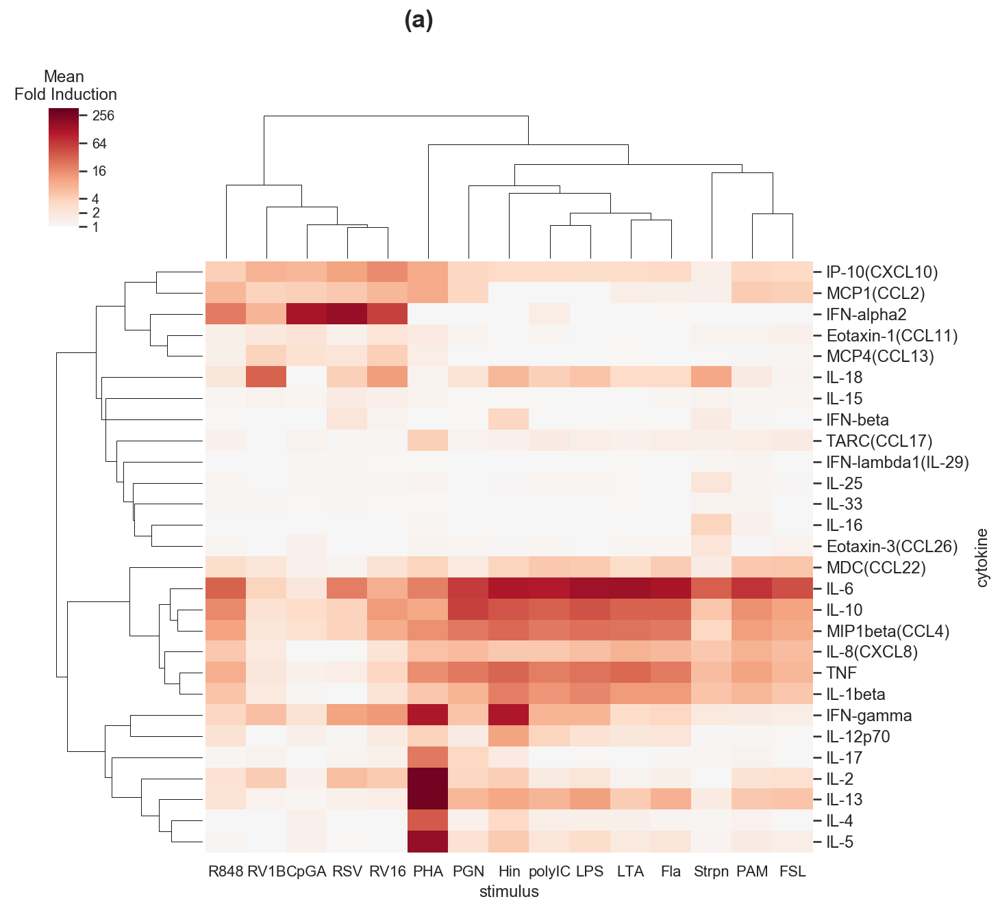

In [25]:
from lib.plot_clustermap_panel import plot_clustermap

datapanel = datapanel_nrm.copy()
datapanel_comp = datapanel.loc[:,id_comp,:]
meanComp = datapanel.mean(axis=1).T
meanComp[meanComp<0] = 0
# meanComp = np.log2(meanFold).copy()
cbar_ticks = [0,1,2,4,6,8]
cbar_ticklabels = np.power(2,cbar_ticks)

plot_clustermap(datapanel_comp,dist='c_correlation',
                mean = meanComp,
                fname= OutputDir + 'FigureS4_withPolyIC130_Jun18.pdf',
                cbar_title = 'Mean\n Fold Induction',vmax = 8.5,vmin=0,gp=False,addlabel='(a)',
                cbar_ticks = cbar_ticks,cbar_ticklabels = cbar_ticklabels
               )

# Remove polyIC from all datasets



In [26]:
for tmp_panel in [datapanel_raw, datapanel_raw_log,datapanel_raw_nrm,datapanel_nrm,datapanel_log]:
    tmp_panel.drop('polyIC',axis=2,inplace=True)
stimlabel.remove('polyIC')
meanFold.drop(labels = 'polyIC',axis=1,inplace=True)

In [27]:
media = datapanel_log.loc[:,:,'media']

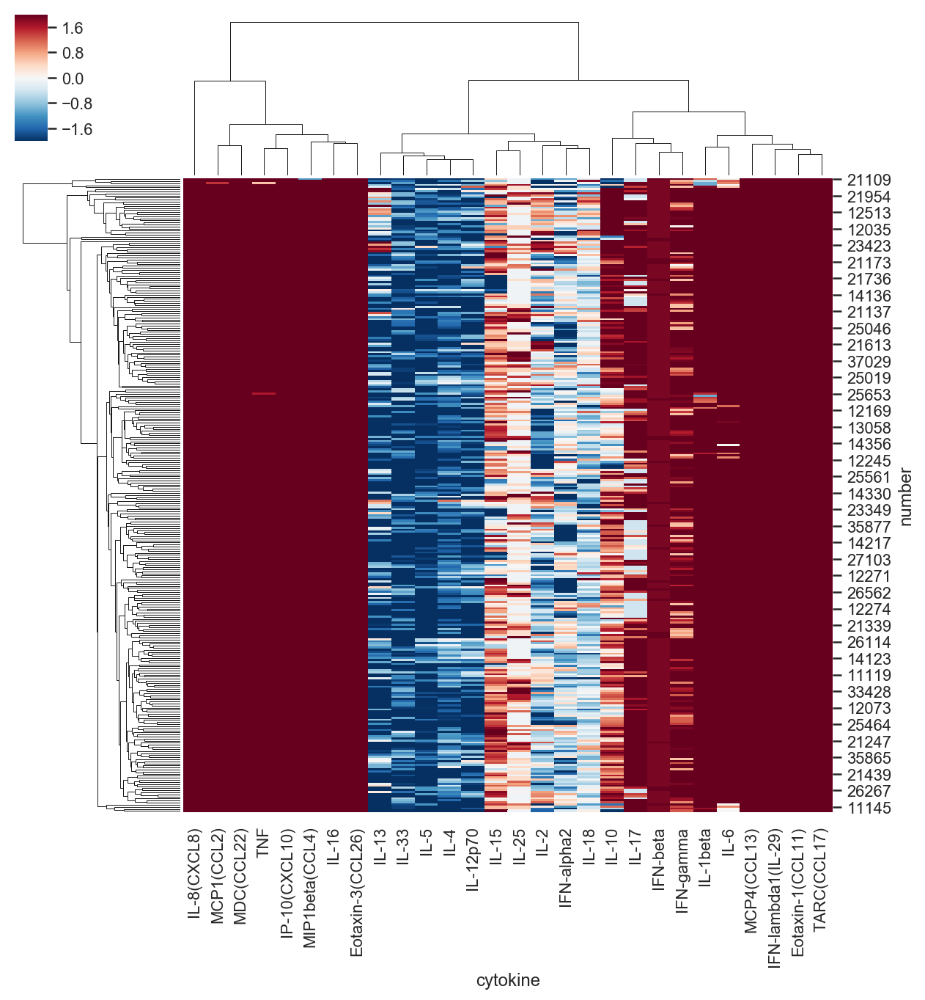

In [28]:
sns.clustermap(media,vmax=2,vmin=-2,cmap= plt.get_cmap('RdBu_r'))

In [29]:
IL2 = datapanel_nrm.loc['IL-2',:,:]

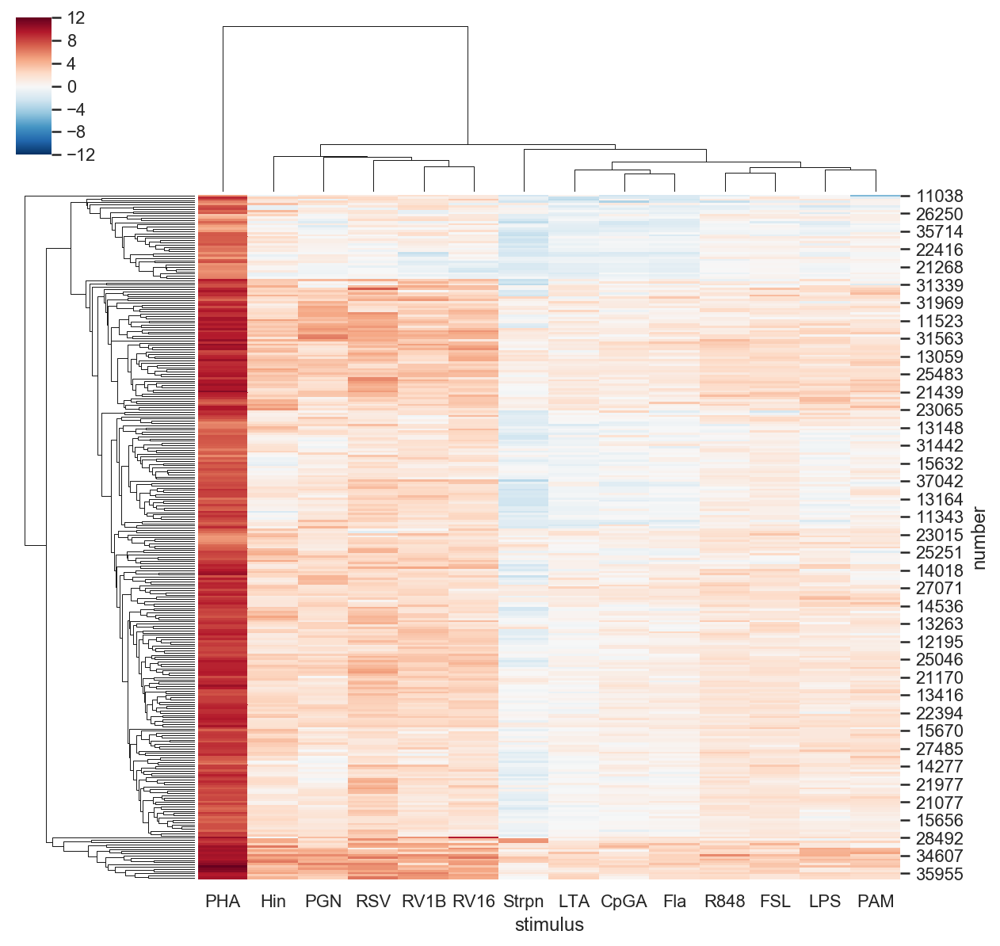

In [30]:
sns.clustermap(IL2,vmax=12,vmin=-12,cmap= plt.get_cmap('RdBu_r'))

In [31]:
# export dat for further analysis
datapanel = datapanel_nrm.copy()
df = datapanel.swapaxes(0,1).to_frame(filter_observations=False).T
df.columns = df.columns.map('{0[0]}_{0[1]}'.format)
df.to_csv('data/cyto_stim_pairs_year11_nrm_imputed.csv') 

## Figure 2

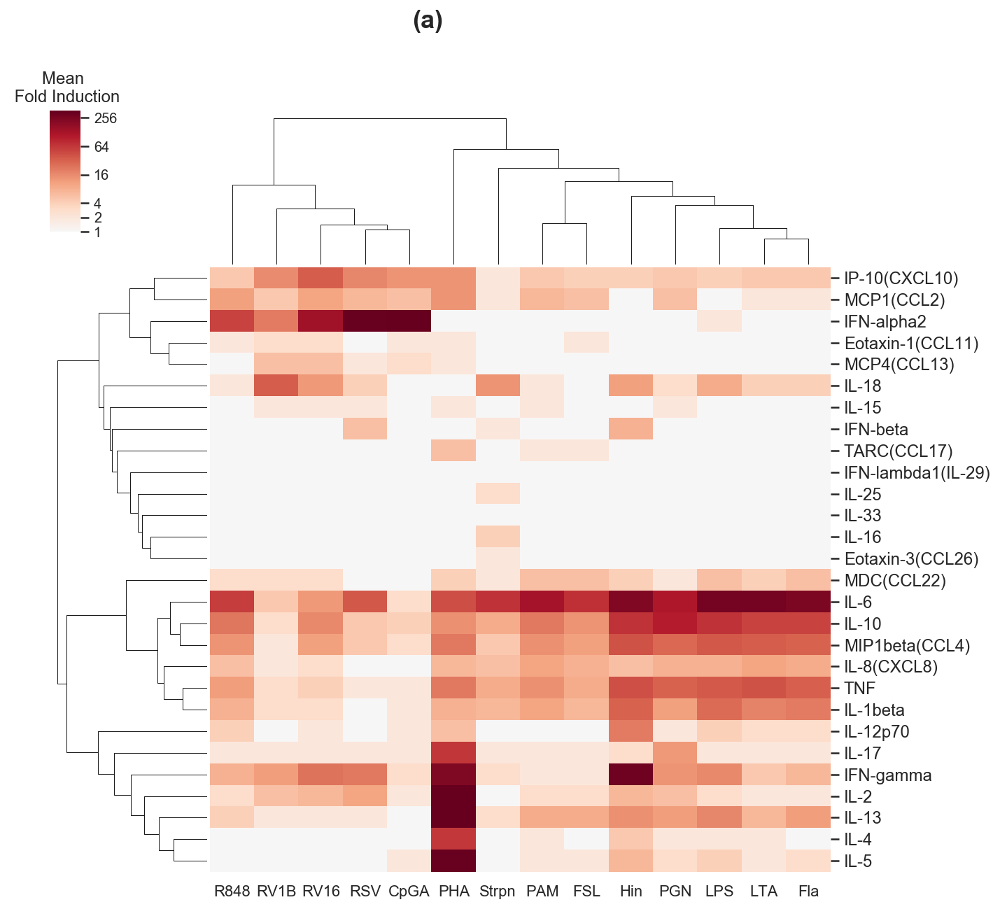

In [32]:
mean_xlabel = np.log2(meanFold).copy()
cbar_ticks = [0,1,2,4,6,8]
cbar_ticklabels = np.power(2,cbar_ticks)


# mean_xlabel.columns.name = '(a)'  # add x label to indicate the figure number in the paper
plot_clustermap(datapanel_nrm,dist='c_correlation',
                mean = mean_xlabel,
                fname = OutputDir + 'Figure2_withoutPolyIC307_Jun18.pdf',
                cbar_title = 'Mean \n Fold Induction',vmax = 8.5,gp=False,addlabel='(a)',
                cbar_ticks = cbar_ticks,cbar_ticklabels = cbar_ticklabels
               )


## HC with media as independent variable
## Figure S5

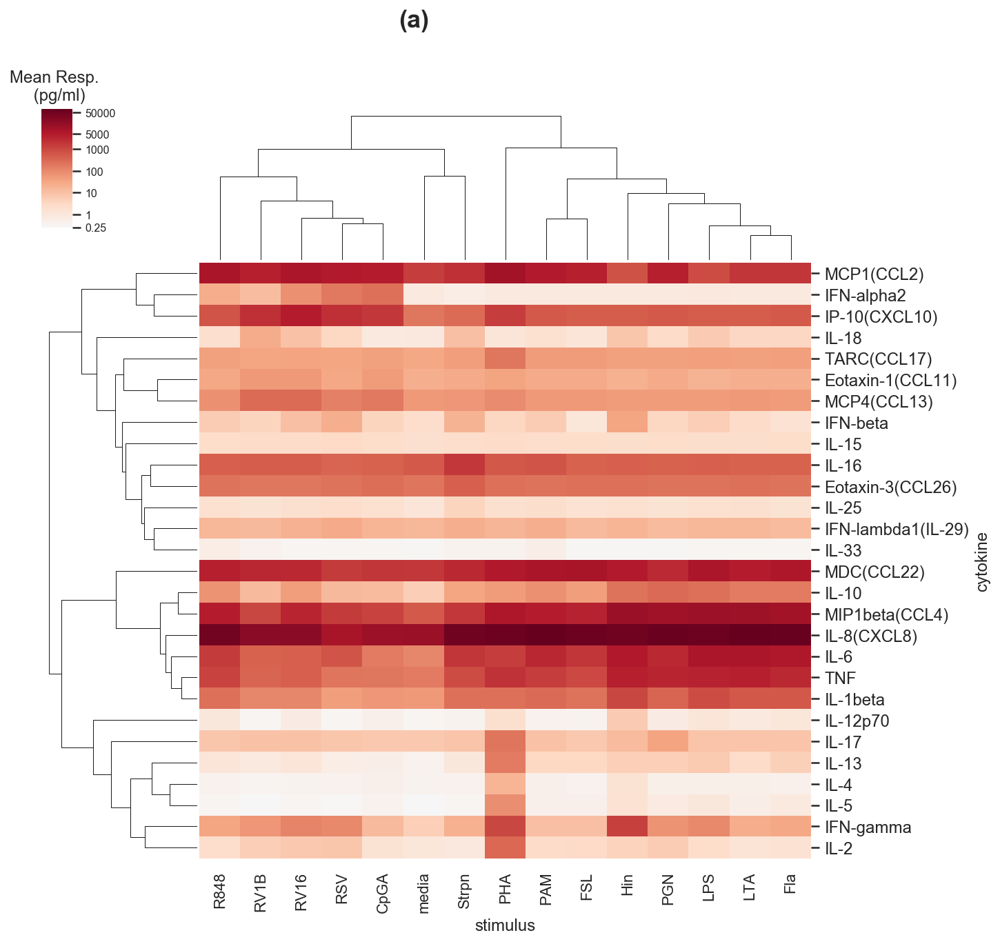

In [33]:
datapanel = datapanel_log.copy()
meanRawMedia = np.log2(datapanel_raw.mean(axis=1).T)
vmax = meanRawMedia.max().max()
vmin = meanRawMedia.min().min()

## define ticks from labels
cbar_ticklabels = [0.25, 1, 10, 100, 1000, 5000,50000]
cbar_ticks = np.log2(cbar_ticklabels)


plot_clustermap(datapanel,dist='c_correlation',
                mean = meanRawMedia,
                fname= OutputDir + 'FigureS5_media307_Jun18.pdf',
                cbar_title = 'Mean Resp. \n (pg/ml)',
                vmax = vmax,cmap = None,
                vmin=vmin,gp=False,addlabel='(a)',
                cbar_ticks = cbar_ticks, 
                cbar_ticklabels = cbar_ticklabels, cbar_labelsize=8
               )

## Figure S6
---
Same as Figure S4 but with polyIC excluded


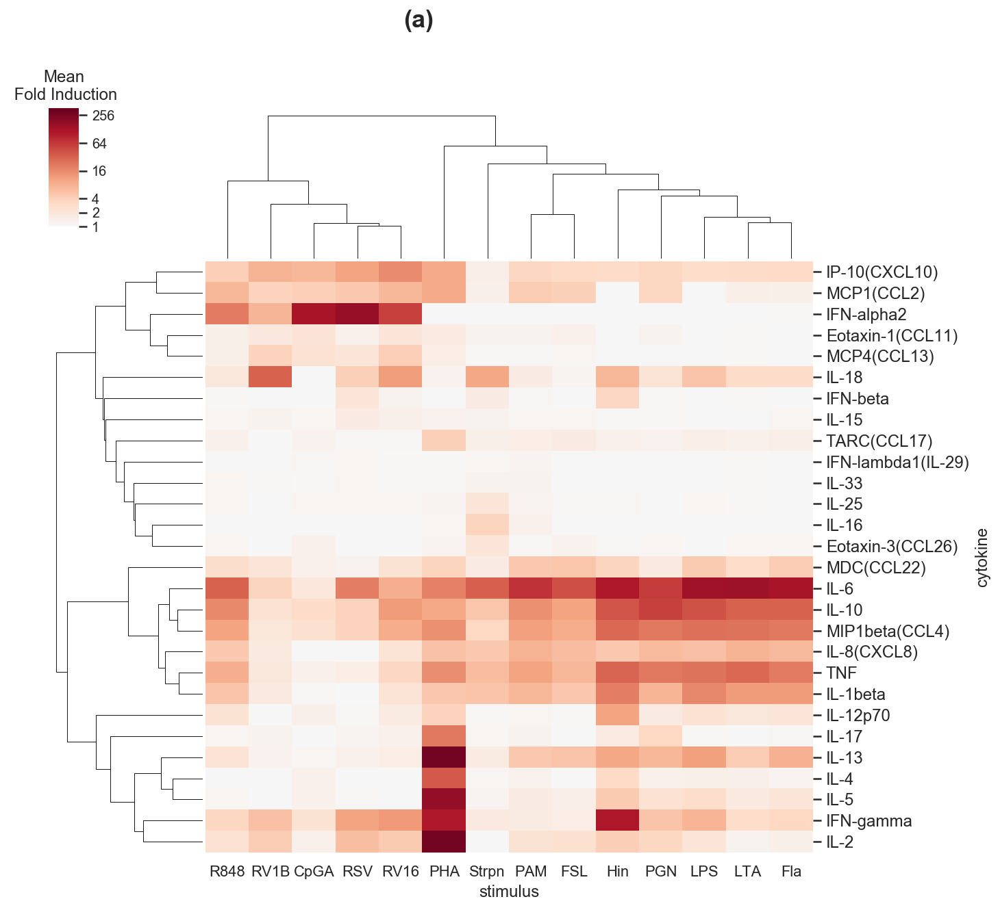

In [34]:
from lib.plot_clustermap_panel import plot_clustermap

datapanel = datapanel_nrm.copy()
datapanel_comp = datapanel.loc[:,id_comp,:]
meanComp = datapanel.mean(axis=1).T
meanComp[meanComp<0] = 0

cbar_ticks = [0,1,2,4,6,8]
cbar_ticklabels = np.power(2,cbar_ticks)

plot_clustermap(datapanel_comp,dist='c_correlation',
                mean = meanComp,
                fname= OutputDir + 'FigureS6_noPolyIC130_Jun18.pdf',
                cbar_title = 'Mean\n Fold Induction',vmax = 8.5,vmin=0,gp=False,addlabel='(a)',
                cbar_ticks = cbar_ticks,cbar_ticklabels = cbar_ticklabels
               )

### Notations: Define dictionary for cytokine and stimulus profile
#### Note polyIC has been removed accordingly

In [35]:
# A finer category
## cytokine type name
gpedCyto_f = {'Anti-Viral','Th1','Th2','ProTh2','Th2-chemokines','Pro-inflammatory','Th17',
              'Inflammatory-chemokines','Alarmin','T-Cell','IL-16','Regulatory'}
## cytokines in each category
CytoDict_f = {'Anti-Viral':['IFN-alpha2', 'IFN-beta', 
                        'IFN-lambda1(IL-29)', 'IP-10(CXCL10)', 'IL-15'],
           'Th1': ['IFN-gamma', 'IL-12p70', 'IL-15'  ,  'IL-18'  ,  'IP-10(CXCL10)'],
           'Th2': ['IL-4', 'IL-5', 'IL-13'],
           'ProTh2':['IL-25', 'IL-33'],
           'Th2-chemokines':['Eotaxin-1(CCL11)', 'Eotaxin-3(CCL26)', 'MDC(CCL22)', 'TARC(CCL17)'],
           'Pro-inflammatory':['TNF', 'IL-1beta', 'IL-6', 'IL-8(CXCL8)'], 
           'Th17':['IL-17'],
           'Inflammatory-chemokines':['MIP1beta(CCL4)', 'MCP1(CCL2)', 'MCP4(CCL13)'],
            'Alarmin': ['IL-33'],
           'T-Cell':['IL-2',  'IL-17'],
           'IL-16':['IL-16'],
           'Regulatory':['IL-10', 'IL-18']}

# A category to be used in the paper:
gpedCyto = {'Anti-Viral','Th1','Th2/proTh2', 
            'Pro-inflammatory','T-Cell','IL-16','Regulatory'}
## as noted in email communication (21 April 2015, Subject:Meeting 20 April 2015), we did the following changes to 
## the original grouping (from Seb's email, 10 Feb 2015) we had: 
## 1. IL-33 removed from Pro-Inflammatory 
## 2. IL-16 removed from T-Cell and put it on its own.

CytoDict = {'Anti-Viral':['IFN-alpha2', 'IFN-beta', 
                        'IFN-lambda1(IL-29)', 'IL-15', 'IP-10(CXCL10)'],
           'Th1': ['IFN-gamma', 'IL-12p70', 'IL-15'  ,  'IL-18'  ,  'IP-10(CXCL10)'],
           'Th2/proTh2': ['IL-4', 'IL-5', 'IL-13', 'IL-25', 'IL-33', 'Eotaxin-1(CCL11)', 
                          'Eotaxin-3(CCL26)', 'MDC(CCL22)', 'TARC(CCL17)'],
           'Pro-inflammatory':['TNF', 'IL-1beta', 'IL-6', 'IL-8(CXCL8)', 
                               'IL-17', 'MIP1beta(CCL4)', 'MCP1(CCL2)', 'MCP4(CCL13)'],
           'T-Cell':['IL-2',  'IL-17'],
            'IL-16':['IL-16'],
           'Regulatory':['IL-10', 'IL-18']}

gpedStim = {'T-cells','Live-virus','Ligand-virus','Viral',
            'Bacterial'}

StimDict = {'T-cells': ['PHA'],
            'Live-virus': ['RSV','RV1B','RV16'],
            'Ligand-virus':['R848','CpGA'],
            'Viral':['RSV','RV1B','RV16','R848','CpGA'],
#             'Ligand-virus':['polyIC','R848','CpGA'],
#             'Viral':['RSV','RV1B','RV16','polyIC','R848','CpGA'],
            'Bacterial':['Strpn','LTA','Hin','LPS','PAM','PGN','FSL','Fla'],            
             'All': ['PHA','RSV','RV1B','RV16','R848','CpGA','Strpn','LTA','Hin','LPS','PAM','PGN','FSL','Fla']}


from collections import OrderedDict

inv_CytoDict = OrderedDict()
for v in cytolabel:
    inv_CytoDict.setdefault(v,[]) # value to be a list
for k, v_list in CytoDict.items():
    for v in v_list:
        inv_CytoDict[v].append(k)

inv_CytoDict_f = OrderedDict()
for v in cytolabel:
    inv_CytoDict_f.setdefault(v,[])
for k, v_list in CytoDict_f.items():
    for v in v_list:
        inv_CytoDict_f[v].append(k)
        
inv_StimDict = OrderedDict()
for v in stimlabel:
    inv_StimDict.setdefault(v,[])
for k, v_list in StimDict.items():
    for v in v_list:
        inv_StimDict[v].append(k)



# PCA


---
Stack all cytokines to form a (Child, Cytokine) X Stimulus matrix (dataframe), i.e., using stimuli as features; then stack all stimuli to form a (Child, Stimulus) X Cytokine matrix, i.e., using cytokines as features. 

In [36]:
# normalised by media
datapanel = datapanel_nrm.copy()
df_nrm_cyto = datapanel.swapaxes(1,2).to_frame(filter_observations=False) # cytokine as features
df_nrm_stim = datapanel.swapaxes(0,2).to_frame(filter_observations=False) # cytokine as features
df_nrm_stim = df_nrm_stim.swaplevel(0,1,axis=0)
# with media:
datapanel = datapanel_log.copy()
df_log_cyto = datapanel.swapaxes(1,2).to_frame(filter_observations=False) # cytokine as features
df_log_stim = datapanel.swapaxes(0,2).to_frame(filter_observations=False) # cytokine as features
df_log_stim = df_log_stim.swaplevel(0,1,axis=0)

In [37]:
df_nrm_stim.head(2)

,stimulus,RSV,RV1B,RV16,R848,CpGA,Strpn,LTA,Hin,LPS,PHA,PAM,PGN,FSL,Fla
cytokine,number,,,,,,,,,,,,,,
IFN-alpha2,11003,7.494080,2.449607,6.032136,7.659796,6.917111,1.404372,1.532161,2.079398,1.313996,2.131579,1.576390,1.226229,1.221613,2.371243
IFN-beta,11003,4.004092,0.000000,0.000000,0.000000,0.000000,3.026165,0.369140,4.070413,0.000000,0.000000,0.310782,0.402295,0.362517,0.165274


In [38]:
df_log_cyto.head(2)

cytokine         IFN-alpha2  IFN-beta  IFN-gamma  IFN-lambda1(IL-29)  \
stimulus number                                                        
media    11003    -1.892757  1.895303   2.227803            4.180422   
         11005     0.467238  1.895303   1.634932            4.436533   

cytokine              TNF  IL-1beta      IL-2      IL-4      IL-5      IL-6  \
stimulus number                                                               
media    11003   7.183983  5.776009 -1.696920 -1.112993 -1.780552  7.801534   
         11005   7.034920  5.836767  0.713977 -1.184762 -2.209341  3.134904   

cytokine         ...     IL-25     IL-33  Eotaxin-1(CCL11)  Eotaxin-3(CCL26)  \
stimulus number  ...                                                           
media    11003   ... -0.089267 -2.056488          4.464890          7.868551   
         11005   ... -0.089267 -2.599462          4.574864          8.399769   

cytokine         IP-10(CXCL10)  MIP1beta(CCL4)  MCP1(CCL2)  MCP4(CCL13)  \
stimulus number                                                           
media    11003        7.149087        9.196174    9.226935     5.823273   
         11005        6.692330        7.748622    9.865192     5.940110   

cytokine         MDC(CCL22)  TARC(CCL17)  
stimulus number                           
media    11003    10.041960     4.997803  
         11005     9.741743     5.333084  

[2 rows x 28 columns]

In [39]:
df_log_stim.head(2)

,stimulus,media,RSV,RV1B,RV16,R848,CpGA,Strpn,LTA,Hin,LPS,PHA,PAM,PGN,FSL,Fla
cytokine,number,,,,,,,,,,,,,,,
IFN-alpha2,11003,-1.892757,5.601323,0.556850,4.139379,5.767039,5.024354,-0.488385,-0.330771,0.186641,-0.578761,0.238822,-0.243941,-0.663428,-0.747110,0.794860
IFN-beta,11003,1.895303,5.899394,1.895303,1.895303,1.895303,1.895303,4.921468,1.942111,5.965716,1.895303,1.895303,2.024745,2.129291,2.056568,2.003005


# Table S5: PCA loadings table, stimuli as features

In [40]:
from lib.print_pca_table import print_pca_table

centered = True
W = dict()
for HAVE_MEDIA in [True, False]:
    if HAVE_MEDIA:
        data = df_log_stim.copy()
        ind = 'Media'
    else:
        data = df_nrm_stim.copy()
        ind = 'noMedia'

    df = data.copy()
    ft,wt = print_pca_table(df,centered = centered)

    W[ind]=pd.DataFrame(wt,index=['PC' + str(i) for i in np.arange(1,wt.shape[0]+1)],
                        columns = df.columns.values)
    W[ind] = W[ind].join(pd.Series(ft,name='Variance',index=['PC'+str(i) for i in range(1,len(ft)+1)]))
    W[ind] = W[ind].join(pd.Series(list(np.cumsum(ft)),name='Cum. Var.',index=['PC'+str(i) for i in range(1,len(ft)+1)])) 
    


# export the first five PC loadings as Table S5; cumulate var. of 5 PCs over 90%
N = 5
W_nrm = W['noMedia'].copy()

W_nrm.loc[:,['Variance','Cum. Var.']] = W_nrm.loc[:,['Variance','Cum. Var.']].round(3)*100  

W_nrm = W_nrm.applymap(lambda x: "{0:.2f}".format(x))

W_nrm.loc[:,['Variance','Cum. Var.']] = W_nrm.loc[:,['Variance','Cum. Var.']] +'%'

W_nrm.T.iloc[:,0:N].to_csv(OutputDir + 'TableS5PCAtable_stim.csv')

### PCA loadings for cytokines as features

In [41]:
from lib.print_pca_table import print_pca_table
centered = True
W = dict()
for HAVE_MEDIA in [True, False]:
    if HAVE_MEDIA:
        data = df_log_cyto.copy()
        ind = 'Media'
    else:
        data = df_nrm_cyto.copy()
        ind = 'noMedia'

    df = data.copy()
    ft,wt = print_pca_table(df,centered = centered)

    W[ind]=pd.DataFrame(wt,index=['PC' + str(i) for i in np.arange(1,wt.shape[0]+1)],
                        columns = df.columns.values)
    W[ind] = W[ind].join(pd.Series(ft,name='Variance',index=['PC'+str(i) for i in range(1,len(ft)+1)]))
    W[ind] = W[ind].join(pd.Series(list(np.cumsum(ft)),name='Cum. Var.',index=['PC'+str(i) for i in range(1,len(ft)+1)])) 
    

# export the first five PC loadings as Table S6; cumulate var. of 16 PCs over 90%
N = 16
W_nrm = W['noMedia'].copy()

W_nrm.loc[:,['Variance','Cum. Var.']] = W_nrm.loc[:,['Variance','Cum. Var.']].round(3)*100  

W_nrm = W_nrm.applymap(lambda x: "{0:.2f}".format(x))

W_nrm.loc[:,['Variance','Cum. Var.']] = W_nrm.loc[:,['Variance','Cum. Var.']] +'%'

W_nrm.T.iloc[:,0:N].to_csv(OutputDir + 'TableS6PCAtable_cyto.csv')



# Figure 3a: PCA on media-normalised data using stimuli as features


In [42]:
matplotlib.rcParams['text.usetex'] = True

/anaconda3/lib/python3.6/site-packages/matplotlib/font_manager.py:1241: UserWarning: findfont: Font family ['Gill Sans MT Bold'] not found. Falling back to DejaVu Sans.
  (prop.get_family(), self.defaultFamily[fontext]))


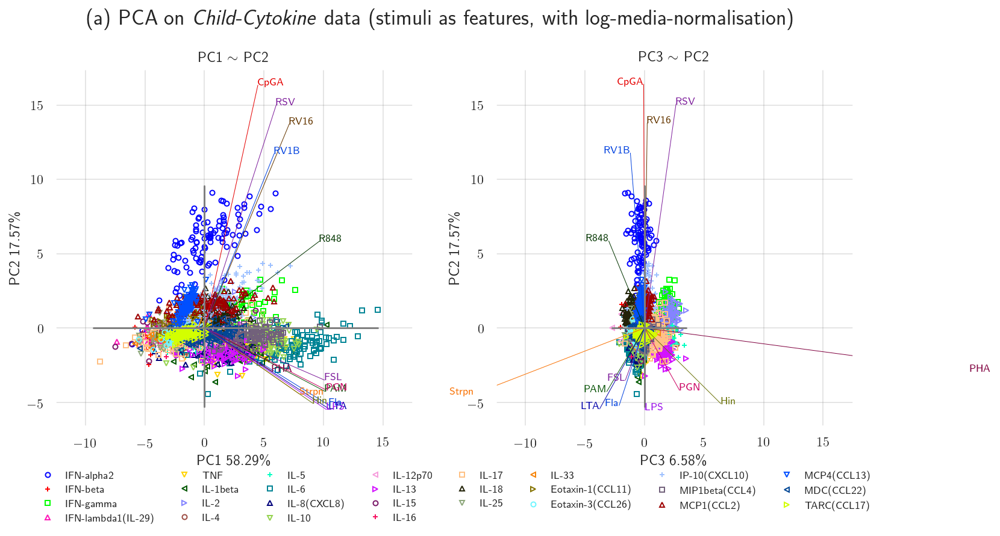

In [43]:

import matplotlib.gridspec as gridspec

prefix = 'Figure3a'
centered = True  # whether center the data or not
from lib.plot_pca_sk import plot_pca_repel



data = df_nrm_stim.copy()
stimlist = data.columns.values

# two options: include or exclude PHA
for HAVE_PHA in  [True]:
    fig = plt.figure(figsize=(12,7))
    gs = gridspec.GridSpec(2, 2,
                       width_ratios=[1,1],
                       height_ratios=[6,1])
    # gs.update(wspace=0.05,hspace=0.01)
    ax1 = fig.add_subplot(gs[0,0])
    ax2 = fig.add_subplot(gs[0,1])
    ax5 = fig.add_subplot(gs[1,:])

    stim_to_plot = stimlist[:]

    if HAVE_PHA == False:
        stim_to_plot.remove('PHA')
        suptitle = "All Cytokines and All Stimuli (excl. PHA, norm. by media, as features)"
        fname =  "stim_AllStimAllCyto_PC123_noPHA_nomedia.pdf"            
    else:
        suptitle = "(a)   PCA on \\textit{Child-Cytokine} data (stimuli as features, with log-media-normalisation)"
        fname = "PCA_AllStimAllCyto_June18.pdf"            
    fname = prefix + fname
    data_to_plot = data.loc[:,stim_to_plot]
    clust_to_plot = data_to_plot.index.get_level_values(0).values
    k_repel = 0.008
    ax1 = plot_pca_repel(data_to_plot, clust_to_plot, markevery=3,
             alpha =1, plot_weight = 1,legendon = False, ax=ax1, PCname=[1,2],extra_w = 1.16,k_repel = k_repel,
             centered = centered)
    ax1.set_title("PC1 $\\mathtt{\\sim}$ PC2")

    ax2 = plot_pca_repel(data_to_plot, clust_to_plot, markevery=3,
             alpha =1, plot_weight = 1,legendon = False, ax=ax2, PCname=[3,2],
             extra_w = 63.6/24.5*1.1,# non-cen weight
            k_repel = k_repel, centered = centered)
    ax2.set_title("PC3 $\\mathtt{\\sim}$ PC2")

    ax1.set_xlim([-12.5,17.5])
#         ax1.set_ylim([y0,y1])


    x0,x1 = ax1.get_xlim()
    y0,y1 = ax1.get_ylim()

    ax2.set_xlim([x0,x1])
    ax2.set_ylim([y0,y1])

    for ax in [ax1,ax2]:
        ax.set_aspect(abs(x1-x0)/abs(y1-y0))

    ax=ax5
    ax.grid(False)
    ax.set_facecolor('white')
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.legend(*ax1.get_legend_handles_labels(), ncol=8, frameon=False,
              loc = "center",labelspacing = 0.5, fontsize ='x-small')
    ax.set_frame_on(False)
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)

    plt.suptitle(suptitle,fontweight='bold',fontname = "Gill Sans MT Bold",fontsize=18)
#         fig.tight_layout()
    savefig(OutputDir + fname, bbox_inches="tight")




## Figure S7a: include media as spearate variable

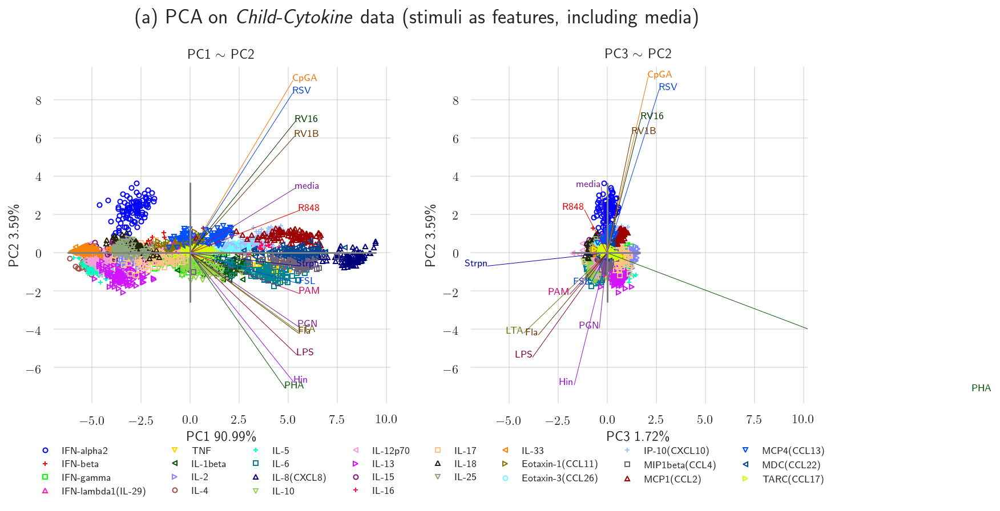

In [44]:
prefix = 'FigureS7a'
centered = True
from lib.plot_pca_sk import plot_pca_repel

data = df_log_stim.copy()

stimlist = data.columns.values
for HAVE_PHA in [ True]:
    fig = plt.figure(figsize=(12,7))
    gs = gridspec.GridSpec(2, 2,
                       width_ratios=[1,1],
                       height_ratios=[6,1])
    # gs.update(wspace=0.05,hspace=0.01)
    ax1 = fig.add_subplot(gs[0,0])
    ax2 = fig.add_subplot(gs[0,1])
    ax5 = fig.add_subplot(gs[1,:])

    stim_to_plot = stimlist[:]

    if HAVE_PHA == False:
        stim_to_plot.remove('PHA')
        suptitle = "All Cytokines and All Stimuli (excl. PHA, as features)"
        fname = "stim_AllStimAllCyto_PC123_noPHA.pdf"
    else:
        suptitle = "(a) PCA on \\textit{Child-Cytokine} data (stimuli as features, including media)"
        fname = "AllStimAllCyto_June18.pdf"
    fname = prefix + fname
    data_to_plot = data.loc[:,stim_to_plot]
    clust_to_plot = data_to_plot.index.get_level_values(0).values

    k_repel = 0.002


    ax1 = plot_pca_repel(data_to_plot, clust_to_plot, markevery=3,
             alpha =1, plot_weight = 1,legendon = False, ax=ax1, PCname=[1,2],extra_w = 1.1,k_repel = k_repel,
             centered = centered)
    ax1.set_title("PC1 $\\mathtt{\\sim}$ PC2")
    # note: plot-weight == -1 below
    ax2 = plot_pca_repel(data_to_plot, clust_to_plot, markevery=3,
         alpha =1, plot_weight = -1,legendon = False, ax=ax2, PCname=[3,2],extra_w = 2.1*63.6/24.5,
    k_repel = k_repel, centered = centered)
    ax2.set_title("PC3 $\\mathtt{\\sim}$ PC2")

    x0,x1 = ax1.get_xlim()
    y0,y1 = ax1.get_ylim()

    ax2.set_xlim([x0,x1])
    ax2.set_ylim([y0,y1])

    for ax in [ax1,ax2]:
        ax.set_aspect(abs(x1-x0)/abs(y1-y0))

    ax=ax5
    ax.grid(False)
    ax.set_facecolor('white')
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.legend(*ax1.get_legend_handles_labels(), ncol=8, frameon=False,
              loc = "center",labelspacing = 0.5, fontsize ='x-small')

    plt.suptitle(suptitle,fontweight='bold',fontname = "Gill Sans MT Bold",fontsize=18)
#         fig.tight_layout()
    savefig(OutputDir + fname, bbox_inches="tight")





## Figure 3b: PCA on media-normalised data, cytokine as features

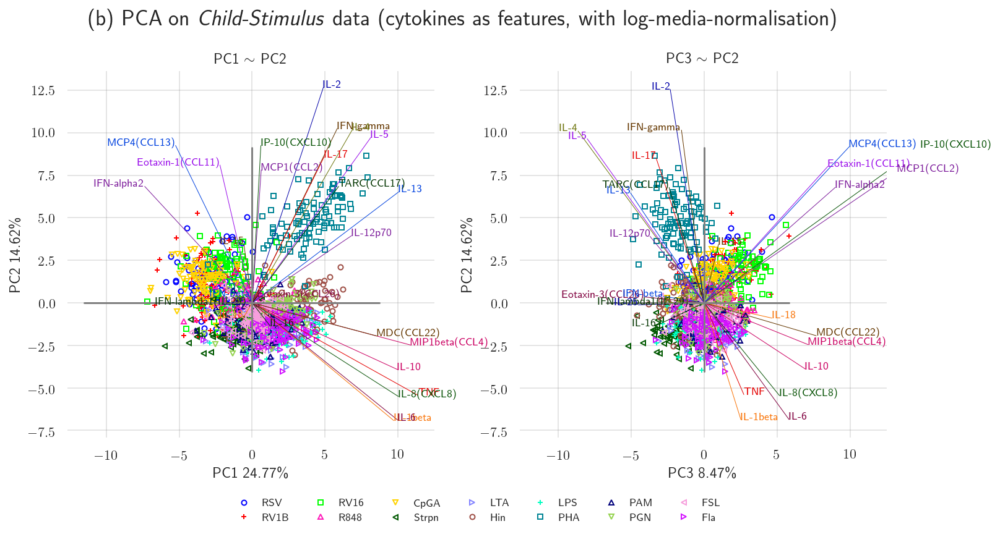

In [45]:
prefix = 'Figure3b'
centered = True


data = df_nrm_cyto.copy()
stimlist = stimlabel[1:]   
for HAVE_PHA in [ True]:
    fig = plt.figure(figsize=(12,7))
    gs = gridspec.GridSpec(2, 2,
                       width_ratios=[1,1],
                       height_ratios=[6,1])
    # gs.update(wspace=0.05,hspace=0.01)
    ax1 = fig.add_subplot(gs[0,0])
    ax2 = fig.add_subplot(gs[0,1])
    ax5 = fig.add_subplot(gs[1,:])

    stim_to_plot = stimlist[:]

    if HAVE_PHA == False:
        stim_to_plot.remove('PHA')
        suptitle = "All Stimuli (excl. PHA, norm. by media) and All Cytokines (as features)"
        fname = "cyto_AllStimAllCyto_PC123_noPHA_nomedia.pdf"            
    else:
        suptitle = "(b) PCA on \\textit{Child-Stimulus} data (cytokines as features, with log-media-normalisation)"
        fname = "Figure3b_June18.pdf"            

    fname = prefix + fname
    data_to_plot = data.loc[stim_to_plot,:]
    clust_to_plot = data_to_plot.index.get_level_values(0).values

    k_repel = 0.004
    ax1 = plot_pca_repel(data_to_plot, clust_to_plot, markevery=3,
             alpha =1, plot_weight = -1,legendon = False, ax=ax1, PCname=[1,2],extra_w = 1.1,k_repel = k_repel,
             centered = centered)
    ax1.set_title("PC1 $\\mathtt{\\sim}$ PC2")
    k_repel = 0.004
    ax2 = plot_pca_repel(data_to_plot, clust_to_plot, markevery=3,
             alpha =1, plot_weight = -1,legendon = False, ax=ax2, PCname=[3,2],extra_w = 1.69*1.1,k_repel = k_repel,
             centered = centered)
    ax2.set_title("PC3 $\\mathtt{\\sim}$ PC2")

    x0,x1 = ax1.get_xlim()
    y0,y1 = ax1.get_ylim()

    ax2.set_xlim([x0,x1])
    ax2.set_ylim([y0,y1])

    for ax in [ax1,ax2]:
        ax.set_aspect(abs(x1-x0)/abs(y1-y0))
        ax.set_frame_on(False)



    ax=ax5
    ax.grid(False)
    ax.set_facecolor('white')
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.legend(*ax1.get_legend_handles_labels(), ncol=7, frameon=False,
              loc = "center",labelspacing = 0.5, fontsize ='x-small')
    ax.set_frame_on(False)
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)

    plt.suptitle(suptitle,fontweight='bold',fontname = "Gill Sans MT Bold",fontsize=18)

    savefig(OutputDir + fname, bbox_inches="tight")




## Figure S7b: include media as independent variable, cytokine as features

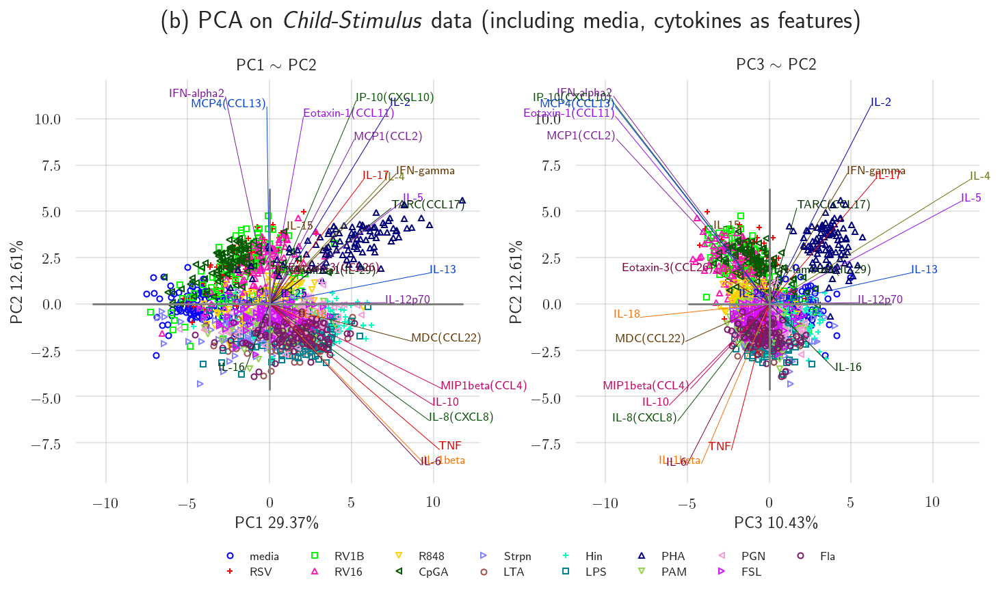

In [46]:
prefix = 'FigureS7b'
centered = True

data = df_log_cyto.copy()
stimlist = stimlabel[:]

for HAVE_PHA in [ True]:
    fig = plt.figure(figsize=(12,7))
    gs = gridspec.GridSpec(2, 2,
                       width_ratios=[1,1],
                       height_ratios=[6,1])
    # gs.update(wspace=0.05,hspace=0.01)
    ax1 = fig.add_subplot(gs[0,0])
    ax2 = fig.add_subplot(gs[0,1])
    ax5 = fig.add_subplot(gs[1,:])

    stim_to_plot = stimlist[:]

    if HAVE_PHA == False:
        stim_to_plot.remove('PHA')
        suptitle = "All Stimuli (excl. PHA), All Cytokines (as features)"
        fname = "cyto_AllStimAllCyto_PC123_noPHA.pdf"
    else:
        suptitle = "(b) PCA on \\textit{Child-Stimulus} data (including media, cytokines as features)"
        fname = "withMediaCytokineAsFeatures.pdf"
    
    fname = prefix + fname
    data_to_plot = data.loc[stim_to_plot,:]
    clust_to_plot = data_to_plot.index.get_level_values(0).values

    k_repel = 0.003
    ax1 = plot_pca_repel(data_to_plot, clust_to_plot, markevery=3,
             alpha =1, plot_weight = 1,legendon = False, ax=ax1, PCname=[1,2],extra_w = 1,k_repel = k_repel,
             centered = centered)
    ax1.set_title("PC1 $\\mathtt{\\sim}$ PC2")
    k_repel = 0.005
    ax2 = plot_pca_repel(data_to_plot, clust_to_plot, markevery=3,
             alpha =1, plot_weight = 1,legendon = False, ax=ax2, PCname=[3,2],extra_w = 1.6,k_repel = k_repel,
             centered = centered)
    ax2.set_title("PC3 $\\mathtt{\\sim}$ PC2")

    x0,x1 = ax1.get_xlim()
    y0,y1 = ax1.get_ylim()

    ax2.set_xlim([x0,x1])
    ax2.set_ylim([y0,y1])
 
    for ax in [ax1,ax2]:
        ax.set_aspect(abs(x1-x0)/abs(y1-y0))



    ax=ax5
    ax.grid(False)
    ax.set_facecolor('white')
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.legend(*ax1.get_legend_handles_labels(), ncol=8, frameon=False,
              loc = "center",labelspacing = 0.5, fontsize ='x-small')

    plt.suptitle(suptitle,fontweight='bold',fontname = "Gill Sans MT Bold",fontsize=18)

    savefig(OutputDir + fname, bbox_inches="tight")





## Figure 3c

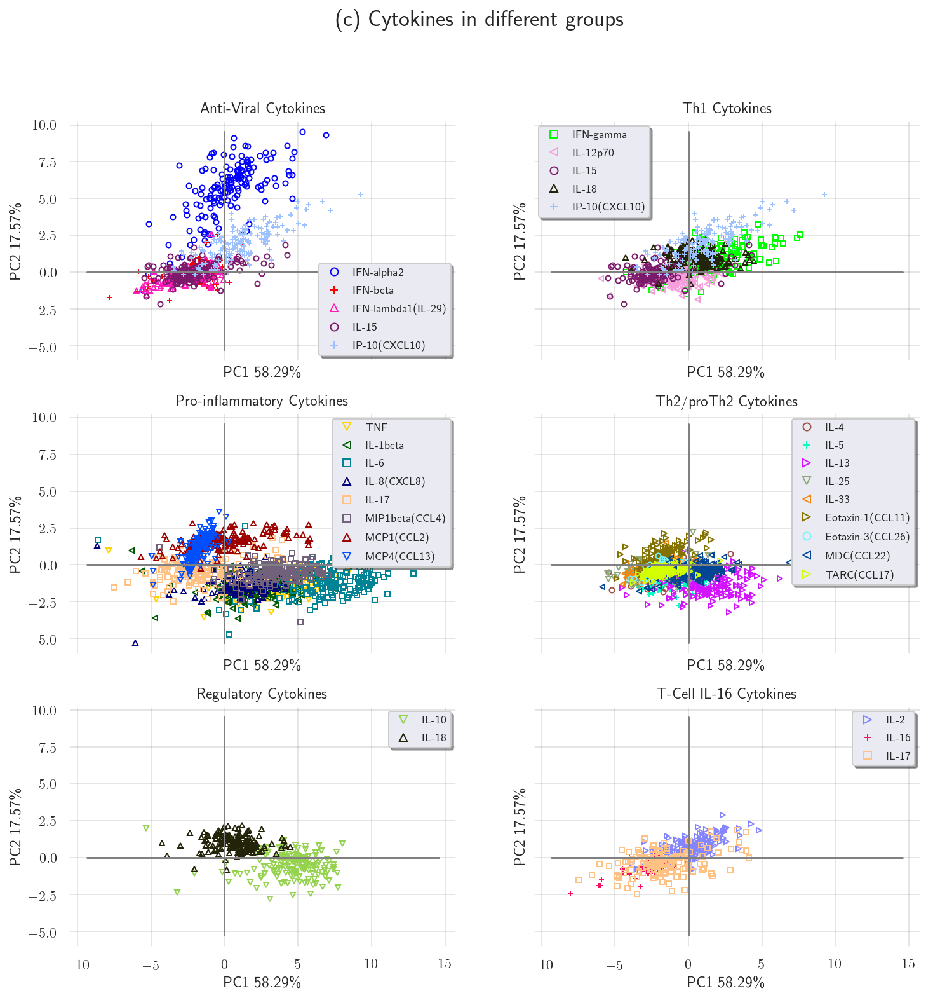

In [47]:
from lib.plot_pca_sk import plot_pca_filt
from functools import reduce
fig,axes = plt.subplots(3,2,figsize=(12,12),sharex = True, sharey =True)
axes = axes.flatten()
stimlist = stimlabel[:]
stimlist.remove('media')

for i,cyto in enumerate([['Anti-Viral'],['Th1'],['Pro-inflammatory'],['Th2/proTh2'],['Regulatory'], ['T-Cell','IL-16']]):
    
    filt = reduce(lambda x,y: x+y, (CytoDict[i] for i in cyto))
    
    df_stim = df_nrm_stim.loc[:,stimlist]
    clust = df_nrm_stim.index.get_level_values(0).values
    ax = axes[i]
    if i==0:
        plot_weight = 0
    else:
        plot_weight = 0
    ax = plot_pca_filt(df_stim, clust,filt= filt, markevery=2,
             alpha =1, plot_weight = plot_weight,legendon = 'best', ax=ax, PCname=[1,2],
            k_repel = 0.002, centered = True)
    title = ' '.join([reduce(lambda x,y: x+' '+y,cyto ),  ' Cytokines'])
    ax.set_title(title)
    ax.set_aspect('equal')
plt.suptitle('(c) Cytokines in different groups ',fontsize = 18, fontweight = "bold")
fname = "Figure3c_SeparateCytokineGroups_June18.pdf"
savefig(OutputDir + fname.replace('/','-'), bbox_inches="tight",doi = 1200)




# Stratified PCA and HC

Here we only consider data with cytokines and stimuli in a certain group. The group profile were defined in the dictionary: **``CytoDict``** and **``StimDict``**


***
* Figure 4:  Pro-inflammatory cytokine vs Bacterial stimuli
* Figure 5: Anti-viral vs Viral stimuli
* Figure S9b: Th1  vs Bacterial/Viral stimuli
* Figure S10b: Th2/proTh2 vs Bacterial/Viral stimuli
***

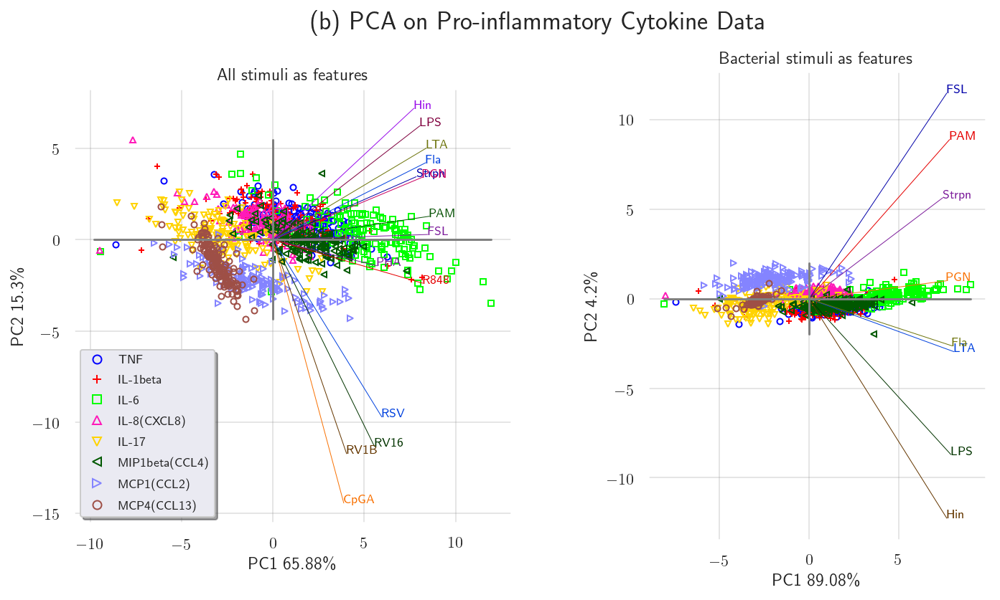

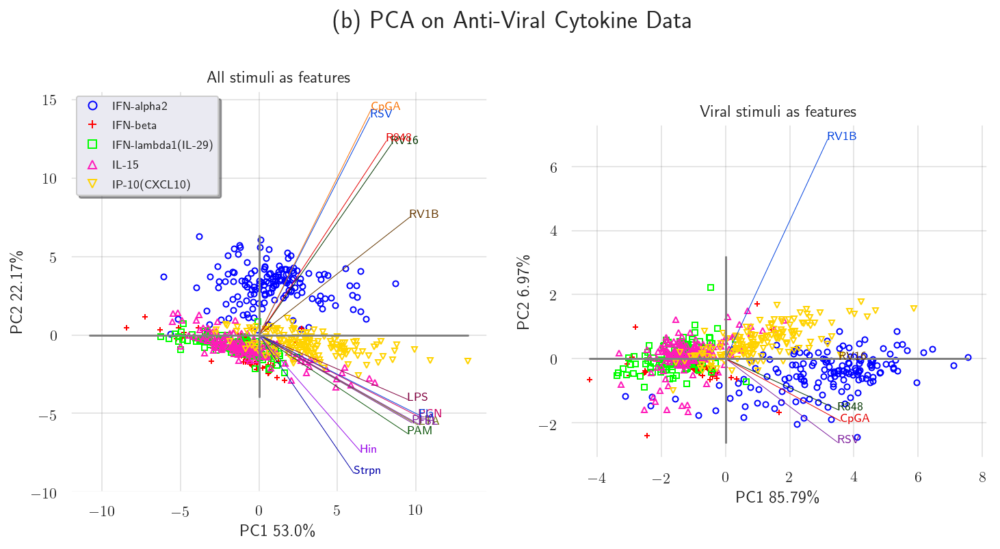

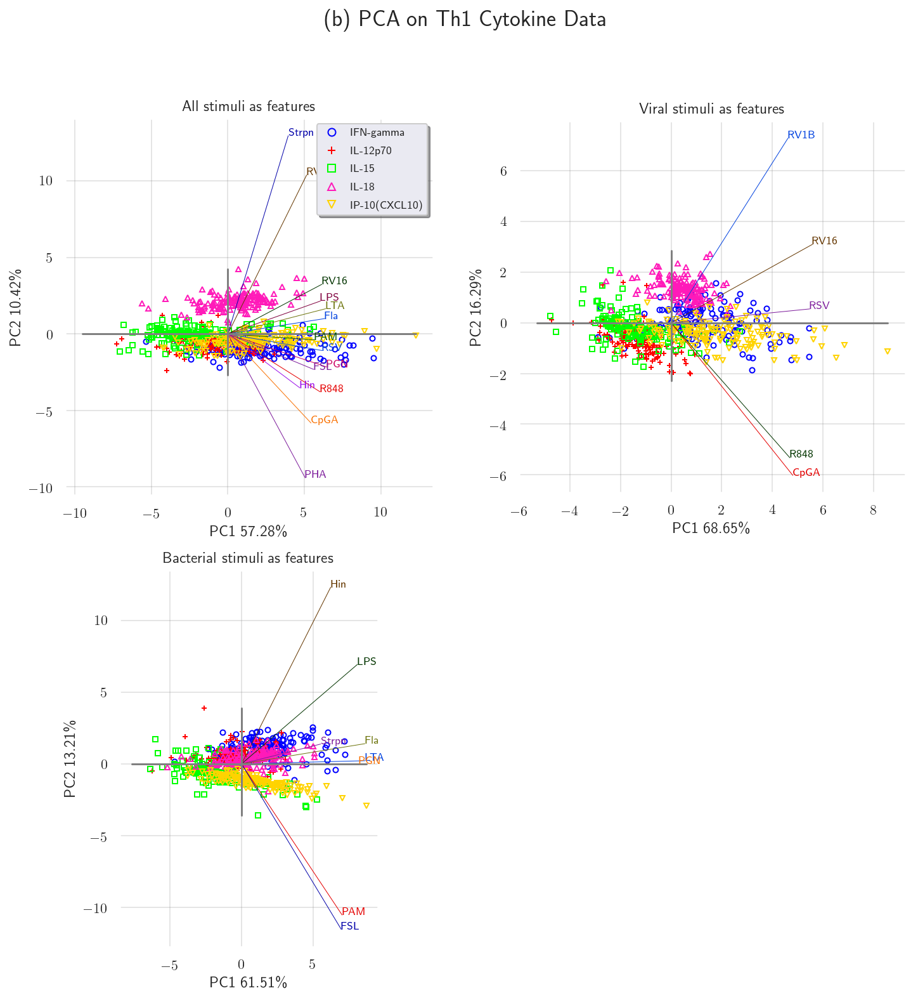

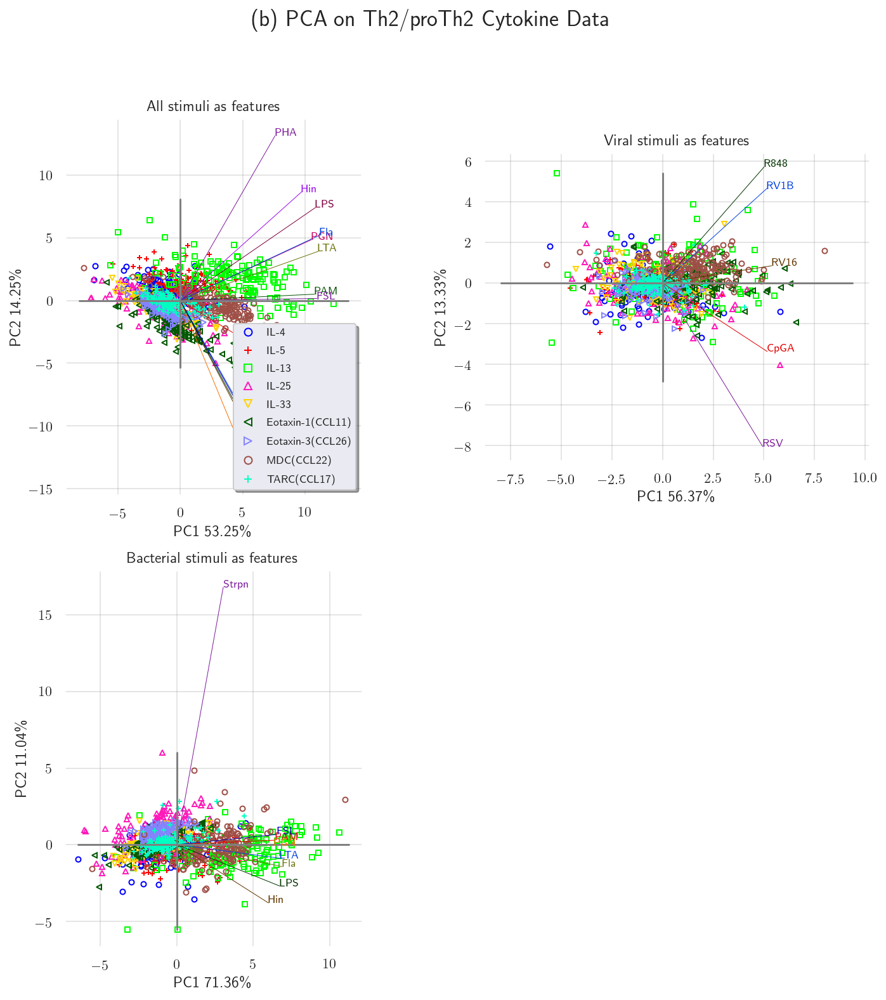

In [48]:
from lib.plot_stratPCA import plot_stratPCA

cytogrouplist = ['Pro-inflammatory', 'Anti-Viral','Th1','Th2/proTh2']
prefixlist = ['Figure4b','Figure5b','FigureS9b','FigureS10b']
for (cytogroup,prefix) in zip(cytogrouplist,prefixlist):
    plot_stratPCA(df_nrm_stim, cytogroup, CytoDict, StimDict, HAVE_PHA = True, 
                  prefix = prefix, addlabel='(b) ', OutputDir= OutputDir)

### Straitified HC

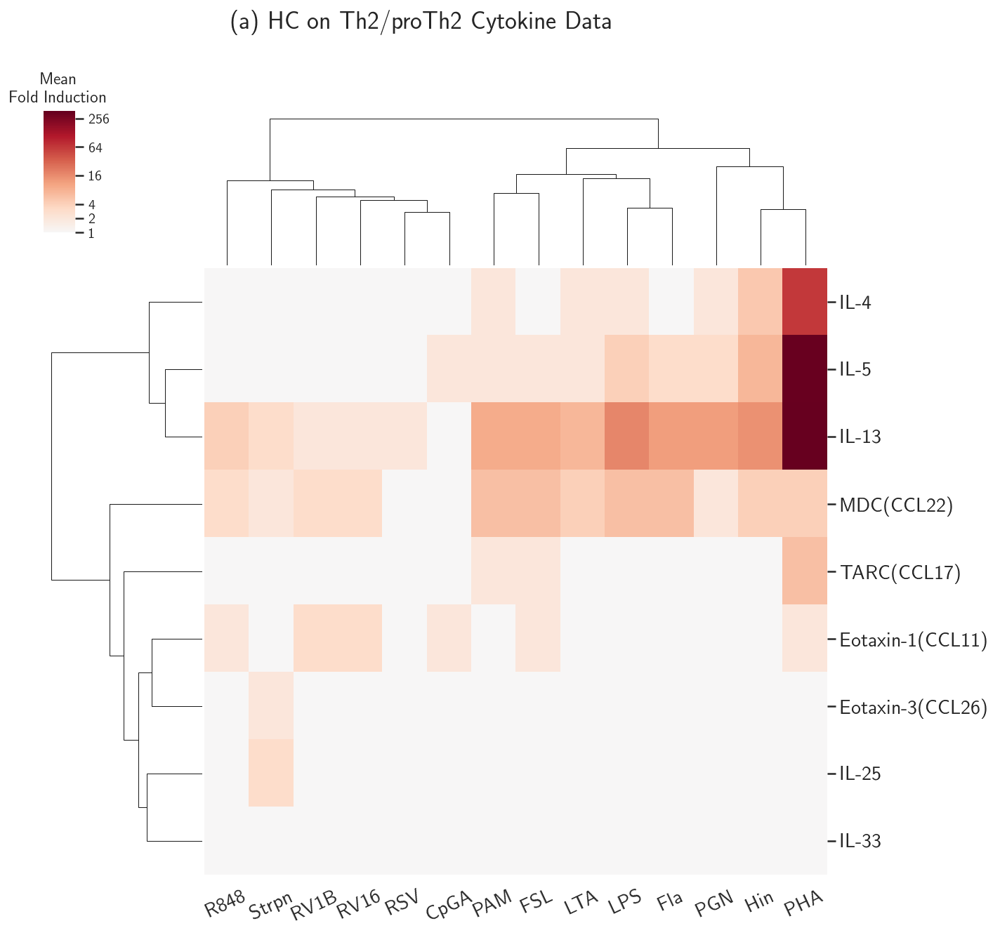

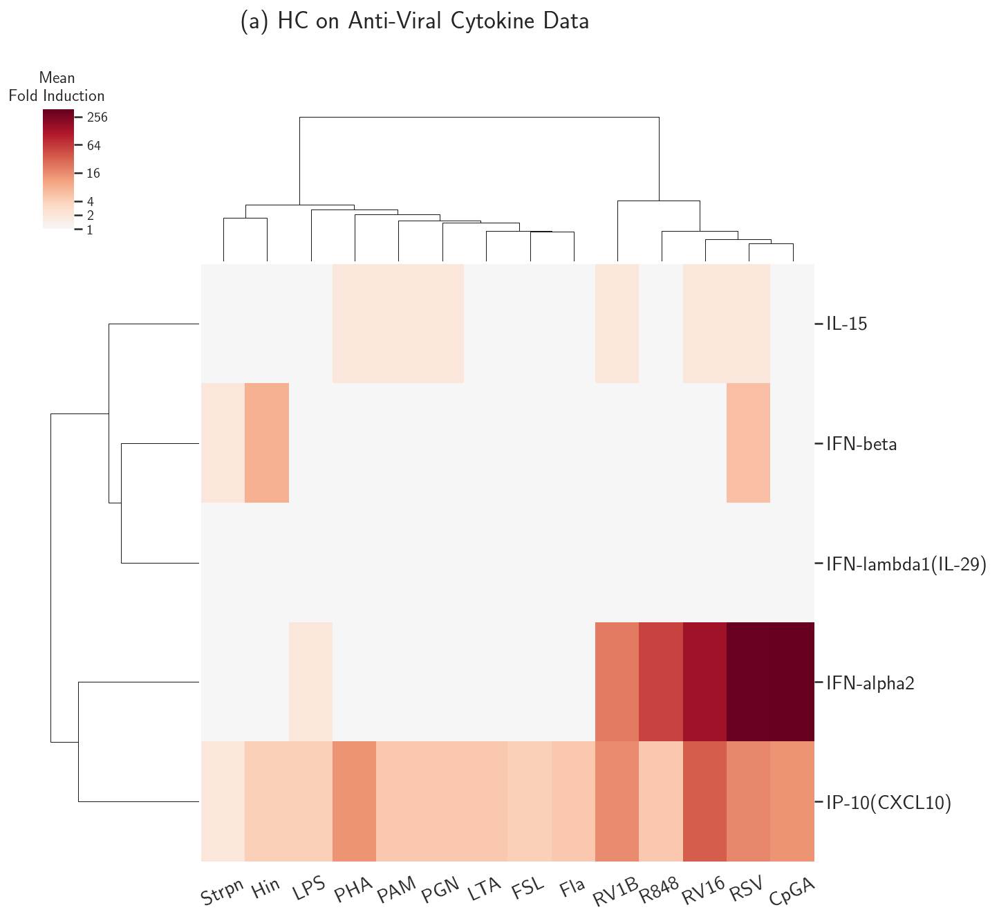

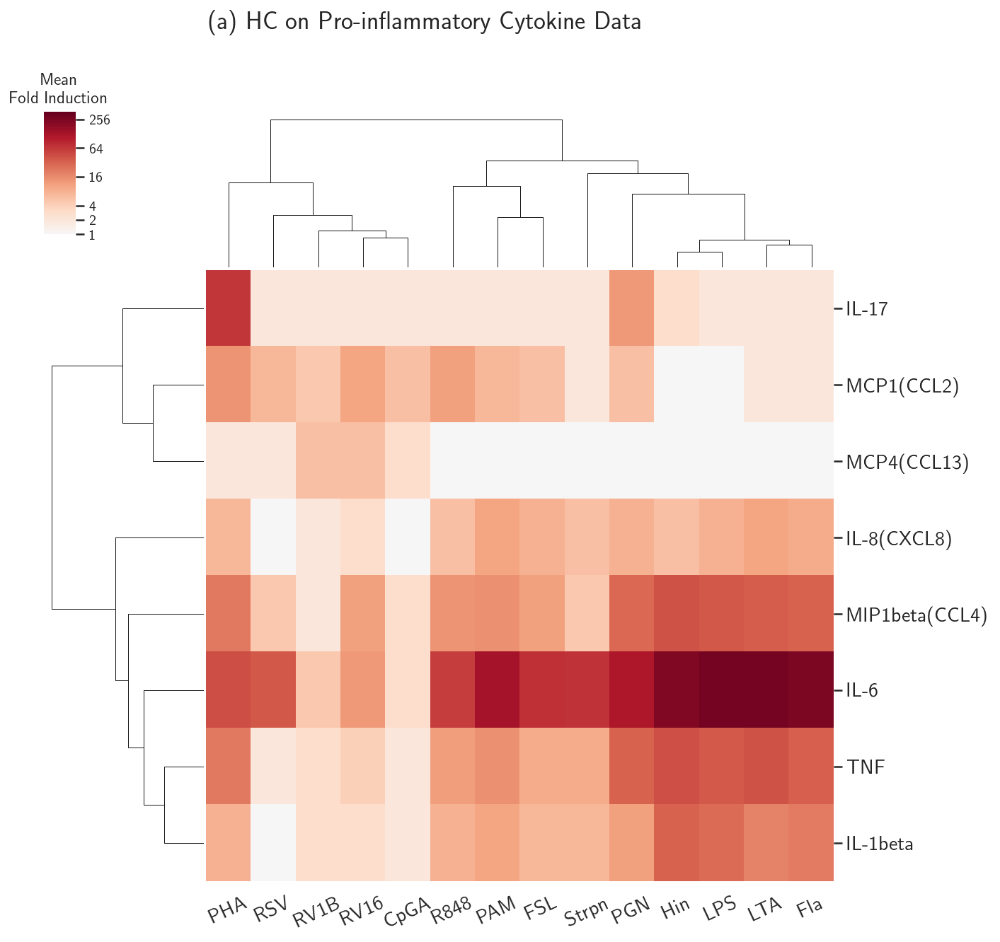

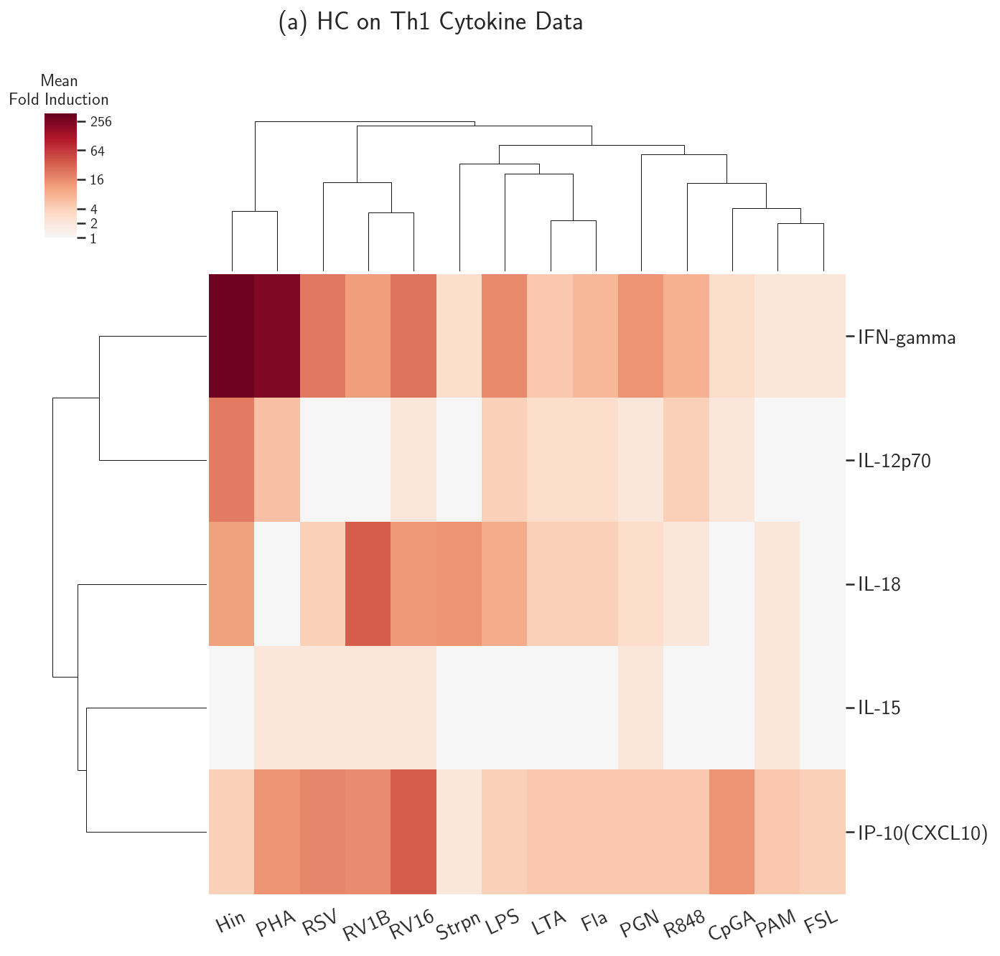

In [49]:
datapanel = datapanel_nrm.copy()

cbar_ticks = [0,1,2,4,6,8]
cbar_ticklabels = np.power(2,cbar_ticks)


for cy_gp in ['Th2/proTh2', 'Anti-Viral', 'Pro-inflammatory', 'Th1']:
    if cy_gp == 'Pro-inflammatory':
        prefix = 'Figure4a'
    elif cy_gp == 'Anti-Viral':
        prefix = 'Figure5a'
    elif cy_gp == 'Th1':
        prefix = 'FigureS9a'
    elif cy_gp == 'Th2/proTh2':
        prefix = 'FigureS10a'
        
    cytolist = CytoDict[cy_gp]
    stim = 'All'
    stimlist = stimlabel[1:]

    dp_cyto = datapanel.loc[cytolist,:,stimlist]
    
    CS_mean = np.log2(meanFold.loc[cytolist,stimlist])
    fname = prefix + cy_gp + stim + "clustermap_ccorr_aver_June18.pdf"
    plot_clustermap(dp_cyto,dist='c_correlation',
                mean = CS_mean,
                fname = OutputDir + fname.replace('/','_'),
                gp=False, fontsize = 'large', 
                addlabel='(a)' + ' HC on ' + cy_gp + ' Cytokine Data',
                cbar_title = 'Mean \n Fold Induction', vmax = 8.5,
                cbar_ticks = cbar_ticks, cbar_ticklabels = cbar_ticklabels
               )


# Clustering cytokine-stimulus pairs for stratified groups
---
### Figure 4c: Pro-inflammatory (strongly induced) vs bacterial stimuli
### Figure 5c: Anti-Viral (strongly induced) vs Viral stimuli

In [50]:
## Define new cytokine dictionary where we introduce "strongly induced" category
CytoDict = {'Anti-Viral':['IFN-alpha2', 'IFN-beta', 
                        'IFN-lambda1(IL-29)', 'IL-15', 'IP-10(CXCL10)'],
            'Strong Anti-Viral':['IFN-alpha2',  'IP-10(CXCL10)'], #'IFN-beta','IL-15', 'IFN-lambda1(IL-29)'
           'Th1': ['IFN-gamma', 'IL-12p70', 'IL-15'  ,  'IL-18'  ,  'IP-10(CXCL10)'],
           'Strong Th1': ['IFN-gamma', 'IL-12p70'  ,  'IP-10(CXCL10)','IL-18' , ], #,  'IL-15' 
           'Th2/proTh2': ['IL-4', 'IL-5', 'IL-13', 'IL-25', 'IL-33', 'Eotaxin-1(CCL11)', 
                          'Eotaxin-3(CCL26)', 'MDC(CCL22)', 'TARC(CCL17)'],
            'Strong Th2/proTh2': ['IL-4', 'IL-5', 'IL-13',#  'Eotaxin-1(CCL11)',
                                  #TARC(CCL17)',IL-25', 'IL-33','Eotaxin-3(CCL26)',
                           'MDC(CCL22)'],
           'Pro-inflammatory':['TNF', 'IL-1beta', 'IL-6', 'IL-8(CXCL8)', 
                               'IL-17', 'MIP1beta(CCL4)', 'MCP1(CCL2)', 'MCP4(CCL13)'],
            'Strong Pro-inflammatory':['TNF', 'IL-1beta', 'IL-6', 'IL-8(CXCL8)', 
                               'MIP1beta(CCL4)', 'MCP1(CCL2)'],
           'T-Cell':['IL-2',  'IL-17'],
            'IL-16':['IL-16'],
           'Regulatory':['IL-10', 'IL-18'],
           'All': ['IFN-alpha2', 'IFN-beta', 'IFN-gamma', 'IFN-lambda1(IL-29)',
               'TNF', 'IL-1beta', 'IL-2', 'IL-4', 'IL-5', 'IL-6',
               'IL-8(CXCL8)', 'IL-10', 'IL-12p70', 'IL-13', 'IL-15', 'IL-16',
               'IL-17', 'IL-18', 'IL-25', 'IL-33', 'Eotaxin-1(CCL11)',
               'Eotaxin-3(CCL26)', 'IP-10(CXCL10)', 'MIP1beta(CCL4)', 'MCP1(CCL2)',
               'MCP4(CCL13)', 'MDC(CCL22)', 'TARC(CCL17)'],
           'Strong': ['IFN-alpha2',  'IFN-gamma', # 'IFN-beta', 'IFN-lambda1(IL-29)', 'IL-15', 
               'TNF', 'IL-1beta', 'IL-2', 'IL-4', 'IL-5', 'IL-6',
               'IL-8(CXCL8)', 'IL-10', 'IL-12p70', 'IL-13', 'IL-16',
                 'Eotaxin-1(CCL11)',#'IL-17','MCP4(CCL13)', 'Eotaxin-3(CCL26)', 'IL-18','IL-25', 'IL-33', 
              'IP-10(CXCL10)', 'MIP1beta(CCL4)', 'MCP1(CCL2)',
                'MDC(CCL22)', 'TARC(CCL17)']}
StimDict = {'T-cells': ['PHA'],
            'Live-virus': ['RSV','RV1B','RV16'],
            'Ligand-virus':['R848','CpGA'],
            'Viral':['RSV','RV1B','RV16','R848','CpGA'],
#             'Ligand-virus':['polyIC','R848','CpGA'],
#             'Viral':['RSV','RV1B','RV16','polyIC','R848','CpGA'],
            'ViralPHA':['RSV','RV1B','RV16','R848','CpGA','PHA'],
            'Bacterial':['Strpn','LTA','Hin','LPS','PAM','PGN','FSL','Fla'],
            'BacterialPHA':['Strpn','LTA','Hin','LPS','PAM','PGN','FSL','Fla','PHA'],
            'All': ['PHA','RSV','RV1B','RV16','R848','CpGA','Strpn','LTA','Hin','LPS','PAM','PGN','FSL','Fla']}
            



In [51]:

from scipy.spatial.distance import pdist
from scipy.spatial.distance import pdist, squareform
from scipy.cluster.hierarchy import linkage, dendrogram
from sklearn.preprocessing import scale
from scipy.stats import spearmanr


def my_dist(df,dist = 'c_correlation',sm_with_mean=False, sm_with_std=False ): # distance between columns in df
    scale(df, axis=1, with_mean=sm_with_mean, with_std=sm_with_mean,copy=False)  # scale across samples
    X = df.values
    if dist in ['seuclidean', 'euclidean'] :
        V= np.var(X,axis=1)
        V[V==0]=1e-6
        Y = pdist(X.T, 'seuclidean',V=V)
    elif dist == 'c_correlation': # data centered correlation
        V= np.mean(X,axis=1) # mean for each row
        X = X-V[:,np.newaxis]
#         U = np.std(X,axis=1)
#         X = X/U[:,np.newaxis]
        Y = pdist(X.T, 'correlation')  # .T because pdist compute row (i.e., 'observation') dist
    elif dist == 'spearman':
        Y,_ = spearmanr(X)  # this is comput column correleation
        Y = 1 - Y  # distance
        Y = Y[np.triu_indices_from(Y,1)]
    else:
        Y = pdist(X.T, dist)   # Returns a condensed distance matrix Y. For each i and j (where i<j<n), 
                               # the metric dist(u=X[i], v=X[j]) is computed and stored in entry (i+1)j.
    link = linkage(Y,method='average')    
    
    # construct a distance matrix
    Y_mat = np.zeros((df.shape[1],df.shape[1]))
    Y_mat[np.triu_indices(Y_mat.shape[0],1)] = Y # Y is for the upper triangular part of Y_Mat
    Y_mat = Y_mat.T
    Y_mat[np.triu_indices(Y_mat.shape[0],1)] = Y
    Y_mat = pd.DataFrame(Y_mat,index=df.columns,columns=df.columns) # distance matrix/dataframe
    return Y_mat,link




Th2/proTh2


/anaconda3/lib/python3.6/site-packages/matplotlib/font_manager.py:1241: UserWarning: findfont: Font family ['Gill Sans MT Bold'] not found. Falling back to DejaVu Sans.
  (prop.get_family(), self.defaultFamily[fontext]))


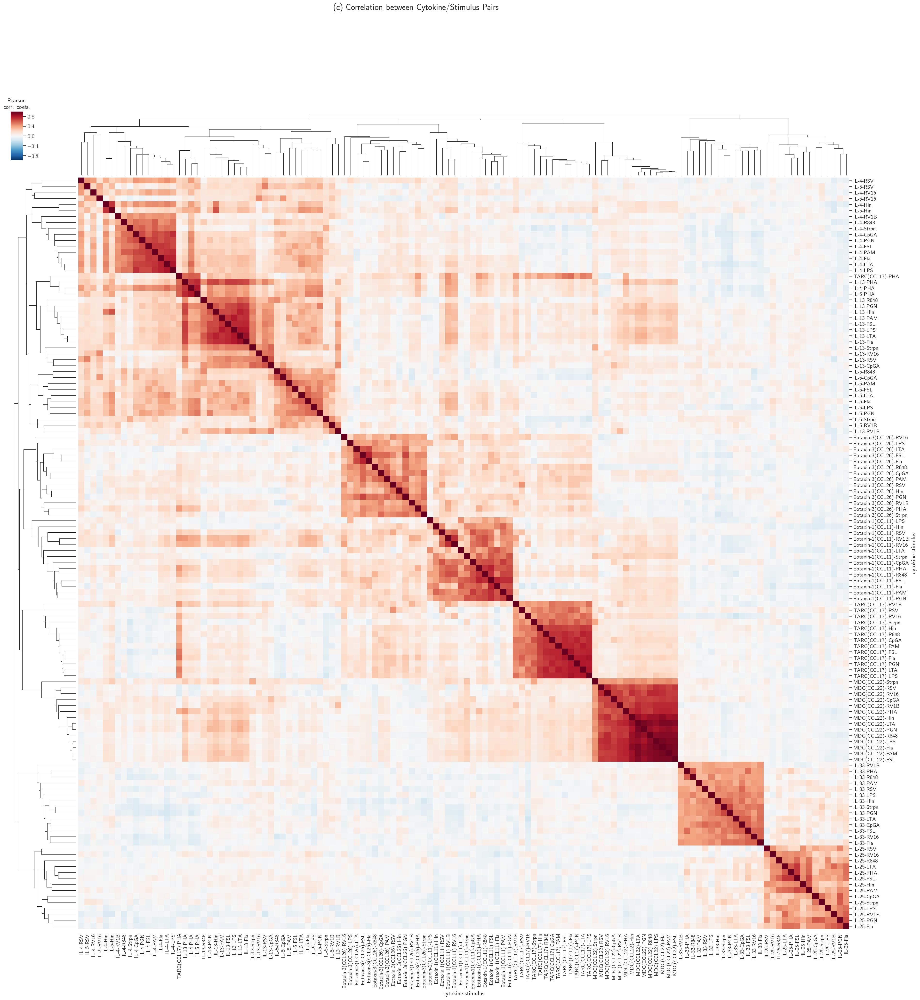

In [52]:
from itertools import cycle,product
from sklearn.preprocessing import scale

df = datapanel_nrm.swapaxes(0,2).to_frame(filter_observations=False)  # get a wide dataframe: sample X (cytokine-stimuli)
scale(df,axis = 1, with_mean=False,with_std=False,copy=False)
df = df.unstack()
df.columns = df.columns.swaplevel(0,1)

for cy_gp in ['Th2/proTh2',]:#[ 'Anti-Viral','Th2/proTh2', 'Pro-inflammatory','Th1']:
    if cy_gp == 'Pro-inflammatory':
#         st_gp = 'Bacterial'
        prefix = 'AllStimFigure4c'
    elif cy_gp == 'Anti-Viral':
        prefix = 'AllStimFigure5c'
#         st_gp = 'Viral'
    elif cy_gp == 'Th1':
        prefix = 'AllStimFigureS9c'
#         st_gp = 'All'
    elif cy_gp == 'Th2/proTh2':
        prefix = 'AllStimFigureS10c'
#         st_gp = 'Bacterial'
    
    st_gp = 'All'
    print(cy_gp)
    C = CytoDict[cy_gp]
    S = StimDict[st_gp]
    pairs = [i for i in product(C,S)]

    df_totest = df.loc[:,pairs]
    
    Y_mat,link = my_dist(df_totest,dist='correlation',sm_with_mean=False,sm_with_std=False)
    
    fs = np.max([8,np.int(16/64.0*df_totest.shape[1])])
    coeff = 1-Y_mat
    if (coeff<0).any().any():
        cmap = plt.get_cmap('RdBu_r')
        vmin = -1
        vmax = 1
    else: 
        cmap = sns.cubehelix_palette(light=1, as_cmap=True)
        vmin = None
        vmax = 1

    
    clm = sns.clustermap(coeff,figsize=(fs,fs), cmap = cmap, vmin=vmin, vmax=vmax,
                         row_linkage=link,col_linkage=link)
#     xlabels = [item.get_text() for item in clm.ax_heatmap.get_xticklabels()]
#     ylabels = [item.get_text() for item in clm.ax_heatmap.get_yticklabels()]
#     rowind = clm.dendrogram_row.reordered_ind
#     colind = clm.dendrogram_col.reordered_ind

    
#     ylbl = clm.ax_heatmap.get_yticklabels()
#     _=clm.ax_heatmap.set_yticklabels(ylbl,rotation=0)
    clm.cax.set_title('Pearson \n corr. coefs.')
    
    
    suptitle = '(c) Correlation between Cytokine/Stimulus Pairs'
    plt.suptitle(suptitle,fontname = "Gill Sans MT Bold",fontsize=18)
    fname = prefix + cy_gp.replace('/','_') + '_correlation_'+st_gp.replace('/','_')+'_noScale.pdf'
    clm.savefig(OutputDir + fname,bbox_inches='tight')



Strong Anti-Viral


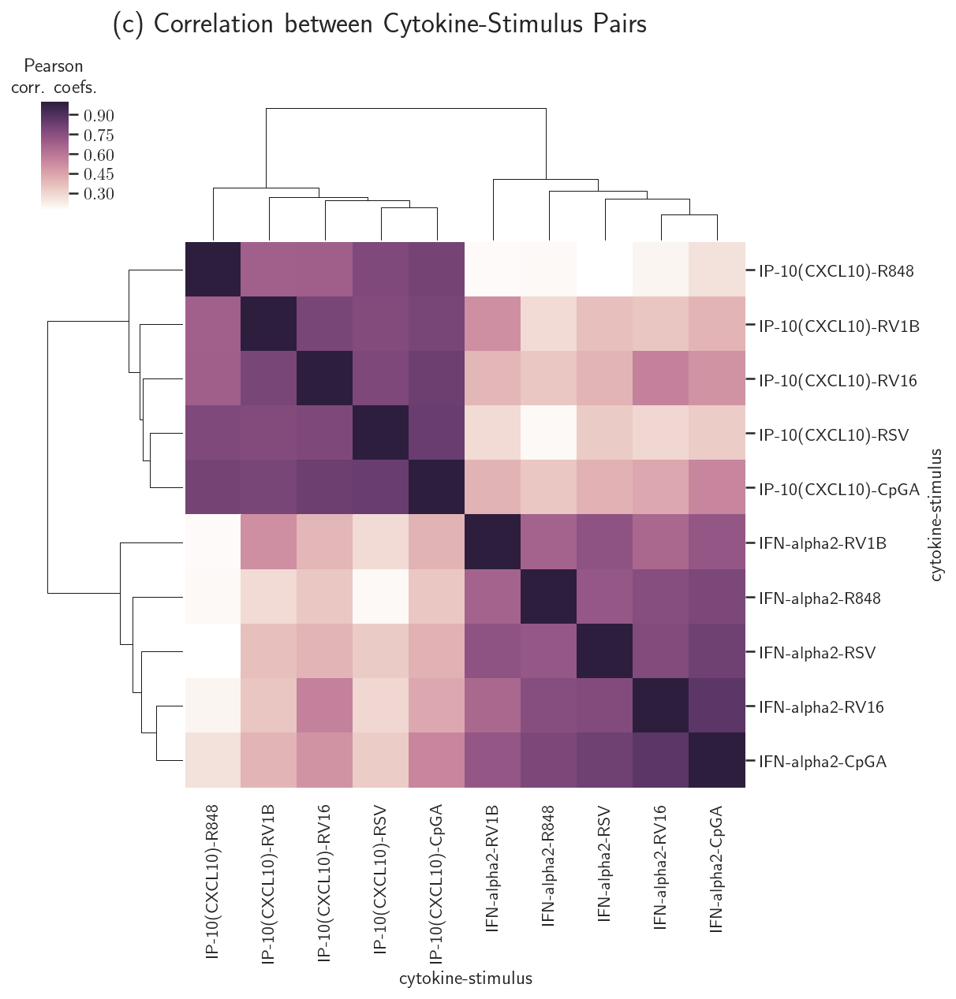

In [53]:
from itertools import cycle,product
from sklearn.preprocessing import scale

df = datapanel_nrm.swapaxes(0,2).to_frame(filter_observations=False)  # get a wide dataframe: sample X (cytokine-stimuli)
scale(df,axis = 1, with_mean=False,with_std=False,copy=False)
df = df.unstack()
df.columns = df.columns.swaplevel(0,1)

for cy_gp in ['Strong Anti-Viral']:#[ 'Strong Anti-Viral','Strong Th2/proTh2', 'Strong Pro-inflammatory','Strong Th1']:
    if cy_gp == 'Strong Pro-inflammatory':
        st_gp = 'Bacterial'
        prefix = 'Figure4c'
    elif cy_gp == 'Strong Anti-Viral':
        prefix = 'Figure5c'
        st_gp =  'Viral'
    elif cy_gp == 'Strong Th1':
        prefix = 'FigureS9c'
        st_gp = 'All'
    elif cy_gp == 'Strong Th2/proTh2':
        prefix = 'FigureS10c'
        st_gp = 'BacterialPHA'
    print(cy_gp) 
    C = CytoDict[cy_gp]
    S = StimDict[st_gp]
    pairs = [i for i in product(C,S)]

    df_totest = df.loc[:,pairs]
    
    Y_mat,link = my_dist(df_totest,dist='correlation',sm_with_mean=False,sm_with_std=False)
    
    fs = np.max([8,np.int(16/64.0*df_totest.shape[1])])
    coeff = 1-Y_mat
    if (coeff<0).any().any():
        cmap = plt.get_cmap('RdBu_r')
        vmin = -1
        vmax = 1
    else: 
        cmap = sns.cubehelix_palette(light=1, as_cmap=True)
        vmin = None
        vmax = 1
    clm = sns.clustermap(coeff,figsize=(fs,fs), cmap = cmap, vmin=vmin, vmax=vmax,
                         row_linkage=link,col_linkage=link)
    ylbl = clm.ax_heatmap.get_yticklabels()
    _=clm.ax_heatmap.set_yticklabels(ylbl,rotation=0)
    clm.cax.set_title('Pearson \n corr. coefs.')
    
    
    suptitle = '(c) Correlation between Cytokine-Stimulus Pairs'
    plt.suptitle(suptitle,fontname = "Gill Sans MT Bold",fontsize=18)
    fname = prefix + cy_gp.replace('/','_') + '_correlation_'+st_gp.replace('/','_')+'_noScale.pdf'
    clm.savefig(OutputDir + fname,bbox_inches='tight')



# Figure 6, S13: GWAS

In [7]:

sheetnames = ['rs8028121',
    'rs111481643',
    'rs117007889',
    'rs139089467',
    'rs77609006',
    'rs73624755',
    'chr7_67342638_D',
    'rs7440580',
    'chr2_221028028_I']

In [8]:
rs_dict = pd.read_excel('data/BacterialStimuliAnnotate21July2017_All.xlsx',
                        usecols='F,M,P',sheet_name=sheetnames)


## Generate single panel Figure 6

/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


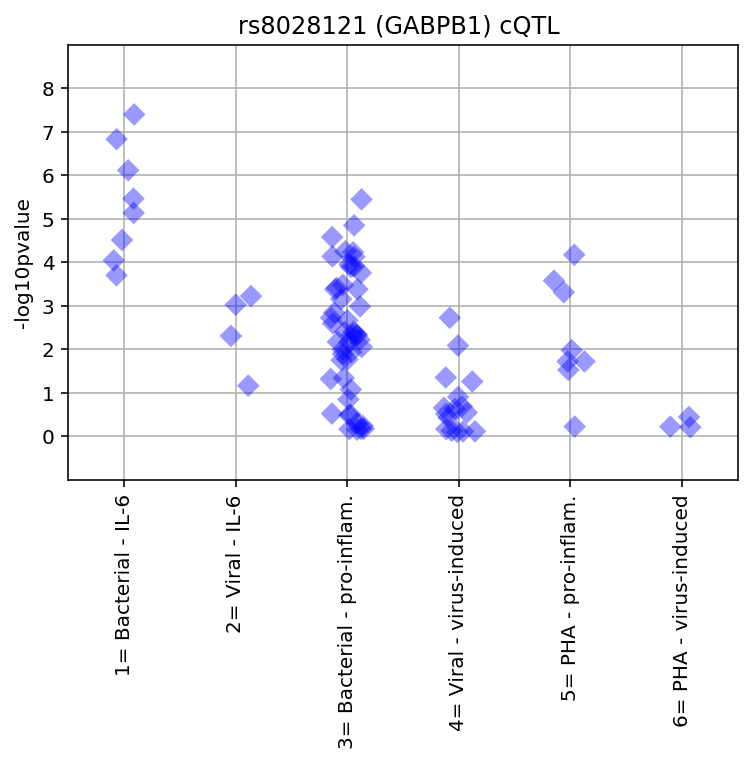

In [7]:
rs = 'rs8028121'
sheet = 'rs8028121'
df_rs = rs_dict[sheet]
sym = 'GABPB1'
x_ticklabels = [
'1= Bacterial - IL-6',
'2= Bacterial - pro-inflam.',
'3= Viral - IL-6',
'4= Viral - virus-induced',
'5= PHA - pro-inflam.',
'6= PHA - virus-induced']

np.random.seed(1234)

fig,ax = plt.subplots(1,1,figsize=(6,4))

sns.stripplot(data = df_rs,x = 'TypeNumeric',y = '-log10pvalue', color ='blue',
              size = 8, jitter = .15,alpha=.4,marker = "D",ax=ax)
ax.set_xlabel('')


ax.grid('on')
ax.set_title(rs + ' (' + sym + ')' + ' cQTL ')
ax.set_ylim((-1,9))
ax.set_yticks(range(0,9))

_=ax.set_xticklabels(x_ticklabels,rotation=90)


savefig(OutputDir + 'Fig6.pdf', bbox_inches='tight')




/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "


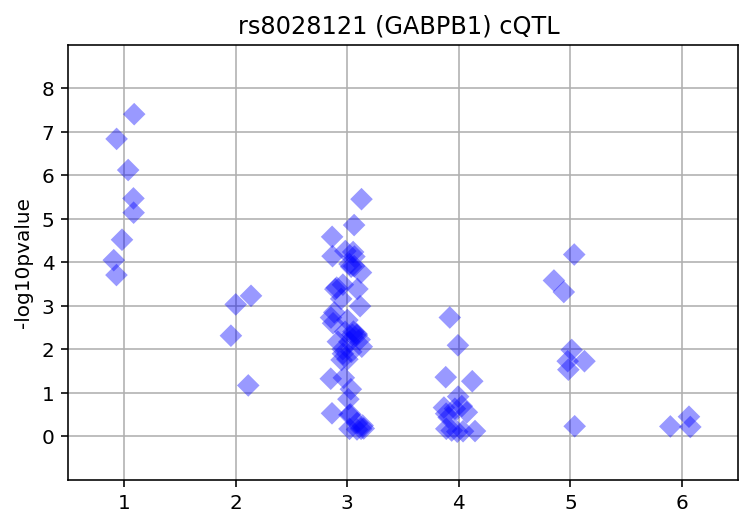

In [10]:
rs = 'rs8028121'
sheet = 'rs8028121'
df_rs = rs_dict[sheet]
sym = 'GABPB1'

np.random.seed(1234)

fig,ax = plt.subplots(1,1,figsize=(6,4))

sns.stripplot(data = df_rs,x = 'TypeNumeric',y = '-log10pvalue', color ='blue',
              size = 8, jitter = .15,alpha=.4,marker = "D",ax=ax)
ax.set_xlabel('')


ax.grid('on')
ax.set_title(rs + ' (' + sym + ')' + ' cQTL ')
ax.set_ylim((-1,9))
ax.set_yticks(range(0,9))

x_ticklabels = [str(i) for i in range(1,7)]

_=ax.set_xticklabels(x_ticklabels)


savefig(OutputDir + 'Fig6_newX.pdf', bbox_inches='tight')




## Generate multiple panel Figure S13

In [11]:
# rslist = ['rs8028121',
#     'rs111481643',
#     'rs117007889',
#     'rs139089467',
#     'rs77609006',
#     'rs73624755',
#     'chr7:67342638:D',
#     'rs7440580',
#     'chr2:221028028:I']
rslist = ['rs139089467',
    'chr2:221028028:I',
    'rs8028121',
    'rs111481643',
    'rs117007889',
    'rs77609006',
    'rs73624755',
    'chr7:67342638:D',
    'rs7440580']
sheetnames = ['rs139089467',
    'chr2_221028028_I',
    'rs8028121',
    'rs111481643',
    'rs117007889',
    'rs77609006',
    'rs73624755',
    'chr7_67342638_D',
    'rs7440580']

/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "
/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "
/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "
/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passi

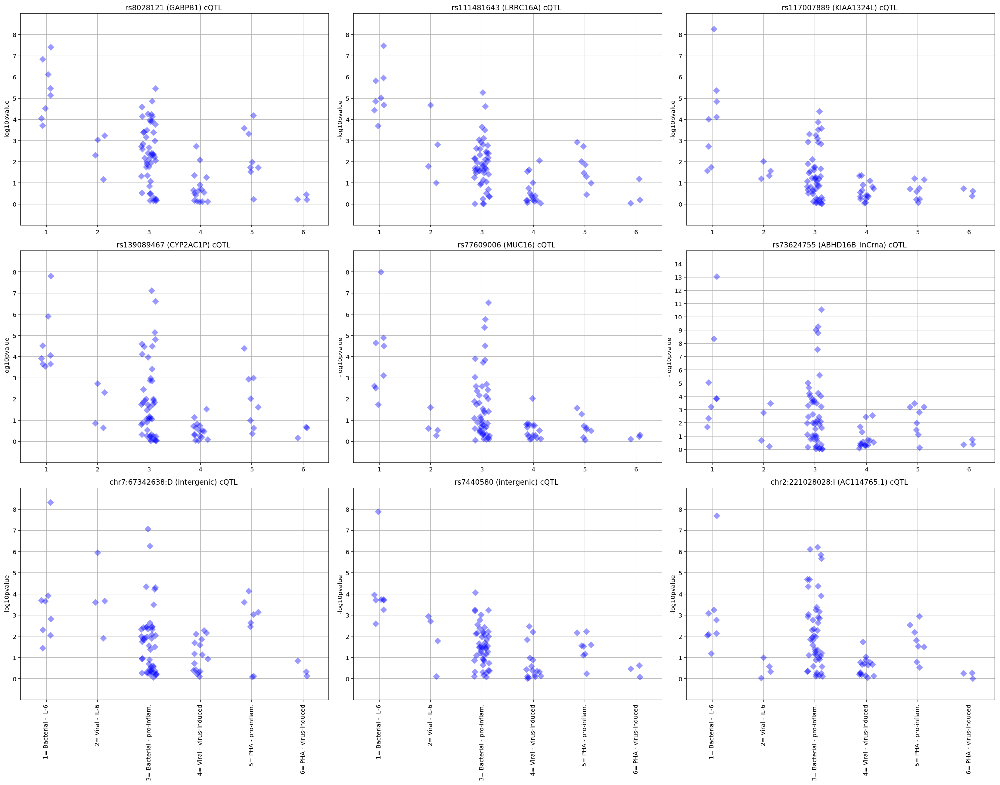

In [11]:
x_ticklabels = [
'1= Bacterial - IL-6',
'2= Viral - IL-6',
'3= Bacterial - pro-inflam.',
'4= Viral - virus-induced',
'5= PHA - pro-inflam.',
'6= PHA - virus-induced']

matplotlib.rcParams['text.usetex'] = False

import matplotlib.gridspec as gridspec
fig = plt.figure(figsize=(29,21))
gs = gridspec.GridSpec(3, 3)
gs.update(wspace=0.08,hspace=0.12)

for i,(rs,sheet) in enumerate(zip(rslist,sheetnames)):
    np.random.seed(1234)
    df_rs = rs_dict[sheet]
    sym = df_rs.loc[:,'SYMBOL'][0]
    if sym == 'GABPB1_USP8':
        sym = 'GABPB1'
    if i==0:
        ax = fig.add_subplot(gs[i])
    else:
        ax = fig.add_subplot(gs[i])#,sharey=axold)
    sns.stripplot(data = df_rs,x = 'TypeNumeric',y = '-log10pvalue', color ='blue',
                  size = 8, jitter = .15,alpha=.4,marker = "D",ax=ax)
    ax.set_xlabel('')
    if i== 5:
        ax.set_ylim((-1,15))
        ax.set_yticks(range(0,15))
    else:
        ax.set_ylim((-1,9))
        ax.set_yticks(range(0,9))
    ax.grid('on')
    ax.set_title(rs + ' (' + sym + ')' + ' cQTL ')
    if i in [6,7,8]:
        _=ax.set_xticklabels(x_ticklabels,rotation=90)
    axold = ax
savefig(OutputDir + 'FigS13_' + 'all' + 'lanscape.pdf', bbox_inches='tight')



In [16]:
# rslist = ['rs8028121',
#     'rs111481643',
#     'rs117007889',
#     'rs139089467',
#     'rs77609006',
#     'rs73624755',
#     'chr7:67342638:D',
#     'rs7440580',
#     'chr2:221028028:I']
rslist = ['rs139089467',
    'chr2:221028028:I',
    'rs8028121',
    'rs111481643',
    'rs117007889',
    'rs77609006',
    'rs73624755',
    'chr7:67342638:D',
    'rs7440580']
sheetnames = ['rs139089467',
    'chr2_221028028_I',
    'rs8028121',
    'rs111481643',
    'rs117007889',
    'rs77609006',
    'rs73624755',
    'chr7_67342638_D',
    'rs7440580']

In [22]:
df_rs = rs_dict[sheetnames[1]]

In [23]:
df_rs.head()

,TypeNumeric,SYMBOL,-log10pvalue
0,3,AC114765.1,1.348851
1,3,AC114765.1,2.897261
2,3,AC114765.1,1.806839
3,3,AC114765.1,1.982432
4,3,AC114765.1,1.387495


/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "
/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "
/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "
/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passi

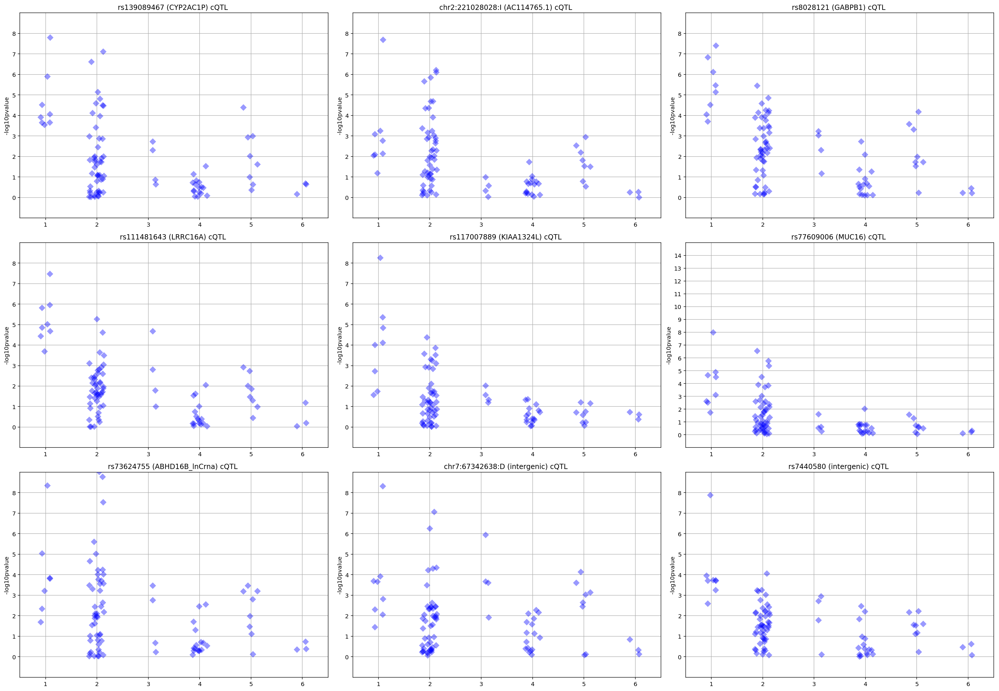

In [32]:
x_ticklabels = [
'1= Bacterial - IL-6',
# '2= Viral - IL-6',
# '3= Bacterial - pro-inflam.',
'2= Bacterial - pro-inflam.',
'3= Viral - IL-6',
'4= Viral - virus-induced',
'5= PHA - pro-inflam.',
'6= PHA - virus-induced']

matplotlib.rcParams['text.usetex'] = False

import matplotlib.gridspec as gridspec
fig = plt.figure(figsize=(30,21))
gs = gridspec.GridSpec(3, 3)
gs.update(wspace=0.08,hspace=0.12)

for i,(rs,sheet) in enumerate(zip(rslist,sheetnames)):
    np.random.seed(1234)
    df_rs = rs_dict[sheet]
    sym = df_rs.loc[:,'SYMBOL'][0]
    if sym == 'GABPB1_USP8':
        sym = 'GABPB1'
    if i==0:
        ax = fig.add_subplot(gs[i])
    else:
        ax = fig.add_subplot(gs[i])#,sharey=axold)
    # as requested by John 30 June, swap 2 and 3 in 'TypeNumeric'
    df_rs.loc[:,'TypeNumericNew'] = df_rs.TypeNumeric.apply(lambda x: 5-x if x in [2,3] else x)
    sns.stripplot(data = df_rs,x = 'TypeNumericNew',y = '-log10pvalue', color ='blue',
                  size = 8, jitter = .15,alpha=.4,marker = "D",ax=ax)
    ax.set_xlabel('')
    if i== 5:
        ax.set_ylim((-1,15))
        ax.set_yticks(range(0,15))
    else:
        ax.set_ylim((-1,9))
        ax.set_yticks(range(0,9))
    ax.grid('on')
    ax.set_title(rs + ' (' + sym + ')' + ' cQTL ')
#     if i in [6,7,8]:
#         _=ax.set_xticklabels(x_ticklabels,rotation=90)
    axold = ax
savefig(OutputDir + 'FigS13_' + 'all' + 'lanscapeNewXSwap23.pdf', bbox_inches='tight')



In [15]:

rslist = [#'rs8028121',
    'rs111481643',
    'rs117007889',
    'rs139089467',
    'rs77609006',
    'rs73624755',
    'chr7:67342638:D',
    'rs7440580',
    'chr2:221028028:I']
sheetnames = [#'rs8028121',
    'rs111481643',
    'rs117007889',
    'rs139089467',
    'rs77609006',
    'rs73624755',
    'chr7_67342638_D',
    'rs7440580',
    'chr2_221028028_I']

/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "
/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "
/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warn_deprecated("2.2", "Passing one of 'on', 'true', 'off', 'false' as a "
/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:424: MatplotlibDeprecationWarning: 
Passi

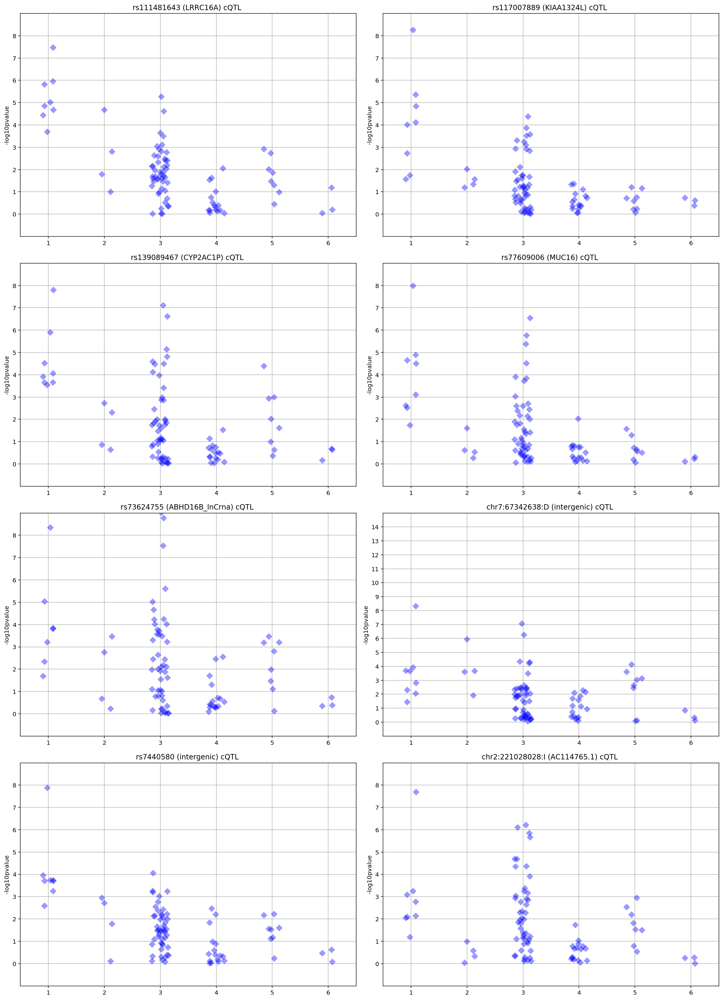

In [16]:
x_ticklabels = [
'1= Bacterial - IL-6',
'2= Viral - IL-6',
'3= Bacterial - pro-inflam.',
'4= Viral - virus-induced',
'5= PHA - pro-inflam.',
'6= PHA - virus-induced']

matplotlib.rcParams['text.usetex'] = False

import matplotlib.gridspec as gridspec
fig = plt.figure(figsize=(21,30))
gs = gridspec.GridSpec(4, 2)
gs.update(wspace=0.08,hspace=0.12)

for i,(rs,sheet) in enumerate(zip(rslist,sheetnames)):
    np.random.seed(1234)
    df_rs = rs_dict[sheet]
    sym = df_rs.loc[:,'SYMBOL'][0]
    if sym == 'GABPB1_USP8':
        sym = 'GABPB1'
    if i==0:
        ax = fig.add_subplot(gs[i])
    else:
        ax = fig.add_subplot(gs[i])#,sharey=axold)
    sns.stripplot(data = df_rs,x = 'TypeNumeric',y = '-log10pvalue', color ='blue',
                  size = 8, jitter = .15,alpha=.4,marker = "D",ax=ax)
    ax.set_xlabel('')
    if i== 5:
        ax.set_ylim((-1,15))
        ax.set_yticks(range(0,15))
    else:
        ax.set_ylim((-1,9))
        ax.set_yticks(range(0,9))
    ax.grid('on')
    ax.set_title(rs + ' (' + sym + ')' + ' cQTL ')
#     if i in [6,7,8]:
#         _=ax.set_xticklabels(x_ticklabels,rotation=90)   
    axold = ax
savefig(OutputDir + 'FigS7_' + '4by2' + 'NewX.pdf', bbox_inches='tight')



# Appendix
---
The following analyses were not included in paper1 manuscript. It would nevertheless be interesting.

## Viability versus Cytokine responses

In [14]:
sampleID = pd.read_excel('data/SampleID.xlsx',sheet_name='Yr11',index_col='Code')
sampleID.rename(index={22947:22497},inplace=True)

/opt/anaconda3/lib/python3.8/site-packages/openpyxl/worksheet/_reader.py:312: UserWarning: Unknown extension is not supported and will be removed
  warn(msg)


In [15]:
sampleID.head()

,Number,Batch
Code,,
12090,Sa01,1
14093,Sa02,1
14088,Sa03,1
12128,Sa04,1
25238,Sa05,1


In [16]:
sampleID.shape

(340, 2)

In [13]:
from scipy.stats import pearsonr,spearmanr

viability = pd.read_csv('data/viabilityYr1116_pct.csv',index_col=0)
print(viability.head())



# X = datapanel_raw_nrm.loc[:,:,'RV16']
via_11 = viability.loc[:,'11']
via_11.name = 'viability'


             11     13/16
number                   
11003   0.22000  0.400000
11005   0.50000       NaN
11011   0.07554  0.203540
11024   0.58000  0.195783
11028   0.13600  0.200000


In [18]:
via_11.head()

number
11003    0.22000
11005    0.50000
11011    0.07554
11024    0.58000
11028    0.13600
Name: viability, dtype: float64

In [28]:
idYr11 = datapanel_raw_nrm.index.values

In [64]:
via_batch = sampleID.loc[idYr11,['Batch']].astype(str).join(via_11,how='left')

In [65]:
via_batch

,Batch,viability
Code,,
11003,2,0.22000
11005,2,0.50000
11011,2,0.07554
11024,2,0.58000
11028,2,0.13600
...,...,...
37048,2,0.48000
37051,2,0.20000
37053,2,0.50000


In [64]:
via_batch = sampleID.loc[idYr11,['Batch']].astype(str).join(via_11,how='left')

from scipy import stats
t, p = stats.ttest_ind(*via_batch.groupby('Batch')['viability'].apply(list))

In [364]:
t,p

(0.0039092722167573596, 0.772787950355101)

(<AxesSubplot:xlabel='Batch', ylabel='viability'>,
 [<statannot.StatResult.StatResult at 0x7fa71d2e7b80>])

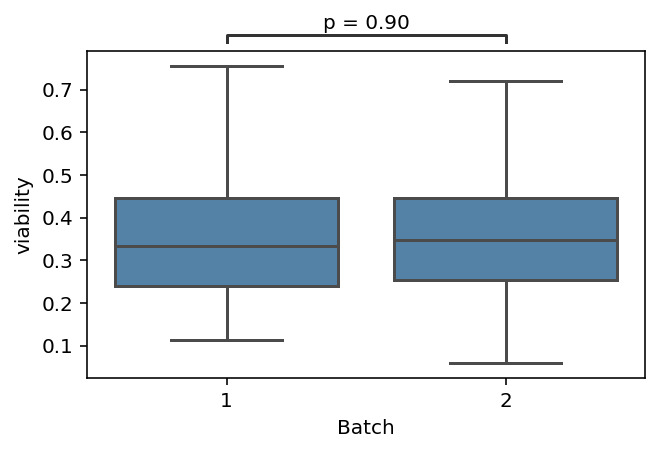

In [350]:

from statannot import add_stat_annotation

from scipy.special import logit, expit

fig,ax = plt.subplots(1,1,figsize=(5,3))
ax = sns.boxplot(data = via_batch, color='steelblue',x='Batch',y = 'viability',order=['1','2'],showfliers=False, ax=ax)



test = "t-test_ind"

add_stat_annotation(ax, plot='boxplot',
                        data = via_batch, x='Batch',y = 'viability', box_pairs=[('1','2')],
                           test=test, text_format='simple',
                           loc='outside', verbose=0)



In [59]:
# X = pd.read_csv('data/Year16RemoveDeadSamplesLog2.csv',index_col=[0,1]).unstack(1)
# via_16 = viability.loc[:,'13/16']
# via_16.name = 'viability'



# X_via = X.join(via_16)

# X_vialong = X_via.reset_index().melt(id_vars=['number','viability'],value_name='resp',var_name='cyto')




# g = sns.FacetGrid(data= X_vialong, col="cyto",col_wrap=5,sharey=True)
# g = (g.map(sns.regplot,'viability','resp').set_titles("{col_name}"))

# _=[ax.set_title('\n '+ax.get_title() + '\n corr:' + str(temp.loc[ax.get_title(),'corr']) + \
#                                 '  p:' + str(temp.loc[ax.get_title(),'pvalue']))  for ax in g.axes]
# savefig('Cytokine_Viability_yr16_notcorrected.pdf',bbox_inches='tight')

In [60]:
# X = pd.read_csv('combat_RawLN.csv',index_col=-1)

# via_16 = viability.loc[:,'13/16']
# via_16.name = 'viability'

# X_via = X.loc[:,'IFN.alpha2.CpGA':'TARC.CCL17..media'].join(via_16)

# X_vialong = X_via.reset_index().melt(id_vars=['number','viability'],value_name='resp',var_name='cyto')



# g = sns.FacetGrid(data= X_vialong, col="cyto",col_wrap=5,sharey=True)
# g = (g.map(sns.regplot,'viability','resp').set_titles("{col_name}"))

# # _=[ax.set_title('\n '+ax.get_title() + '\n corr:' + str(temp.loc[ax.get_title(),'corr']) + \
# #                                 '  p:' + str(temp.loc[ax.get_title(),'pvalue']))  for ax in g.axes]
# savefig('Cytokine_Viability_yr16.pdf',bbox_inches='tight')

Now load non-batch-adjusted response

In [363]:
from importlib import reload
import lib.loadData as loadData
reload(loadData)
# data folder
dataDir = os.path.abspath('data')

cytolabel,stimlabel = loadData.load_labels(dataDir)
meanFold = loadData.load_meanFoldChange(dataDir)

datapanel_raw, datapanel_raw_nrm, datapanel_raw_log, datapanel_nrm, datapanel_log  =  \
                                            loadData.load_cytokine(dataDir,batch_adjust=False)
print('cytokine labels: \n' + ', '.join(cytolabel) + '\n')
print('stimulus labels: \n' + ', '.join(stimlabel) + '\n')


cytokine labels: 
IFN-alpha2, IFN-beta, IFN-gamma, IFN-lambda1(IL-29), TNF, IL-1beta, IL-2, IL-4, IL-5, IL-6, IL-8(CXCL8), IL-10, IL-12p70, IL-13, IL-15, IL-16, IL-17, IL-18, IL-25, IL-33, Eotaxin-1(CCL11), Eotaxin-3(CCL26), IP-10(CXCL10), MIP1beta(CCL4), MCP1(CCL2), MCP4(CCL13), MDC(CCL22), TARC(CCL17)

stimulus labels: 
media, RSV, RV1B, RV16, polyIC, R848, CpGA, Strpn, LTA, Hin, LPS, PHA, PAM, PGN, FSL, Fla



In [587]:
X = datapanel_raw_log.copy()

via_11 = viability.loc[:,'11']
via_11.name = 'viability'

 
X_via = X.join(via_11)


 

ptDict = OrderedDict()

via_batch = sampleID.loc[idYr11,['Batch']].join(via_11,how='left')

x = via_batch.copy()
x.loc[:,'Batch'] = 2-x['Batch']
x.loc[:,'viability'] = x.loc[:,'viability']*100-x.loc[:,'viability'].dropna().mean()*100
x.drop('Batch',axis=1,inplace=True)
for c,resp in X_via.drop(['viability'],axis=1).iteritems():
    y = resp.dropna()
    x2 = sm.add_constant(x.loc[y.index,:])
    est = sm.OLS(y, x2)
#     est = sm.RLM(y, x2, M=sm.robust.norms.HuberT())
    est2 = est.fit()
    p = est2.pvalues['viability']
    p_const = est2.pvalues['const']
    corr = est2.params['viability']
    
    corr_const = est2.params['const']
    ptDict[c] = (p,corr,p_const,corr_const)
    

ptDict= pd.DataFrame(ptDict).T.astype('float')
ptDict.columns = ['pvalue_org','coef','pconst_org','coef_const']


import qvalue_py3 as qvalue

ptDict['pvalue']= qvalue.estimate(ptDict.pvalue_org)
ptDict['pvalue_const']= qvalue.estimate(ptDict.pconst_org)

/opt/anaconda3/lib/python3.8/site-packages/pandas/core/reshape/merge.py:648: UserWarning: merging between different levels can give an unintended result (2 levels on the left,1 on the right)
  warnings.warn(msg, UserWarning)


In [588]:
ptDict.shape

(448, 6)

In [589]:
ptDict[(ptDict.pvalue<.05) &(ptDict.coef>0.01)&(ptDict.coef_const>0.01) & (ptDict.pvalue_const<0.05)].sort_values('pvalue')

pvalue_org      coef     pconst_org  coef_const    pvalue  \
IL-18      Strpn    0.000021  0.020750  3.840698e-127    2.917688  0.003864   
IL-1beta   Hin      0.000166  0.026512  1.590983e-224    9.389110  0.013568   
IL-2       RV16     0.000139  0.022915   7.536084e-65    1.910584  0.013568   
TNF        Hin      0.000306  0.022205  3.159940e-269   11.670052  0.020045   
IFN-alpha2 RSV      0.000600  0.022606  7.119939e-193    6.821396  0.028071   
IFN-gamma  Hin      0.000589  0.030914  4.344717e-191    9.194683  0.028071   
           RV16     0.001773  0.024196  1.206289e-156    5.988404  0.048631   
IL-2       RSV      0.001783  0.020541   2.125377e-71    2.251407  0.048631   
IL-12p70   Hin      0.001521  0.022163   1.323189e-43    1.633451  0.048631   
IL-18      Hin      0.001650  0.016734   3.244555e-96    2.399539  0.048631   

                   pvalue_const  
IL-18      Strpn  1.479468e-128  
IL-1beta   Hin    1.538668e-225  
IL-2       RV16    2.095102e-66  
TNF        Hin    5.039777e-270  
IFN-alpha2 RSV    4.494911e-194  
IFN-gamma  Hin    2.686900e-192  
           RV16   5.483131e-158  
IL-2       RSV     6.019194e-73  
IL-12p70   Hin     3.427062e-45  
IL-18      Hin     1.072580e-97

In [590]:
ptDict[(ptDict.pvalue_org<.05/(28*16))].sort_values('pvalue') 

,,pvalue_org,coef,pconst_org,coef_const,pvalue,pvalue_const
IL-16,Strpn,0.000024,0.008487,0.000000e+00,10.725190,0.003864,0.000000e+00
IL-18,Strpn,0.000021,0.020750,3.840698e-127,2.917688,0.003864,1.479468e-128


In [591]:
ptDict[(ptDict.pvalue<0.05)].sort_values('pvalue') 

,,pvalue_org,coef,pconst_org,coef_const,pvalue,pvalue_const
IL-16,Strpn,0.000024,0.008487,0.000000e+00,10.725190,0.003864,0.000000e+00
IL-18,Strpn,0.000021,0.020750,3.840698e-127,2.917688,0.003864,1.479468e-128
IL-1beta,Hin,0.000166,0.026512,1.590983e-224,9.389110,0.013568,1.538668e-225
IL-2,RV16,0.000139,0.022915,7.536084e-65,1.910584,0.013568,2.095102e-66
TNF,Hin,0.000306,0.022205,3.159940e-269,11.670052,0.020045,5.039777e-270
IFN-alpha2,RSV,0.000600,0.022606,7.119939e-193,6.821396,0.028071,4.494911e-194
IFN-gamma,Hin,0.000589,0.030914,4.344717e-191,9.194683,0.028071,2.686900e-192
IL-13,PAM,0.001165,-0.029755,6.952077e-23,1.322737,0.047657,1.667565e-24
IFN-gamma,RV16,0.001773,0.024196,1.206289e-156,5.988404,0.048631,5.483131e-158
IL-2,RSV,0.001783,0.020541,2.125377e-71,2.251407,0.048631,6.019194e-73


In [483]:
pv_org = ptDict[['pvalue_org']].unstack(1)
pv = ptDict[['pvalue']].unstack(1)
coef = ptDict[['coef']].unstack(1)

pvConst = ptDict[['pvalue_const']].unstack(1)


pv_org.columns =pv_org.columns.droplevel(0)
pv.columns =pv.columns.droplevel(0)
coef.columns =coef.columns.droplevel(0)

pvConst.columns =pvConst.columns.droplevel(0)

In [490]:
stimlabel.remove('polyIC')

In [493]:
pv_org.applymap(lambda x: '{0:.3f}'.format(x)).loc[cytolabel,stimlabel].to_excel(OutputDir+'pvalue_viability.xlsx')

In [473]:
pv.applymap(lambda x: '{0:.2f}'.format(x))

,CpGA,FSL,Fla,Hin,LPS,LTA,PAM,PGN,PHA,R848,RSV,RV16,RV1B,Strpn,media,polyIC
Eotaxin-1(CCL11),0.70,0.68,0.70,0.67,0.58,0.71,0.71,0.70,0.57,0.68,0.70,0.24,0.62,0.65,0.56,0.57
Eotaxin-3(CCL26),0.44,0.74,0.72,0.55,0.71,0.68,0.73,0.74,0.68,0.50,0.66,0.68,0.68,0.64,0.57,0.60
IFN-alpha2,0.58,0.68,0.71,0.75,0.70,0.70,0.75,0.66,0.71,0.67,0.33,0.53,0.68,0.68,0.70,0.59
IFN-beta,0.00,0.00,0.00,0.74,0.00,0.00,0.00,0.00,0.00,0.00,0.05,0.00,0.00,0.54,0.00,0.00
IFN-gamma,0.65,0.50,0.68,0.03,0.60,0.63,0.35,0.29,0.43,0.27,0.16,0.07,0.21,0.50,0.71,0.66
IFN-lambda1(IL-29),0.68,0.68,0.68,0.53,0.70,0.68,0.24,0.74,0.53,0.66,0.68,0.70,0.68,0.68,0.68,0.74
IL-10,0.05,0.59,0.53,0.29,0.65,0.66,0.71,0.50,0.54,0.65,0.24,0.66,0.11,0.70,0.50,0.58
IL-12p70,0.66,0.66,0.58,0.08,0.68,0.68,0.53,0.62,0.68,0.67,0.64,0.03,0.66,0.68,0.57,0.33
IL-13,0.74,0.68,0.54,0.66,0.50,0.37,0.02,0.68,0.62,0.48,0.72,0.66,0.42,0.50,0.70,0.53
IL-15,0.74,0.56,0.74,0.68,0.65,0.65,0.63,0.57,0.70,0.49,0.35,0.54,0.68,0.57,0.64,0.57


In [ ]:

import statsmodels.api as sm

from scipy.stats import pearsonr,spearmanr

viability = pd.read_csv('data/viabilityYr1116_pct.csv',index_col=0)
print(viability.head())

X = datapanel_raw_log.copy()
via_11 = viability.loc[:,'11']
via_11.name = 'viability'



X_via = X.join(via_11).reset_index(drop=False)
X_vialong = X_via.melt(id_vars=['number','viability'],value_name='resp',var_name='cyto')
X_vialong['pair']= X_vialong.cyto.apply(lambda x: x[0]+'/'+x[1])
temp = ptDict.applymap(lambda x: '{0:.3f}'.format(x))



g = sns.FacetGrid(X_vialong, col="pair",col_wrap=5,sharey=True)
g = (g.map(sns.regplot,'viability','resp',robust=False).set_titles("{col_name}").set(xlim=(0,1)))

_=[ax.set_title('\n '+ax.get_title() + '\n coef:' + str(temp.loc[tuple(ax.get_title().split('/')),'coef']) + \
                                '  p:' + str(temp.loc[tuple(ax.get_title().split('/')),'pvalue']))  for ax in g.axes]

savefig(OutputDir + 'Cytokine_Viability_AllSigpairs_qvalue.pdf',bbox_inches='tight')

             11     13/16
number                   
11003   0.22000  0.400000
11005   0.50000       NaN
11011   0.07554  0.203540
11024   0.58000  0.195783
11028   0.13600  0.200000


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/reshape/merge.py:648: UserWarning: merging between different levels can give an unintended result (2 levels on the left,1 on the right)
  warnings.warn(msg, UserWarning)


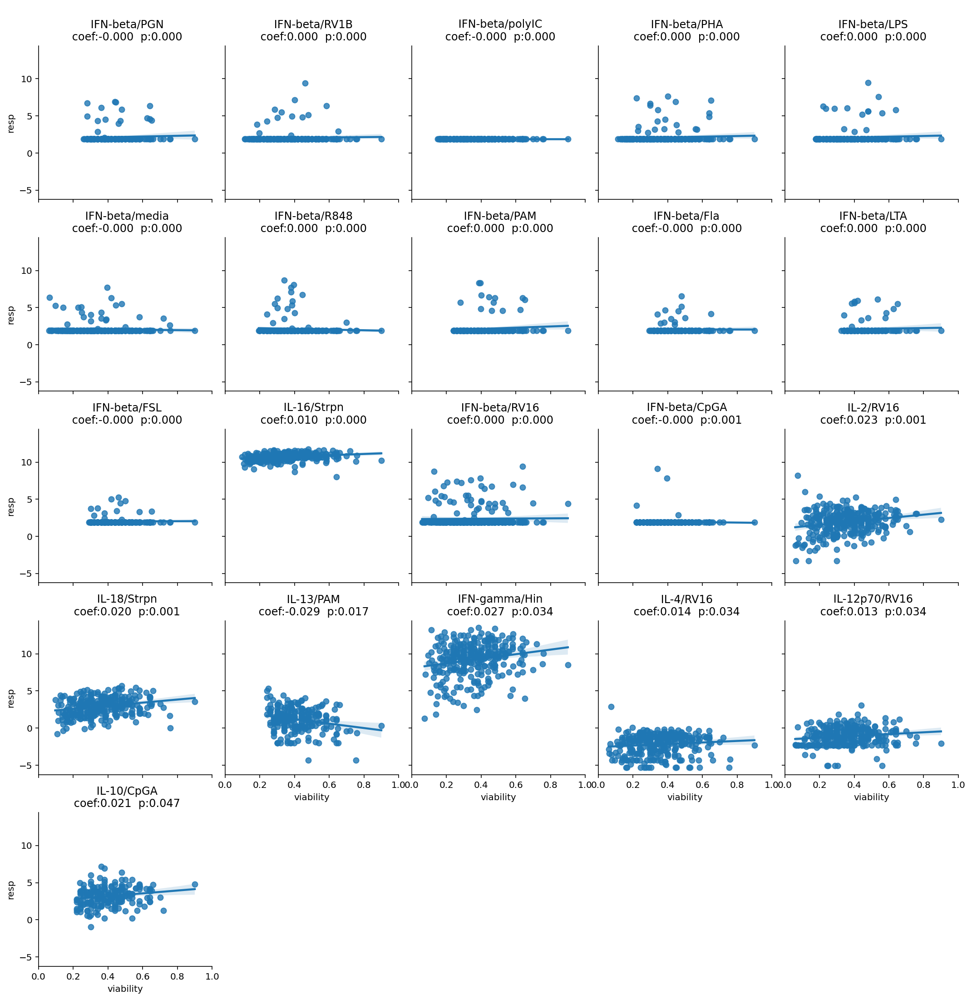

In [482]:

import statsmodels.api as sm

from scipy.stats import pearsonr,spearmanr

viability = pd.read_csv('data/viabilityYr1116_pct.csv',index_col=0)
print(viability.head())

sigPairs = ptDict[(ptDict.pvalue<.05)].sort_values('pvalue').index # & (ptDict.coef>.01)
X = datapanel_raw_log.loc[:,sigPairs]
via_11 = viability.loc[:,'11']
via_11.name = 'viability'



X_via = X.join(via_11).reset_index(drop=False)
X_vialong = X_via.melt(id_vars=['number','viability'],value_name='resp',var_name='cyto')
X_vialong['pair']= X_vialong.cyto.apply(lambda x: x[0]+'/'+x[1])
temp = ptDict.applymap(lambda x: '{0:.3f}'.format(x))



g = sns.FacetGrid(X_vialong, col="pair",col_wrap=5,sharey=True)
g = (g.map(sns.regplot,'viability','resp',robust=False).set_titles("{col_name}").set(xlim=(0,1)))

_=[ax.set_title('\n '+ax.get_title() + '\n coef:' + str(temp.loc[tuple(ax.get_title().split('/')),'coef']) + \
                                '  p:' + str(temp.loc[tuple(ax.get_title().split('/')),'pvalue']))  for ax in g.axes]

savefig(OutputDir + 'Cytokine_Viability_AllSigpairs_qvalue.pdf',bbox_inches='tight')

In [594]:
ptDict[(ptDict.pvalue_org<.05/(28*16))].sort_values('pvalue')

,,pvalue_org,coef,pconst_org,coef_const,pvalue,pvalue_const
IL-16,Strpn,0.000024,0.008487,0.000000e+00,10.725190,0.003864,0.000000e+00
IL-18,Strpn,0.000021,0.020750,3.840698e-127,2.917688,0.003864,1.479468e-128


             11     13/16
number                   
11003   0.22000  0.400000
11005   0.50000       NaN
11011   0.07554  0.203540
11024   0.58000  0.195783
11028   0.13600  0.200000


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/reshape/merge.py:648: UserWarning: merging between different levels can give an unintended result (2 levels on the left,1 on the right)
  warnings.warn(msg, UserWarning)


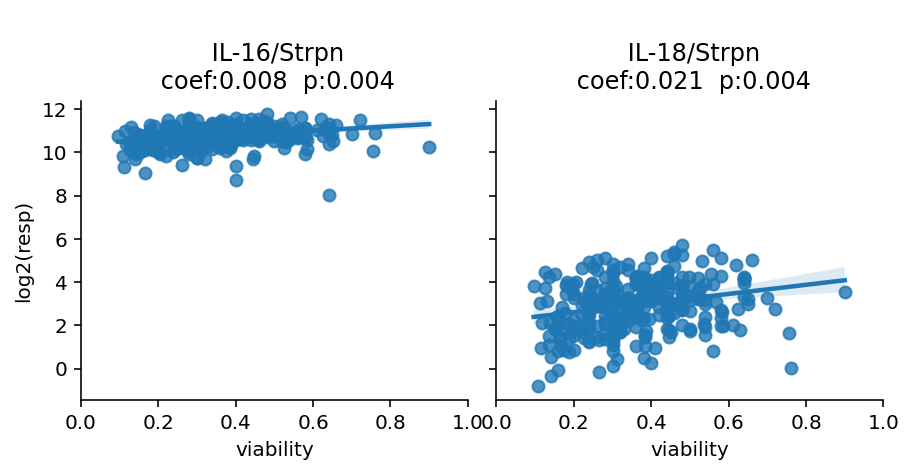

In [595]:

import statsmodels.api as sm

from scipy.stats import pearsonr,spearmanr

viability = pd.read_csv('data/viabilityYr1116_pct.csv',index_col=0)
print(viability.head())

sigPairs = ptDict[(ptDict.pvalue_org<.05/(28*16))].sort_values('pvalue').index
X = datapanel_raw_log.loc[:,sigPairs]
via_11 = viability.loc[:,'11']
via_11.name = 'viability'



X_via = X.join(via_11).reset_index(drop=False)
X_vialong = X_via.melt(id_vars=['number','viability'],value_name='log2(resp)',var_name='cyto')
X_vialong['pair']= X_vialong.cyto.apply(lambda x: x[0]+'/'+x[1])
temp = ptDict.applymap(lambda x: '{0:.3f}'.format(x))



g = sns.FacetGrid(X_vialong, col="pair",col_wrap=5,sharey=True)
g = (g.map(sns.regplot,'viability','log2(resp)',robust=True).set_titles("{col_name}").set(xlim=(0,1)))

_=[ax.set_title('\n '+ax.get_title() + '\n coef:' + str(temp.loc[tuple(ax.get_title().split('/')),'coef']) + \
                                '  p:' + str(temp.loc[tuple(ax.get_title().split('/')),'pvalue']))  for ax in g.axes]

# savefig(OutputDir + 'Cytokine_Viability_AllSigpairs_bonf.pdf',bbox_inches='tight')

             11     13/16
number                   
11003   0.22000  0.400000
11005   0.50000       NaN
11011   0.07554  0.203540
11024   0.58000  0.195783
11028   0.13600  0.200000


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/reshape/merge.py:648: UserWarning: merging between different levels can give an unintended result (2 levels on the left,1 on the right)
  warnings.warn(msg, UserWarning)


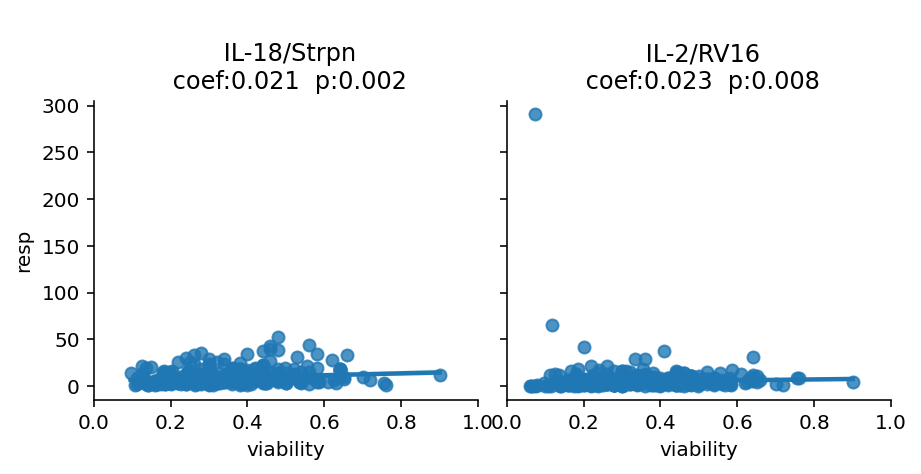

In [585]:

import statsmodels.api as sm

from scipy.stats import pearsonr,spearmanr

viability = pd.read_csv('data/viabilityYr1116_pct.csv',index_col=0)
print(viability.head())

sigPairs = ptDict[(ptDict.pvalue_org<.05/(28*16)) & (ptDict.coef>.01)].sort_values('pvalue').index
X = datapanel_raw.loc[:,sigPairs]
via_11 = viability.loc[:,'11']
via_11.name = 'viability'



X_via = X.join(via_11).reset_index(drop=False)
X_vialong = X_via.melt(id_vars=['number','viability'],value_name='resp',var_name='cyto')
X_vialong['pair']= X_vialong.cyto.apply(lambda x: x[0]+'/'+x[1])
temp = ptDict.applymap(lambda x: '{0:.3f}'.format(x))



g = sns.FacetGrid(X_vialong, col="pair",col_wrap=5,sharey=True)
g = (g.map(sns.regplot,'viability','resp',robust=True).set_titles("{col_name}").set(xlim=(0,1)))

_=[ax.set_title('\n '+ax.get_title() + '\n coef:' + str(temp.loc[tuple(ax.get_title().split('/')),'coef']) + \
                                '  p:' + str(temp.loc[tuple(ax.get_title().split('/')),'pvalue']))  for ax in g.axes]

# savefig(OutputDir + 'Cytokine_Viability_AllSigpairs_bonf.pdf',bbox_inches='tight')

In [607]:

via_11 = viability.loc[:,'11']
via_11.name = 'viability'

via_batch = sampleID.loc[idYr11,['Batch']].join(via_11,how='left')

x = via_batch.copy()

x.loc[:,'Batch'] = 2-x['Batch']
x.loc[:,'viability'] = x.loc[:,'viability']-x.loc[:,'viability'].dropna().mean()

X = datapanel_raw_log.copy()
x.drop('Batch',inplace=True, axis=1)


resp = X.loc[:,('IL-16','Strpn')]

y = resp.dropna()
x2 = sm.add_constant(x.loc[y.index,:])
est = sm.OLS(y, x2)
# est = sm.RLM(y, x2, M=sm.robust.norms.HuberT())
est2 = est.fit()

est2.summary2()

<class 'statsmodels.iolib.summary2.Summary'>
"""
                  Results: Ordinary least squares
===================================================================
Model:              OLS                Adj. R-squared:     0.056   
Dependent Variable: ('IL-16', 'Strpn') AIC:                405.6585
Date:               2021-06-29 22:43   BIC:                413.0189
No. Observations:   293                Log-Likelihood:     -200.83 
Df Model:           1                  F-statistic:        18.47   
Df Residuals:       291                Prob (F-statistic): 2.36e-05
R-squared:          0.060              Scale:              0.23219 
--------------------------------------------------------------------
                Coef.   Std.Err.     t      P>|t|    [0.025   0.975]
--------------------------------------------------------------------
const          10.7252    0.0282  380.4565  0.0000  10.6697  10.7807
viability       0.8487    0.1975    4.2972  0.0000   0.4600   1.2374
-------------------------------------------------------------------
Omnibus:               97.269       Durbin-Watson:          1.834  
Prob(Omnibus):         0.000        Jarque-Bera (JB):       404.992
Skew:                  -1.343       Prob(JB):               0.000  
Kurtosis:              8.095        Condition No.:          7      
===================================================================

"""

In [608]:

via_11 = viability.loc[:,'11']
via_11.name = 'viability'

via_batch = sampleID.loc[idYr11,['Batch']].join(via_11,how='left')

x = via_batch.copy()

x.loc[:,'Batch'] = 2-x['Batch']
x.loc[:,'viability'] = x.loc[:,'viability']-x.loc[:,'viability'].dropna().mean()

X = datapanel_raw_log.copy()



resp = X.loc[:,('IL-16','Strpn')]

y = resp.dropna()
x2 = sm.add_constant(x.loc[y.index,:])
est = sm.OLS(y, x2)
# est = sm.RLM(y, x2, M=sm.robust.norms.HuberT())
est2 = est.fit()

est2.summary2()

<class 'statsmodels.iolib.summary2.Summary'>
"""
                  Results: Ordinary least squares
===================================================================
Model:              OLS                Adj. R-squared:     0.116   
Dependent Variable: ('IL-16', 'Strpn') AIC:                387.4632
Date:               2021-06-29 22:43   BIC:                398.5037
No. Observations:   293                Log-Likelihood:     -190.73 
Df Model:           2                  F-statistic:        20.20   
Df Residuals:       290                Prob (F-statistic): 6.10e-09
R-squared:          0.122              Scale:              0.21748 
--------------------------------------------------------------------
                Coef.   Std.Err.     t      P>|t|    [0.025   0.975]
--------------------------------------------------------------------
const          10.7808    0.0299  360.5660  0.0000  10.7220  10.8397
Batch          -0.3321    0.0730   -4.5490  0.0000  -0.4758  -0.1884
viability       0.8345    0.1912    4.3650  0.0000   0.4582   1.2107
-------------------------------------------------------------------
Omnibus:               96.884       Durbin-Watson:          1.934  
Prob(Omnibus):         0.000        Jarque-Bera (JB):       471.269
Skew:                  -1.278       Prob(JB):               0.000  
Kurtosis:              8.663        Condition No.:          7      
===================================================================

"""

In [ ]:

import statsmodels.api as sm

from scipy.stats import pearsonr,spearmanr

viability = pd.read_csv('data/viabilityYr1116_pct.csv',index_col=0)
print(viability.head())

sigPairs = ptDict[(ptDict.pvalue<.05)].sort_values('pvalue').index # & (ptDict.coef>.01)
X = datapanel_raw_log.loc[:,sigPairs]
via_11 = viability.loc[:,'11']
via_11.name = 'viability'



X_via = X.join(via_11).reset_index(drop=False)
X_vialong = X_via.melt(id_vars=['number','viability'],value_name='resp',var_name='cyto')
X_vialong['pair']= X_vialong.cyto.apply(lambda x: x[0]+'/'+x[1])
temp = ptDict.applymap(lambda x: '{0:.3f}'.format(x))



g = sns.FacetGrid(X_vialong, col="pair",col_wrap=5,sharey=True)
g = (g.map(sns.regplot,'viability','resp',robust=False).set_titles("{col_name}").set(xlim=(0,1)))

_=[ax.set_title('\n '+ax.get_title() + '\n coef:' + str(temp.loc[tuple(ax.get_title().split('/')),'coef']) + \
                                '  p:' + str(temp.loc[tuple(ax.get_title().split('/')),'pvalue']))  for ax in g.axes]

savefig(OutputDir + 'Cytokine_Viability_All.pdf',bbox_inches='tight')

In [574]:
X = datapanel_raw_log.copy()
via_11 = viability.loc[:,'11']
via_11.name = 'viability'

ptDict = OrderedDict()
for c, resp  in X.items():
    p,t = pearsonr(resp.dropna(),via_11.loc[resp.dropna().index])
#     p,t = spearmanr(resp,via_11.loc[resp.index],nan_policy='omit', axis=0)
    ptDict[c] = (p,t)

ptDict= pd.DataFrame(ptDict).T.astype('float')
ptDict.columns = ['corr','pvalue']


/opt/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:3913: PearsonRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(PearsonRConstantInputWarning())


In [578]:
ptDict[ptDict.pvalue< 0.05/(28*16)]

,,corr,pvalue
IL-16,Strpn,0.244274,0.000024
IL-18,Strpn,0.245845,0.000021


             11     13/16
number                   
11003   0.22000  0.400000
11005   0.50000       NaN
11011   0.07554  0.203540
11024   0.58000  0.195783
11028   0.13600  0.200000


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/reshape/merge.py:648: UserWarning: merging between different levels can give an unintended result (2 levels on the left,1 on the right)
  warnings.warn(msg, UserWarning)


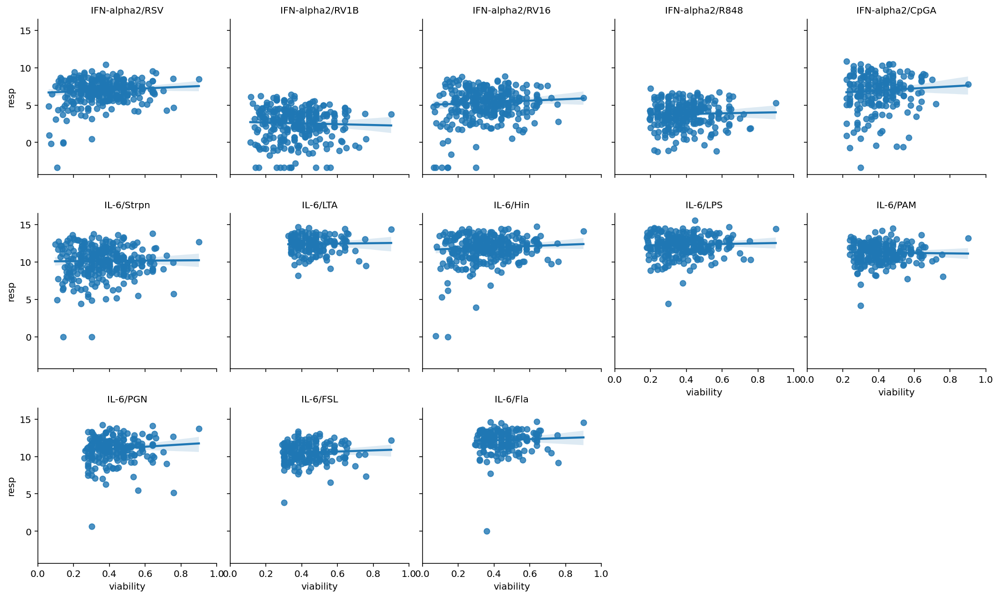

In [571]:

import statsmodels.api as sm

from scipy.stats import pearsonr,spearmanr

viability = pd.read_csv('data/viabilityYr1116_pct.csv',index_col=0)
print(viability.head())


bac = ['Strpn','LTA','Hin','LPS','PAM','PGN','FSL','Fla']

vir = ['RSV','RV1B','RV16','R848']

IFNa2vir = [('IFN-alpha2',i) for i in vir]

IL6vac = [('IL-6',i ) for i in bac]

X = datapanel_raw_log[IFNa2vir+IL6vac]

via_11 = viability.loc[:,'11']
via_11.name = 'viability'

# ptDict = OrderedDict()
# for c, resp  in X.items():
#     p,t = pearsonr(resp.dropna(),via_11.loc[resp.dropna().index])
# #     p,t = spearmanr(resp,via_11.loc[resp.index],nan_policy='omit', axis=0)
#     ptDict[c] = (p，t)

# ptDict= pd.DataFrame(ptDict).T.astype('float')
# ptDict.columns = ['corr','pvalue']


X_via = X.join(via_11).reset_index(drop=False)
X_vialong = X_via.melt(id_vars=['number','viability'],value_name='resp',var_name='cyto')
X_vialong['pair']= X_vialong.cyto.apply(lambda x: x[0]+'/'+x[1])
temp = ptDict.applymap(lambda x: '{0:.3f}'.format(x))



g = sns.FacetGrid(X_vialong, col="pair",col_wrap=5,sharey=True)
g = (g.map(sns.regplot,'viability','resp',robust=True).set_titles("{col_name}").set(xlim=(0,1)))

# _=[ax.set_title('\n '+ax.get_title() + '\n corr:' + str(temp.loc[tuple(ax.get_title().split('/')),'corr']) + \
#                                 '  p:' + str(temp.loc[tuple(ax.get_title().split('/')),'pvalue']))  for ax in g.axes]

# savefig(OutputDir + 'Cytokine_Viability_pairsSubsect.pdf',bbox_inches='tight')

In [631]:
sns.FacetGrid?

             11     13/16
number                   
11003   0.22000  0.400000
11005   0.50000       NaN
11011   0.07554  0.203540
11024   0.58000  0.195783
11028   0.13600  0.200000


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/reshape/merge.py:648: UserWarning: merging between different levels can give an unintended result (2 levels on the left,1 on the right)
  warnings.warn(msg, UserWarning)


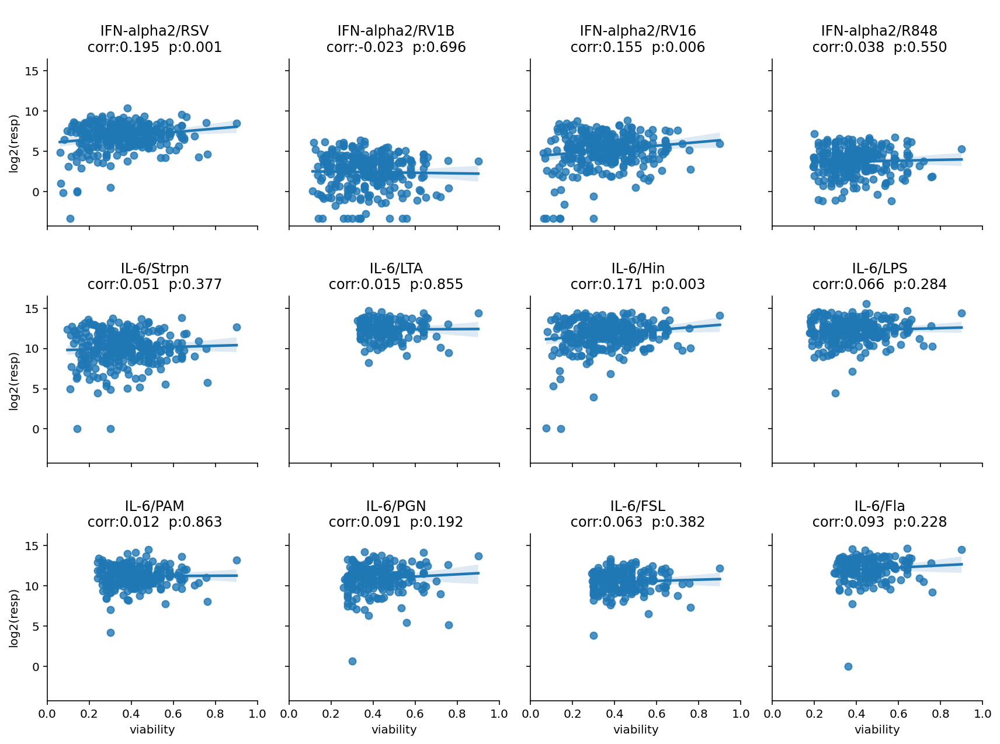

In [632]:

import statsmodels.api as sm

from scipy.stats import pearsonr,spearmanr

viability = pd.read_csv('data/viabilityYr1116_pct.csv',index_col=0)
print(viability.head())


bac = ['Strpn','LTA','Hin','LPS','PAM','PGN','FSL','Fla']

vir = ['RSV','RV1B','RV16','R848']

IFNa2vir = [('IFN-alpha2',i) for i in vir]

IL6vac = [('IL-6',i ) for i in bac]

X = datapanel_raw_log[IFNa2vir+IL6vac]

via_11 = viability.loc[:,'11']
via_11.name = 'viability'

ptDict = OrderedDict()
for c, resp  in X.items():
    r,p = pearsonr(resp.dropna(),via_11.loc[resp.dropna().index])
#     r,p = spearmanr(resp,via_11.loc[resp.index],nan_policy='omit', axis=0)
    ptDict[c] = (r,p)

ptDict= pd.DataFrame(ptDict).T.astype('float')
ptDict.columns = ['corr','pvalue']


X_via = X.join(via_11).reset_index(drop=False)
X_vialong = X_via.melt(id_vars=['number','viability'],value_name='log2(resp)',var_name='cyto')
X_vialong['pair']= X_vialong.cyto.apply(lambda x: x[0]+'/'+x[1])
temp = ptDict.applymap(lambda x: '{0:.3f}'.format(x))



g = sns.FacetGrid(X_vialong, col="pair",col_wrap=4,sharey=True)
g = (g.map(sns.regplot,'viability','log2(resp)',robust=False).set_titles("{col_name}").set(xlim=(0,1)))

_=[ax.set_title('\n '+ax.get_title() + '\n corr:' + str(temp.loc[tuple(ax.get_title().split('/')),'corr']) + \
                                '  p:' + str(temp.loc[tuple(ax.get_title().split('/')),'pvalue']))  for ax in g.axes]
g.fig.tight_layout()
savefig(OutputDir + 'Cytokine_Viability_pairsSubsect_pearsonCorr.pdf',bbox_inches='tight')


             11     13/16
number                   
11003   0.22000  0.400000
11005   0.50000       NaN
11011   0.07554  0.203540
11024   0.58000  0.195783
11028   0.13600  0.200000


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/reshape/merge.py:648: UserWarning: merging between different levels can give an unintended result (2 levels on the left,1 on the right)
  warnings.warn(msg, UserWarning)


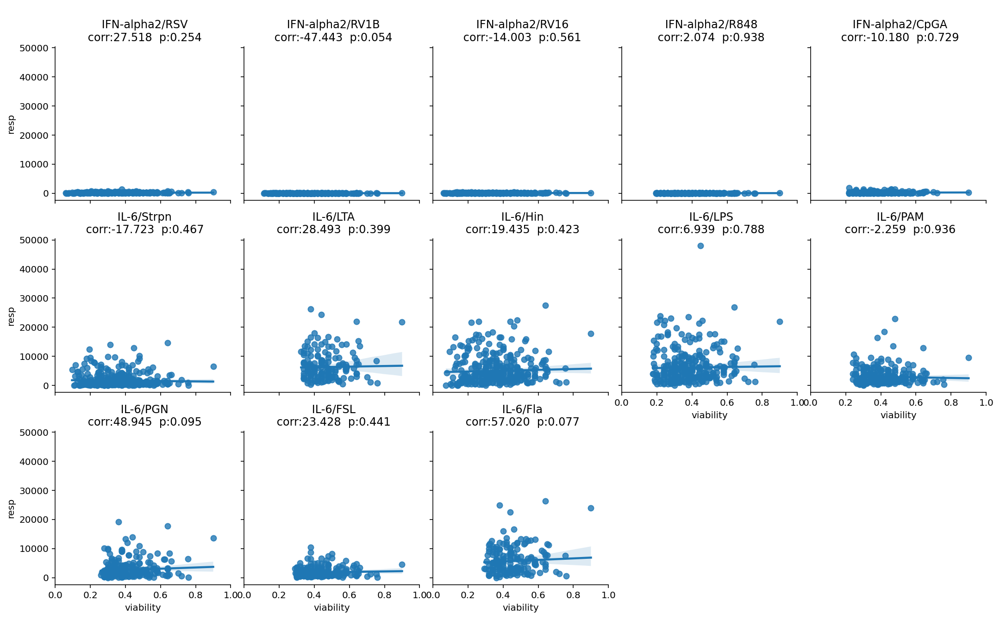

In [543]:

import statsmodels.api as sm

from scipy.stats import pearsonr,spearmanr

viability = pd.read_csv('data/viabilityYr1116_pct.csv',index_col=0)
print(viability.head())


bac = ['Strpn','LTA','Hin','LPS','PAM','PGN','FSL','Fla']

vir = ['RSV','RV1B','RV16','R848','CpGA']

IFNa2vir = [('IFN-alpha2',i) for i in vir]

IL6vac = [('IL-6',i ) for i in bac]

X = datapanel_raw_log[IFNa2vir+IL6vac]

via_11 = viability.loc[:,'11']
via_11.name = 'viability'

ptDict = OrderedDict()
for c, resp  in X.items():
    p,t = pearsonr(resp.dropna(),via_11.loc[resp.dropna().index])
#     p,t = spearmanr(resp,via_11.loc[resp.index],nan_policy='omit', axis=0)
    ptDict[c] = (p*15*28,t)

ptDict= pd.DataFrame(ptDict).T.astype('float')
ptDict.columns = ['corr','pvalue']


X_via = X.join(via_11).reset_index(drop=False)
X_vialong = X_via.melt(id_vars=['number','viability'],value_name='resp',var_name='cyto')
X_vialong['pair']= X_vialong.cyto.apply(lambda x: x[0]+'/'+x[1])
temp = ptDict.applymap(lambda x: '{0:.3f}'.format(x))



g = sns.FacetGrid(X_vialong, col="pair",col_wrap=5,sharey=True)
g = (g.map(sns.regplot,'viability','resp',robust=True).set_titles("{col_name}").set(xlim=(0,1)))

_=[ax.set_title('\n '+ax.get_title() + '\n corr:' + str(temp.loc[tuple(ax.get_title().split('/')),'corr']) + \
                                '  p:' + str(temp.loc[tuple(ax.get_title().split('/')),'pvalue']))  for ax in g.axes]

# savefig(OutputDir + 'Cytokine_Viability_pairsSubsect.pdf',bbox_inches='tight')

In [610]:
import numpy as np
from scipy import stats

def pearsonr_ci(x,y,alpha=0.05):
    ''' calculate Pearson correlation along with the confidence interval using scipy and numpy
    Parameters
    ----------
    x, y : iterable object such as a list or np.array
      Input for correlation calculation
    alpha : float
      Significance level. 0.05 by default
    Returns
    -------
    r : float
      Pearson's correlation coefficient
    pval : float
      The corresponding p value
    lo, hi : float
      The lower and upper bound of confidence intervals
    '''

    r, p = stats.pearsonr(x,y)
    r_z = np.arctanh(r)
    se = 1/np.sqrt(x.size-3)
    z = stats.norm.ppf(1-alpha/2)
    lo_z, hi_z = r_z-z*se, r_z+z*se
    lo, hi = np.tanh((lo_z, hi_z))
    return r, p, lo, hi

             11     13/16
number                   
11003   0.22000  0.400000
11005   0.50000       NaN
11011   0.07554  0.203540
11024   0.58000  0.195783
11028   0.13600  0.200000
0.24427386819893637 2.361555864949544e-05 0.13342088094477045 0.34909011385604644
0.24584530646102332 2.0839650288384608e-05 0.13506259227118636 0.35055735894530987


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/reshape/merge.py:648: UserWarning: merging between different levels can give an unintended result (2 levels on the left,1 on the right)
  warnings.warn(msg, UserWarning)


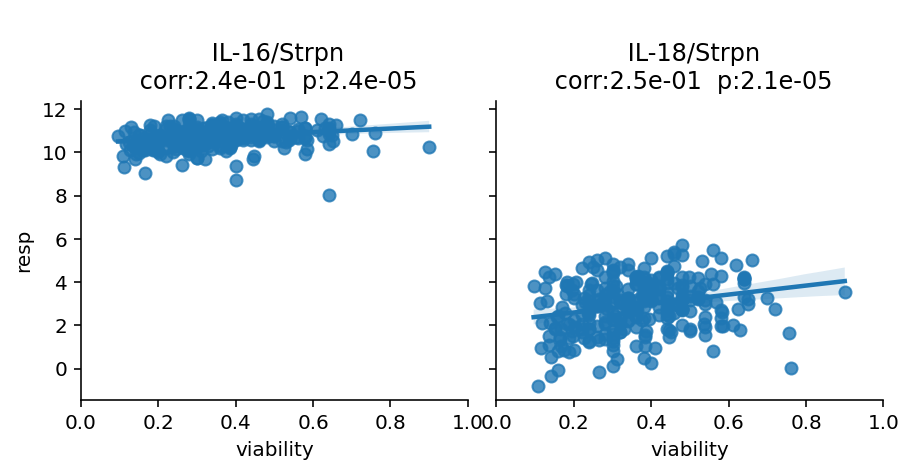

In [620]:


import statsmodels.api as sm

from scipy.stats import pearsonr,spearmanr

viability = pd.read_csv('data/viabilityYr1116_pct.csv',index_col=0)
print(viability.head())

stim = ['Strpn' ]


pair1 = [('IL-16',i) for i in stim]

pair2 = [('IL-18',i ) for i in stim]

X = datapanel_raw_log[pair1+pair2]

via_11 = viability.loc[:,'11']
via_11.name = 'viability'

ptDict = OrderedDict()
for c, resp  in X.items():
    p,t = pearsonr(resp.dropna(),via_11.loc[resp.dropna().index])
#     p,t = spearmanr(resp,via_11.loc[resp.index],nan_policy='omit', axis=0)
    ptDict[c] = (p,t)
    (r, p, lo, hi )= pearsonr_ci(resp.dropna(),via_11.loc[resp.dropna().index],alpha=0.05)

    print(r, p, lo, hi )
ptDict= pd.DataFrame(ptDict).T.astype('float')
ptDict.columns = ['corr','pvalue']


X_via = X.join(via_11).reset_index(drop=False)
X_vialong = X_via.melt(id_vars=['number','viability'],value_name='resp',var_name='cyto')
X_vialong['pair']= X_vialong.cyto.apply(lambda x: x[0]+'/'+x[1])
temp = ptDict.applymap(lambda x: '{0:.1e}'.format(x))



g = sns.FacetGrid(X_vialong, col="pair",col_wrap=5,sharey=True)
g = (g.map(sns.regplot,'viability','resp',robust=False).set_titles("{col_name}").set(xlim=(0,1)))

_=[ax.set_title('\n '+ax.get_title() + '\n corr:' + str(temp.loc[tuple(ax.get_title().split('/')),'corr']) + \
                                '  p:' + str(temp.loc[tuple(ax.get_title().split('/')),'pvalue']))  for ax in g.axes]


             11     13/16
number                   
11003   0.22000  0.400000
11005   0.50000       NaN
11011   0.07554  0.203540
11024   0.58000  0.195783
11028   0.13600  0.200000


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/reshape/merge.py:648: UserWarning: merging between different levels can give an unintended result (2 levels on the left,1 on the right)
  warnings.warn(msg, UserWarning)


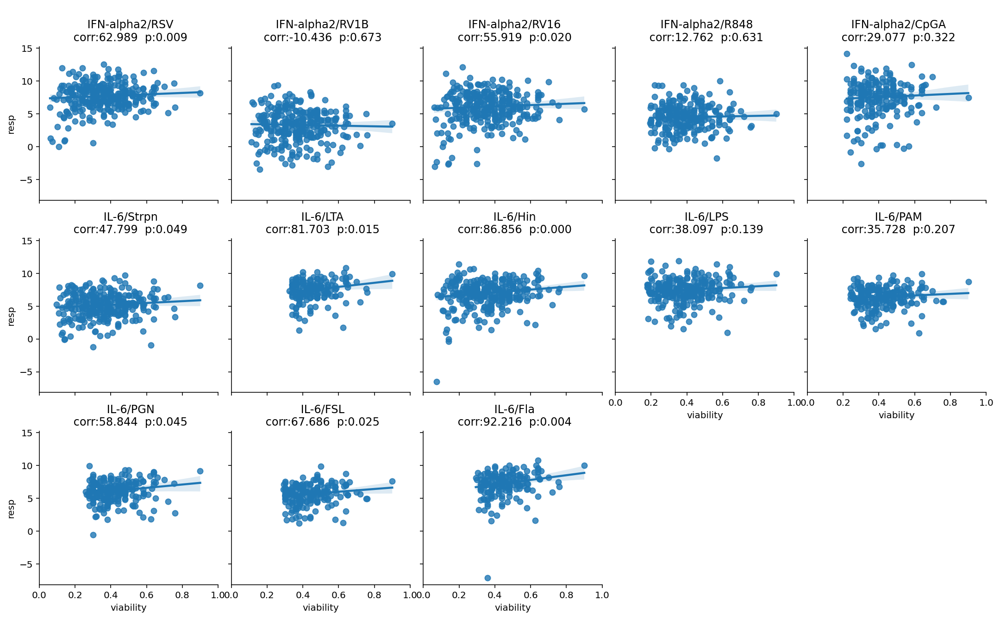

In [542]:

import statsmodels.api as sm

from scipy.stats import pearsonr,spearmanr

viability = pd.read_csv('data/viabilityYr1116_pct.csv',index_col=0)
print(viability.head())


bac = ['Strpn','LTA','Hin','LPS','PAM','PGN','FSL','Fla']

vir = ['RSV','RV1B','RV16','R848','CpGA']

IFNa2vir = [('IFN-alpha2',i) for i in vir]

IL6vac = [('IL-6',i ) for i in bac]

X = datapanel_raw_nrm[IFNa2vir+IL6vac]

via_11 = viability.loc[:,'11']
via_11.name = 'viability'

ptDict = OrderedDict()
for c, resp  in X.items():
    p,t = pearsonr(resp.dropna(),via_11.loc[resp.dropna().index])
#     p,t = spearmanr(resp,via_11.loc[resp.index],nan_policy='omit', axis=0)
    ptDict[c] = (p*15*28,t)

ptDict= pd.DataFrame(ptDict).T.astype('float')
ptDict.columns = ['corr','pvalue']


X_via = X.join(via_11).reset_index(drop=False)
X_vialong = X_via.melt(id_vars=['number','viability'],value_name='resp',var_name='cyto')
X_vialong['pair']= X_vialong.cyto.apply(lambda x: x[0]+'/'+x[1])
temp = ptDict.applymap(lambda x: '{0:.3f}'.format(x))



g = sns.FacetGrid(X_vialong, col="pair",col_wrap=5,sharey=True)
g = (g.map(sns.regplot,'viability','resp',robust=True).set_titles("{col_name}").set(xlim=(0,1)))

_=[ax.set_title('\n '+ax.get_title() + '\n corr:' + str(temp.loc[tuple(ax.get_title().split('/')),'corr']) + \
                                '  p:' + str(temp.loc[tuple(ax.get_title().split('/')),'pvalue']))  for ax in g.axes]

# savefig(OutputDir + 'Cytokine_Viability_pairsSubsect.pdf',bbox_inches='tight')

             11     13/16
number                   
11003   0.22000  0.400000
11005   0.50000       NaN
11011   0.07554  0.203540
11024   0.58000  0.195783
11028   0.13600  0.200000


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/reshape/merge.py:648: UserWarning: merging between different levels can give an unintended result (2 levels on the left,1 on the right)
  warnings.warn(msg, UserWarning)


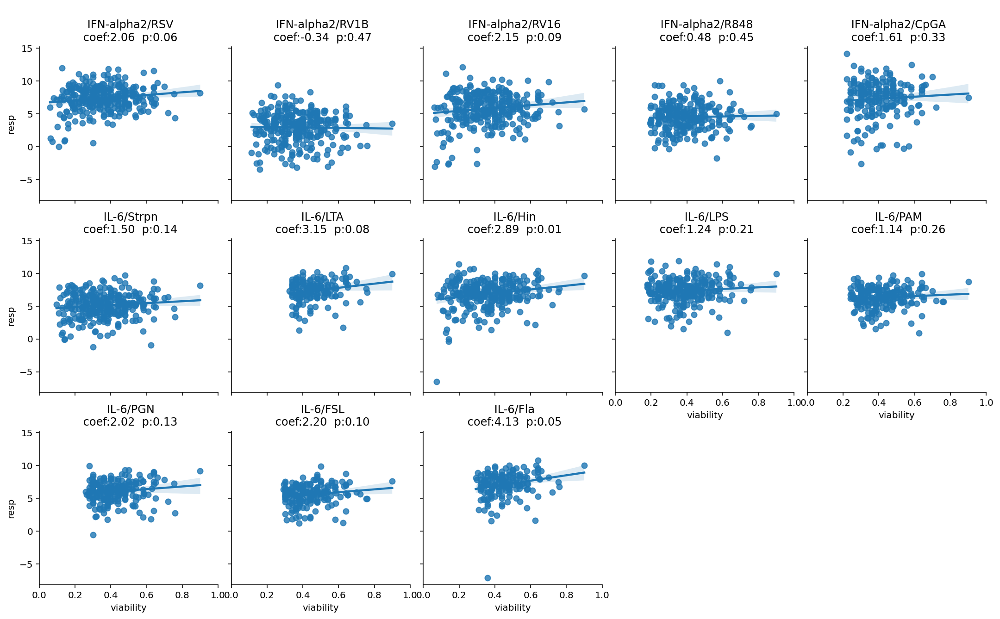

In [345]:
from scipy.stats import pearsonr,spearmanr

viability = pd.read_csv('data/viabilityYr1116_pct.csv',index_col=0)
print(viability.head())


bac = ['Strpn','LTA','Hin','LPS','PAM','PGN','FSL','Fla']

vir = ['RSV','RV1B','RV16','R848','CpGA']

IFNa2vir = [('IFN-alpha2',i) for i in vir]

IL6vac = [('IL-6',i ) for i in bac]

X = datapanel_raw_nrm[IFNa2vir+IL6vac]

via_11 = viability.loc[:,'11']
via_11.name = 'viability'

 
X_via = X.join(via_11).reset_index(drop=False)


    
    
    
X_vialong = X_via.melt(id_vars=['number','viability'],value_name='resp',var_name='cyto')
X_vialong['pair']= X_vialong.cyto.apply(lambda x: x[0]+'/'+x[1])
temp = ptDict.applymap(lambda x: '{0:.2f}'.format(x))



g = sns.FacetGrid(X_vialong, col="pair",col_wrap=5,sharey=True)
g = (g.map(sns.regplot,'viability','resp',robust=False).set_titles("{col_name}").set(xlim=(0,1)))

_=[ax.set_title('\n '+ax.get_title() + '\n coef:' + str(temp.loc[tuple(ax.get_title().split('/')),'corr']) + \
                                '  p:' + str(temp.loc[tuple(ax.get_title().split('/')),'pvalue']))  for ax in g.axes]

# savefig(OutputDir + 'Cytokine_Viability_pairsSubsect.pdf',bbox_inches='tight')

# Viability vs expression (<25% vs > 25%)

In [511]:
X = datapanel_raw_log.copy()

via_11 = viability.loc[:,'11']
via_11.name = 'viability'

 
X_via = X.join(via_11)


 

ptDict = OrderedDict()

via_batch = sampleID.loc[idYr11,['Batch']].join(via_11,how='left')

x = via_batch.copy()
x.loc[:,'Batch'] = 2-x['Batch']
x.loc[:,'viability'] = (x.loc[:,'viability']>.25) *1
for c,resp in X_via.drop(['viability'],axis=1).iteritems():
    y = resp.dropna()
    x2 = sm.add_constant(x.loc[y.index,:])
#     est = sm.OLS(y, x2)
    est = sm.RLM(y, x2, M=sm.robust.norms.HuberT())
    est2 = est.fit()
    p = est2.pvalues['viability']
#     p_const = est2.pvalues['const']
    corr = est2.params['viability']
    
#     corr_const = est2.params['const']
    ptDict[c] = (p,corr)
    

ptDict= pd.DataFrame(ptDict).T.astype('float')
ptDict.columns = ['pvalue_org','coef']


/opt/anaconda3/lib/python3.8/site-packages/pandas/core/reshape/merge.py:648: UserWarning: merging between different levels can give an unintended result (2 levels on the left,1 on the right)
  warnings.warn(msg, UserWarning)
/opt/anaconda3/lib/python3.8/site-packages/statsmodels/robust/robust_linear_model.py:287: ConvergenceWarning: Estimated scale is 0.0 indicating that the most last iteration produced a perfect fit of the weighted data.
  warnings.warn('Estimated scale is 0.0 indicating that the most'
/opt/anaconda3/lib/python3.8/site-packages/statsmodels/robust/robust_linear_model.py:287: ConvergenceWarning: Estimated scale is 0.0 indicating that the most last iteration produced a perfect fit of the weighted data.
  warnings.warn('Estimated scale is 0.0 indicating that the most'
/opt/anaconda3/lib/python3.8/site-packages/statsmodels/robust/robust_linear_model.py:287: ConvergenceWarning: Estimated scale is 0.0 indicating that the most last iteration produced a perfect fit of the weig

In [514]:
import qvalue_py3 as qvalue

ptDict['pvalue']= qvalue.estimate(ptDict.pvalue_org)


In [515]:
ptDict.shape

(448, 3)

In [516]:
ptDict[(ptDict.pvalue<.05) &(ptDict.coef>0.01)].sort_values('pvalue')

pvalue_org      coef    pvalue
TARC(CCL17) Fla     0.000000  5.474693  0.000000
IL-16       Fla     0.000000  8.630881  0.000000
            FSL     0.000000  8.628964  0.000000
            PGN     0.000000  8.614134  0.000000
            LTA     0.000000  8.607014  0.000000
...                      ...       ...       ...
IL-4        RV1B    0.019468  0.324639  0.035162
IL-1beta    Hin     0.019885  0.446622  0.035680
IL-2        PHA     0.024610  0.411638  0.043868
TNF         Hin     0.026726  0.338074  0.047330
IL-2        Fla     0.028372  0.196796  0.049921

[124 rows x 3 columns]

In [517]:
pv_org = ptDict[['pvalue_org']].unstack(1)
pv = ptDict[['pvalue']].unstack(1)
coef = ptDict[['coef']].unstack(1)
 


pv_org.columns =pv_org.columns.droplevel(0)
pv.columns =pv.columns.droplevel(0)
coef.columns =coef.columns.droplevel(0)
 

In [518]:
pv_org.applymap(lambda x: '{0:.3f}'.format(x)).loc[cytolabel,stimlabel].to_excel(OutputDir+'pvalue_viability_25pct.xlsx')

In [520]:
pv.applymap(lambda x: '{0:.2f}'.format(x))

,CpGA,FSL,Fla,Hin,LPS,LTA,PAM,PGN,PHA,R848,RSV,RV16,RV1B,Strpn,media,polyIC
Eotaxin-1(CCL11),0.33,0.00,0.00,0.26,0.41,0.00,0.40,0.00,0.16,0.20,0.46,0.07,0.27,0.11,0.15,0.08
Eotaxin-3(CCL26),0.19,0.00,0.00,0.39,0.38,0.00,0.50,0.00,0.46,0.18,0.40,0.47,0.58,0.18,0.38,0.44
IFN-alpha2,0.24,0.00,0.00,0.60,0.02,0.00,0.55,0.00,0.56,0.52,0.09,0.14,0.58,0.55,0.57,0.50
IFN-beta,0.00,0.00,0.00,0.24,0.00,0.00,0.00,0.00,0.49,0.00,0.11,0.00,0.00,0.13,0.00,0.00
IFN-gamma,0.41,0.00,0.00,0.00,0.48,0.00,0.00,0.00,0.26,0.42,0.11,0.10,0.28,0.52,0.60,0.46
IFN-lambda1(IL-29),0.60,0.00,0.00,0.20,0.28,0.00,0.31,0.00,0.55,0.17,0.51,0.05,0.39,0.11,0.35,0.35
IL-10,0.02,0.00,0.00,0.12,0.48,0.00,0.08,0.00,0.54,0.45,0.13,0.38,0.03,0.40,0.20,0.44
IL-12p70,0.30,0.00,0.00,0.00,0.60,0.00,0.00,0.00,0.50,0.28,0.35,0.00,0.33,0.57,0.24,0.13
IL-13,0.43,0.00,0.00,0.31,0.40,0.00,0.01,0.00,0.37,0.40,0.60,0.58,0.01,0.50,0.45,0.26
IL-15,0.51,0.00,0.00,0.24,0.17,0.00,0.40,0.00,0.46,0.54,0.00,0.03,0.60,0.29,0.29,0.25


# RV16

In [284]:
from scipy.stats import pearsonr,spearmanr

viability = pd.read_csv('data/viabilityYr1116_pct.csv',index_col=0)
print(viability.head())



X = datapanel_raw_nrm.xs('RV16'
via_11 = viability.loc[:,'11']
via_11.name = 'viability'

ptDict = OrderedDict()
for c, resp  in X.items():
    p,t = spearmanr(resp,via_11.loc[resp.index],nan_policy='omit', axis=0)
    ptDict[c] = (p,t)

ptDict= pd.DataFrame(ptDict).T.astype('float')
ptDict.columns = ['corr','pvalue']

X_via = X.join(via_11).reset_index(drop=False)
X_vialong = X_via.melt(id_vars=['number','viability'],value_name='resp',var_name='cyto')

temp = ptDict.applymap(lambda x: '{0:.3f}'.format(x))



g = sns.FacetGrid(X_vialong, col="cyto",col_wrap=5,sharey=True,
                  col_order=ptDict.sort_values('pvalue').index.values)
g = (g.map(sns.regplot,'viability','resp').set_titles("{col_name}").set(xlim=(0,1)))

_=[ax.set_title('\n '+ax.get_title() + '\n corr:' + str(temp.loc[ax.get_title(),'corr']) + \
                                '  p:' + str(temp.loc[ax.get_title(),'pvalue']))  for ax in g.axes]

savefig(OutputDir + 'Cytokine_Viability_RV16.pdf',bbox_inches='tight')

             11     13/16
number                   
11003   0.22000  0.400000
11005   0.50000       NaN
11011   0.07554  0.203540
11024   0.58000  0.195783
11028   0.13600  0.200000


## Strongly induced cytokine pairs

In [62]:
meanFold.head()

,RSV,RV1B,RV16,R848,CpGA,Strpn,LTA,Hin,LPS,PHA,PAM,PGN,FSL,Fla
IFN-alpha2,345,21,145,54,511,1,1,1,2,1,1,1,1,1
IFN-beta,6,1,1,1,1,2,1,8,1,1,1,1,1,1
IFN-gamma,22,12,25,8,3,3,5,313,17,240,2,14,2,7
IFN-lambda1(IL-29),1,1,1,1,1,1,1,1,1,1,1,1,1,1
TNF,2,3,4,12,2,9,43,44,37,22,15,32,9,34


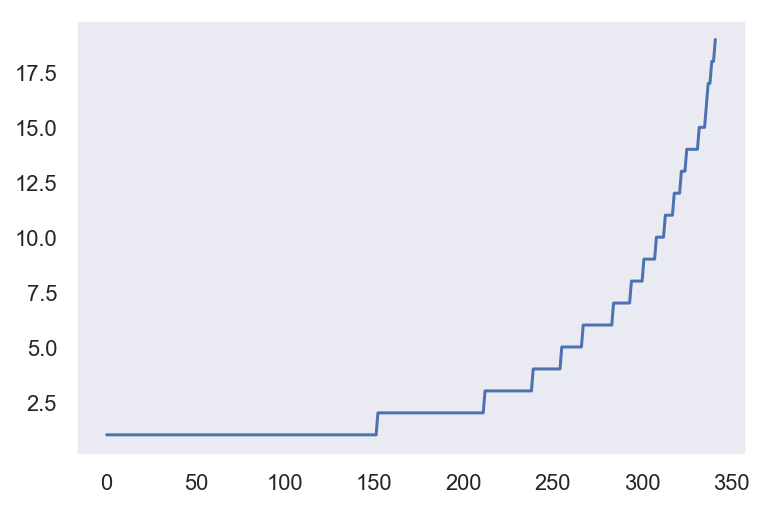

In [63]:
temp = np.sort(meanFold.values.flatten())
plt.plot(temp[temp<20])

In [64]:
datapanel = datapanel_log.copy()
media = datapanel.loc[:,:,'media']
media.to_csv('data/Log2_Media_year11.csv')

Pick strongly induced cytokine-stimulus pairs. Here we define them as mean fold >= eg, 3, 5, 10 etc... 

In [65]:
datapanel = datapanel_nrm.copy()
strong_pairs = (meanFold[meanFold>=3]).unstack().dropna().swaplevel(0,1).index.values
df = datapanel.swapaxes(0,1).to_frame(filter_observations=False)
df_totest = df.loc[strong_pairs].T


In [66]:
df_totest.head()

cytokine,IFN-alpha2,IFN-beta,IFN-gamma,IL-2,IL-6,IL-10,IL-18,IP-10(CXCL10),MIP1beta(CCL4),MCP1(CCL2),...,IL-5,IL-6,IL-8(CXCL8),IL-10,IL-12p70,IL-13,IL-18,IP-10(CXCL10),MIP1beta(CCL4),MDC(CCL22)
stimulus,RSV,RSV,RSV,RSV,RSV,RSV,RSV,RSV,RSV,RSV,...,Fla,Fla,Fla,Fla,Fla,Fla,Fla,Fla,Fla,Fla
number,,,,,,,,,,,,,,,,,,,,,
11003,7.494080,4.004092,0.402666,1.297884,2.221597,2.151456,2.011448,1.980650,1.094190,0.813725,...,0.080195,3.259908,1.489848,3.159593,-0.249128,2.141425,0.809190,1.062966,2.130948,0.919279
11005,5.813034,0.000000,3.728845,2.387229,5.716457,2.226335,2.344734,3.209236,2.116570,1.423242,...,0.708005,7.730481,3.433503,6.137936,1.530113,0.621753,1.982084,2.672831,4.973235,1.668226
11011,4.979445,0.954624,1.589561,-0.041672,6.488763,2.229893,1.995583,1.752232,1.930156,1.252728,...,1.190905,8.912728,3.903566,5.208134,0.716410,3.392318,1.608560,0.545623,4.397933,3.028577
11024,8.861873,0.000000,1.474960,2.109253,3.387503,0.628713,1.361435,4.008209,1.463905,1.196398,...,1.195201,6.335683,1.938586,5.366487,0.713637,3.048054,1.208601,1.727395,4.504773,1.686128
11028,4.528860,0.000000,0.470710,0.000000,6.671425,2.429461,3.015698,2.926570,2.062582,1.887658,...,0.636496,7.283046,3.177970,5.201414,0.433447,1.404493,1.224131,2.395632,4.493974,2.694085


In [73]:
df_totest.columns = df_totest.columns.map('{0[0]}_{0[1]}'.format)
df_totest.to_csv(OutputDir+ 'cyto_stim_pairs_mf3x.csv')  # export for other analysis

df = df.T
df.columns = df.columns.map('{0[0]}_{0[1]}'.format)
df.to_csv(OutputDir+ 'cyto_stim_pairs_all.csv')

In [68]:
df_totest.shape

(307, 180)

In [69]:
# Export PCA projection
from sklearn.decomposition import PCA
X = df_totest.copy()
pca = PCA(n_components=10)
pca.fit(X)
fracs = pca.explained_variance_ratio_
fracsCum = np.cumsum(fracs)
X_red = pca.fit_transform(X) # n_samples, n_redim
X_red = pd.DataFrame(X_red,index=X.index,columns=['pc'+str(i) for i in range(1,X_red.shape[1]+1)])
varExp = pd.DataFrame([fracs,fracsCum],index=['var','varCum'],columns=['pc'+str(i) for i in range(1,X_red.shape[1]+1)])
Wt = pca.components_  # n_redim, n_features
Wt = pd.DataFrame(Wt,index=X_red.columns,columns=X.columns)

X_red.iloc[:,0:26].to_csv(OutputDir+ 'Strong5xPCA90pc.csv')

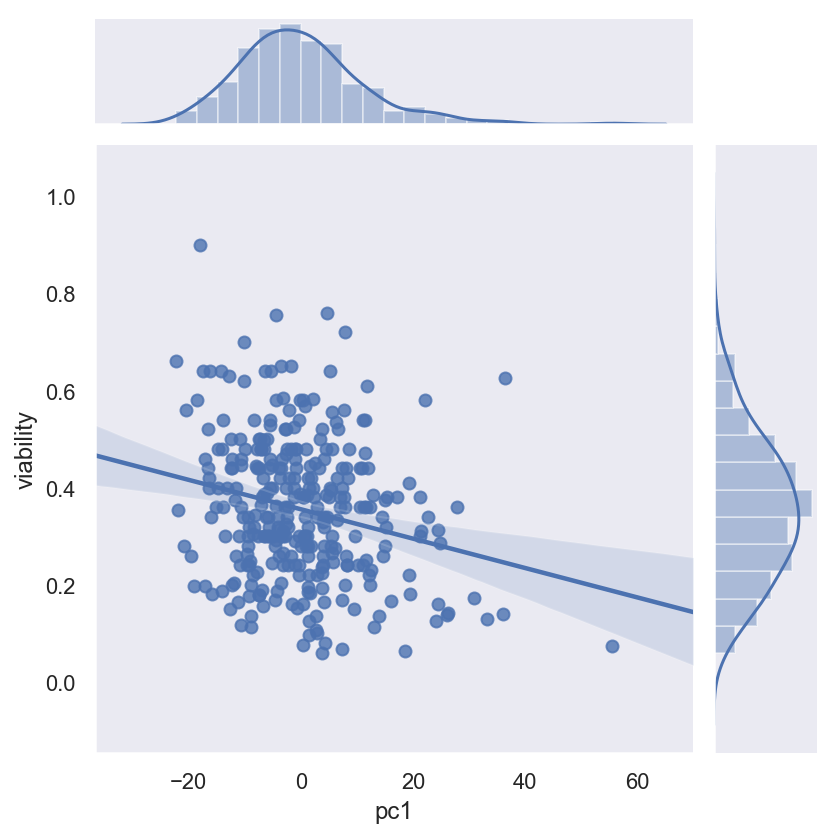

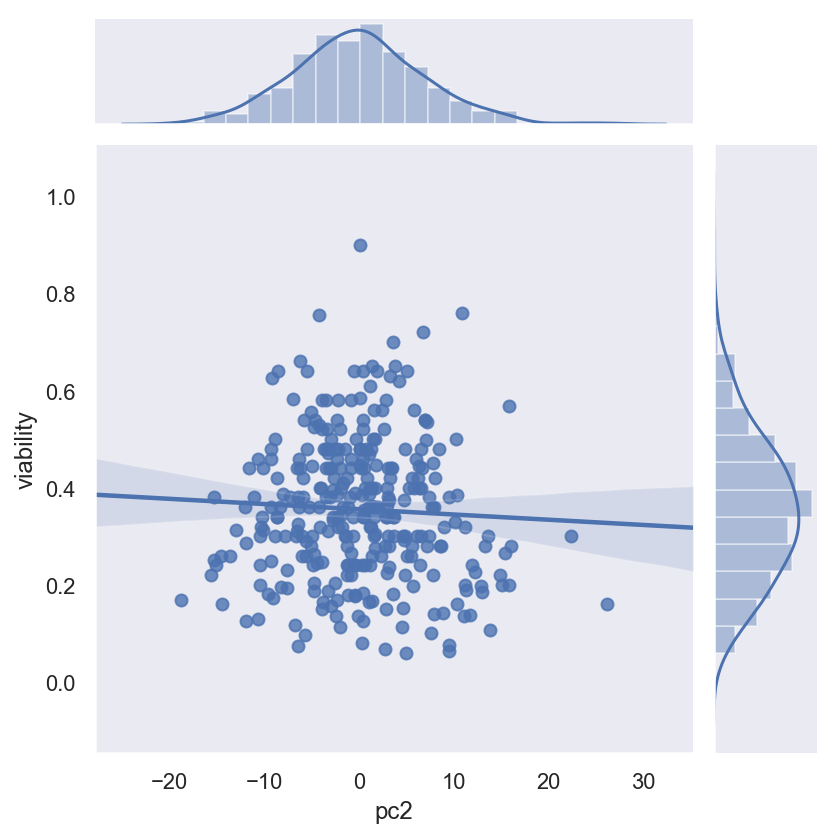

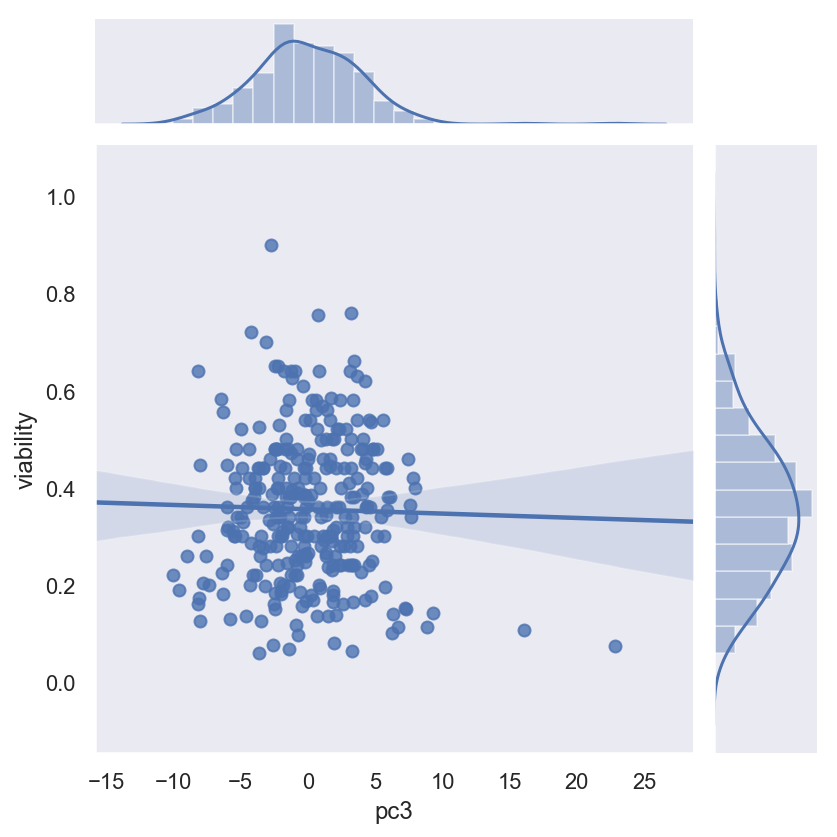

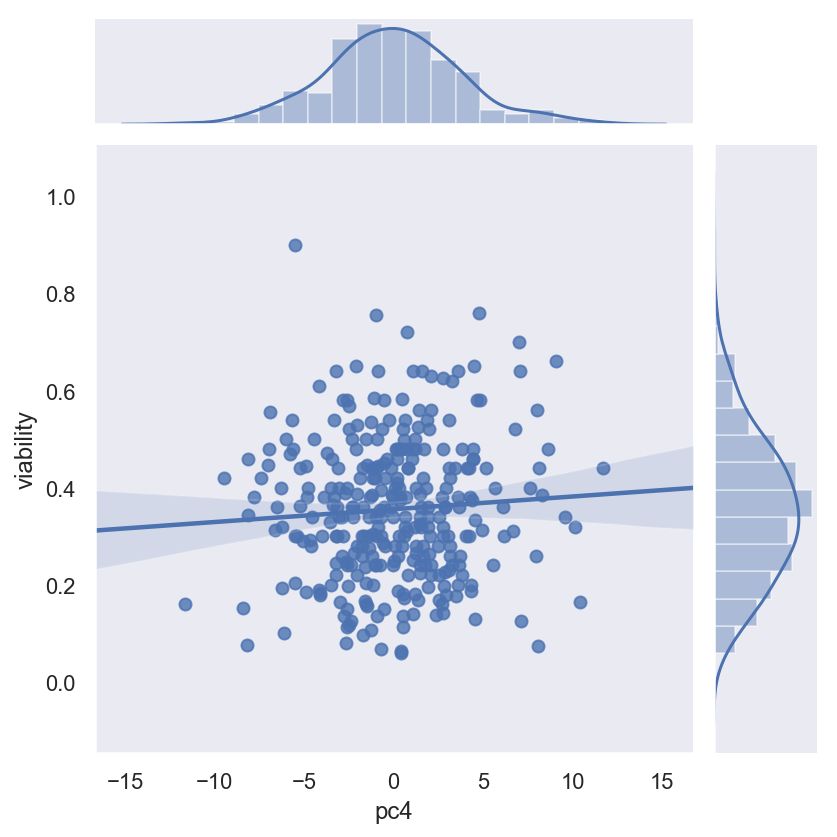

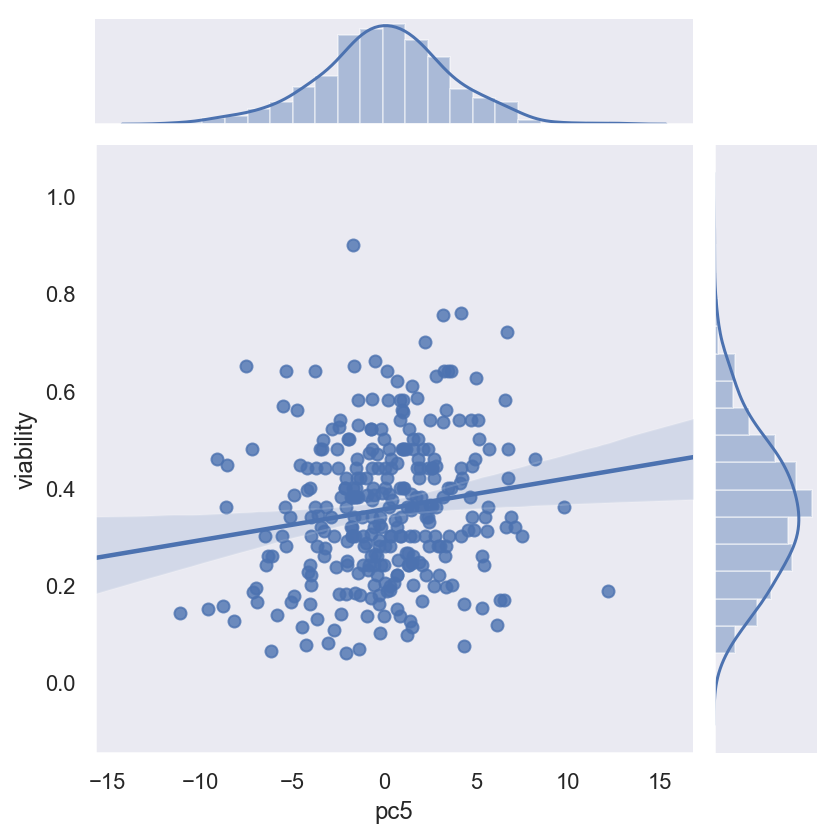

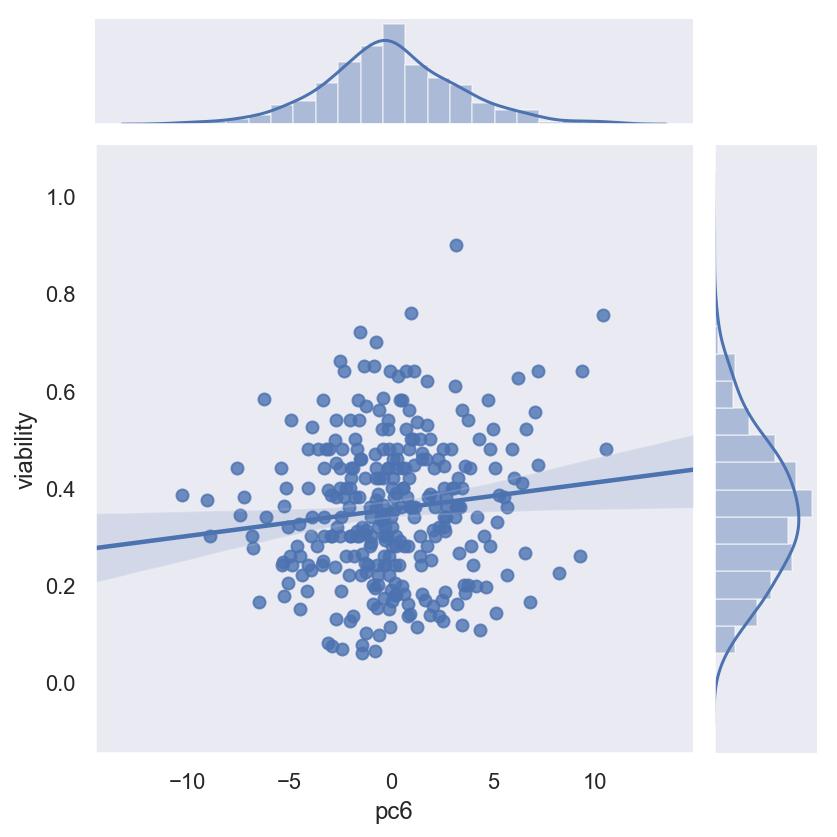

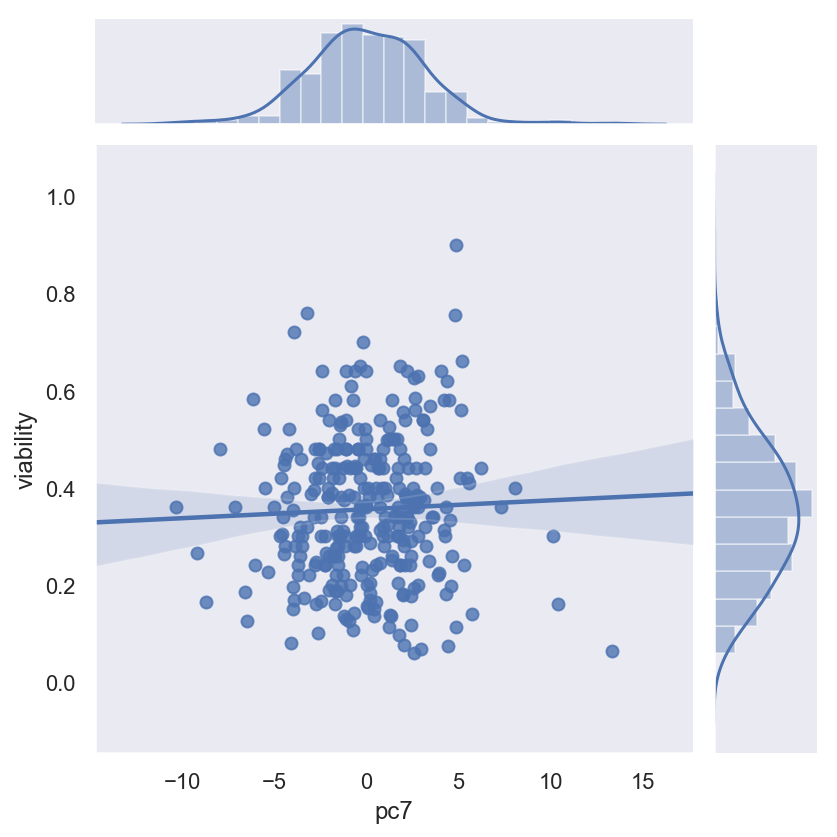

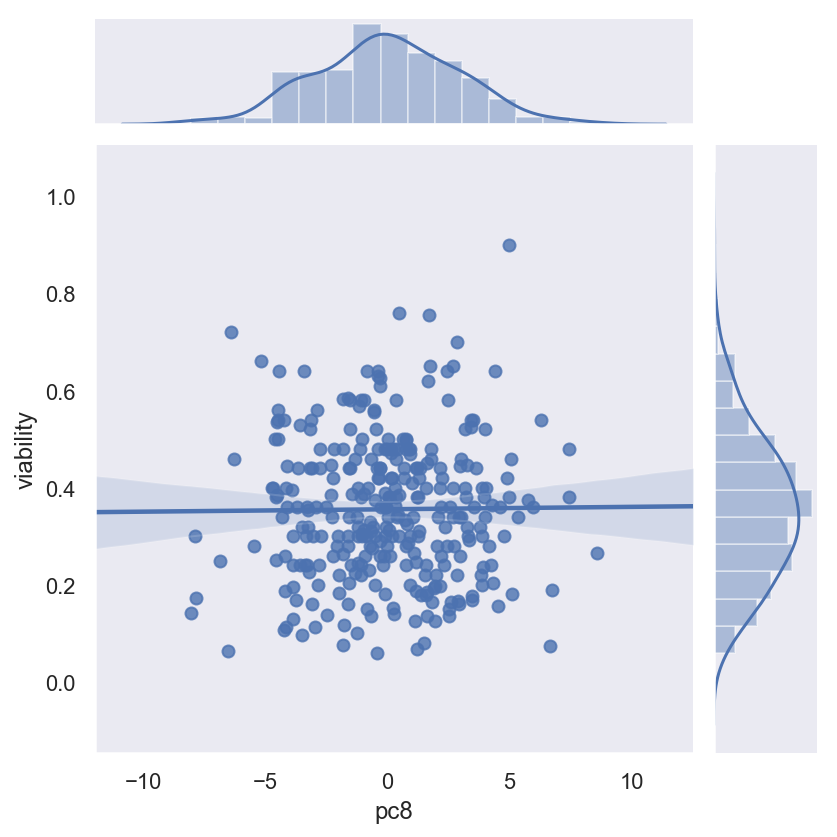

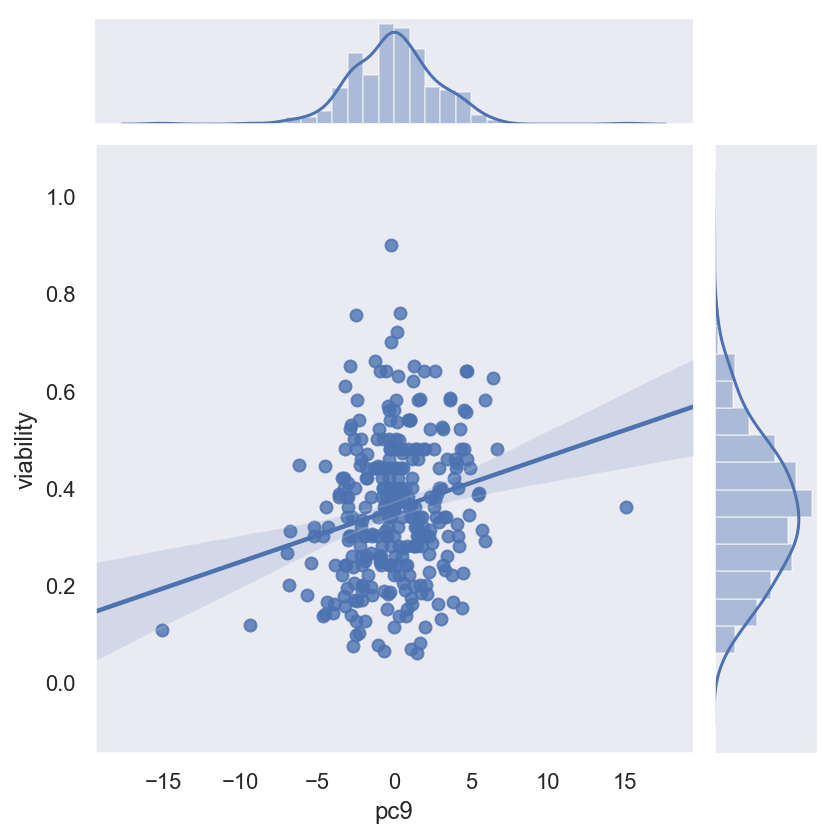

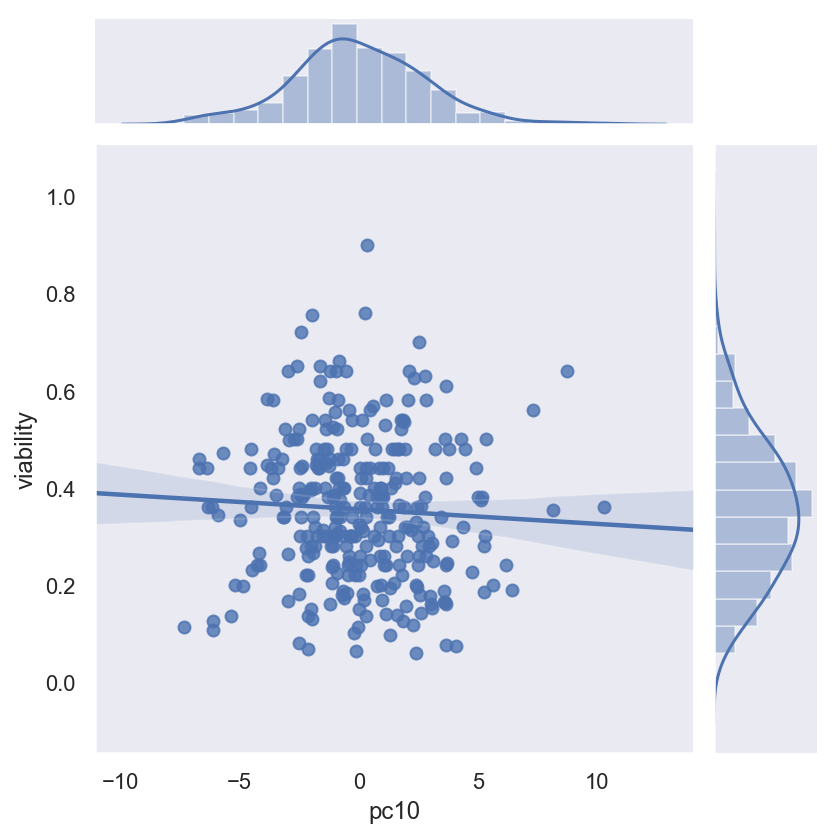

In [70]:
# PCA vs Viablity
via = viability.loc[:,'11']
via.name = 'viability'
pca_via = X_red.join(via,how='inner')

for nm, col in pca_via.iteritems():
    if nm!= 'viability':
        sns.jointplot(col,pca_via.viability,kind='reg')